<a href="https://colab.research.google.com/github/srilamaiti/ml_works/blob/main/sales_forecast_str_csc_day_level.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Installing New Libraries**

In [1]:
!pip install python-weather
!pip install meteostat
!pip install geopandas
!pip install geopy
!pip install pgeocode
!pip install pyowm
!pip install wwo-hist
!pip install openweathermap_requests
!pip install holidays
!pip install shap
!pip install optuna
!pip install hyperopt 
!pip install yellowbrick
!pip install interpret
!pip install ngboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

# **Importing Libraries**

In [2]:
from interpret.glassbox import ExplainableBoostingClassifier
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show
from interpret import perf
from scipy.stats import norm
from yellowbrick.regressor import residuals_plot
from yellowbrick.regressor import prediction_error
import lightgbm as lgb
import matplotlib.pyplot as plt
from datetime import datetime
from meteostat import Point, Daily
from geopy.geocoders import Nominatim
import xgboost
print(xgboost.__version__)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import pgeocode
import numpy as np
import pyowm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

from wwo_hist import retrieve_hist_data
from openweathermap_requests import OpenWeatherMapRequests
from statsmodels.formula.api import ols
import statsmodels.api as sm
import holidays
import datetime
from datetime import date
from datetime import timedelta
from matplotlib.pyplot import figure
import xgboost as xgb
from xgboost import plot_importance, plot_tree
import matplotlib.ticker as ticker
import shap

0.90


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option("display.precision", 8)

# **Holiday**

In [4]:
class holiday:
    """
    This class lists both Federal and State holidays for current year 
    and next 9 years.
    """
    def __init__(self):
        """
        This initialization method obtains current year and lists all USA states.
        """
        self.current_year = date.today().year
        self.states_list = [ 'AK', 'AL', 'AR', 'AZ', 'CA', 
                             'CO', 'CT', 'DC', 'DE', 'FL', 
                             'GA', 'HI', 'IA', 'ID', 'IL', 
                             'IN', 'KS', 'KY', 'LA', 'MA', 
                             'MD', 'ME', 'MI', 'MN', 'MO', 
                             'MS', 'MT', 'NC', 'ND', 'NE', 
                             'NH', 'NJ', 'NM', 'NV', 'NY', 
                             'OH', 'OK', 'OR', 'PA', 'RI', 
                             'SC', 'SD', 'TN', 'TX', 'UT', 
                             'VA', 'VT', 'WA', 'WI', 'WV', 'WY'
                            ]
        self.holiday_date_list = []
        self.holiday_details_list = []
        self.df_holiday = pd.DataFrame()
    
    def collect_federal_holiday_list(self):
        """
        This method lists all federal holidays along with observed ones
        in USA in a given year.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            # Print all the holidays in United States in the year 
            for federal_holiday_val in holidays.UnitedStates(years = year, observed = True).items():
                print(f"Federal Holiday :: {str(federal_holiday_val[0])} :: {federal_holiday_val[1]}")
                self.holiday_date_list.append(federal_holiday_val[0])
                self.holiday_details_list.append(('FE', 
                                                  year, 
                                                  str(federal_holiday_val[0]), 
                                                  federal_holiday_val[1]
                                                 )
                                                )

    def collect_state_holiday_list(self):
        """
        This method lists all state holidays along with observed ones
        in USA in a given year which are not federal holidays.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            for state in self.states_list:
                for state_holiday_val in holidays.UnitedStates(years = year, observed = True, subdiv = state).items():
                    if state_holiday_val[0] not in self.holiday_date_list:
                        print(f"State {state} Holiday :: {str(state_holiday_val[0])} :: {state_holiday_val[1]}")
                        self.holiday_date_list.append(state_holiday_val[0])
                        self.holiday_details_list.append((state, 
                                                          year, 
                                                          str(state_holiday_val[0]), 
                                                          state_holiday_val[1]
                                                          )
                                                        )
    
    def get_holiday(self, year):
        """
        This method provides the list of federal and state holidays 
        in a given year. It also writes the data in a csv file with name format 
        as holiday_list_<<4 digit year, comes from input parameter>>.csv.
        """
        yearly_holiday_list = []
        print(f"List of holidays in {year}:-")
        #print(self.holiday_details_list)
        for holiday_val in self.holiday_details_list:
            if holiday_val[1] == year:
                print(f"{holiday_val[0]} :: {holiday_val[1]} :: {holiday_val[2]} :: {holiday_val[3]}")
                yearly_holiday_list.append(holiday_val)
        self.df_holiday = pd.DataFrame(yearly_holiday_list, columns =['level', 'year', 'date', 'holiday_name'])
        #print(self.df_holiday)
        self.df_holiday.to_csv('holiday_list_' + str(year) + '.csv', index = False)
        return self.df_holiday
    
    def __repr__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}")

    def __str__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}") 

current_year = date.today().year
hdy = holiday()
help(holiday)
hdy.collect_federal_holiday_list()
hdy.collect_state_holiday_list()

current_year_hdy = hdy.get_holiday(current_year)
one_year_ago_year_hdy = hdy.get_holiday(current_year-1)
two_year_ago_year_hdy = hdy.get_holiday(current_year-2)
three_year_ago_year_hdy = hdy.get_holiday(current_year-3)
df_holiday_combined = pd.concat([current_year_hdy, one_year_ago_year_hdy, two_year_ago_year_hdy])

Help on class holiday in module __main__:

class holiday(builtins.object)
 |  This class lists both Federal and State holidays for current year 
 |  and next 9 years.
 |  
 |  Methods defined here:
 |  
 |  __init__(self)
 |      This initialization method obtains current year and lists all USA states.
 |  
 |  __repr__(self)
 |      This method prints states list and current year.
 |  
 |  __str__(self)
 |      This method prints states list and current year.
 |  
 |  collect_federal_holiday_list(self)
 |      This method lists all federal holidays along with observed ones
 |      in USA in a given year.
 |  
 |  collect_state_holiday_list(self)
 |      This method lists all state holidays along with observed ones
 |      in USA in a given year which are not federal holidays.
 |  
 |  get_holiday(self, year)
 |      This method provides the list of federal and state holidays 
 |      in a given year. It also writes the data in a csv file with name format 
 |      as holiday_list_<<4 d

In [5]:
df_holiday_combined

,level,year,date,holiday_name
0,FE,2022,2022-01-01,New Year's Day
1,FE,2022,2022-01-17,Martin Luther King Jr. Day
2,FE,2022,2022-02-21,Washington's Birthday
3,FE,2022,2022-05-30,Memorial Day
4,FE,2022,2022-06-19,Juneteenth National Independence Day
...,...,...,...,...
44,VA,2020,2020-01-17,Lee Jackson Day
45,VT,2020,2020-03-03,Town Meeting Day
46,VT,2020,2020-08-16,Bennington Battle Day
47,VT,2020,2020-08-17,Bennington Battle Day (Observed)


# **Setting up the Period**

In [6]:
# Set time period
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 31)

# **Getting Weather Data at Day and Zipcode Level**

In [7]:
df_weather = pd.read_csv('result_3zip_weather.csv')
df_weather.columns = [col.lower() for col in df_weather.columns]
df_weather['zip5'] = df_weather['zip5'].astype(str)
df_weather['zip5'] = df_weather['zip5'].apply(lambda x : x.zfill(5))
df_weather.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,last_update_ts
0,01749,2019-03-20,50.8,24.3,1,0,6,30,LOW,14.9,30,18.8,0.0,0.0,44.8,3,OTH,2019-03-20 07:31:11.000 -0600
1,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,2019-03-20 07:31:11.000 -0600
2,05673,2019-03-20,44.9,16.9,3,0,6,0,LOW,11.9,47,23.1,0.0,0.0,37.1,6,OTH,2019-03-20 07:31:11.000 -0600
3,01749,2019-03-21,51.5,32.2,26,66,6,30,MINIMAL,14.9,41,26.5,0.5,0.0,46.1,93,OTH,2019-03-21 07:31:31.000 -0600
4,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,2019-03-21 07:31:31.000 -0600


# **Loading 5 digit zip codes for Shaws stores.**

In [8]:
df_zip = pd.read_csv('zipcode.txt')
df_zip.columns = [col.lower() for col in df_zip.columns]
df_zip = df_zip.drop_duplicates()
df_zip['zipcode'] = df_zip['zipcode'].apply(lambda x : x.replace("'",""))
df_zip.head()

,zipcode
0,05602
1,02067
2,04530
3,02199
4,02126


In [9]:
df_zip[df_zip.zipcode == '03458']

,zipcode
148,03458


# **Loading Shaw's Stores Store-Zipcode Combination Data**

In [10]:
df_str_zip = pd.read_csv('store_zipcode.txt')
df_str_zip['zip_code'] = df_str_zip['zip_code'].astype(str)
df_str_zip['zip_code'] =  df_str_zip['zip_code'].apply(lambda x : x.zfill(5))
df_str_zip.columns = ['store_id', 'zip_code']
df_str_zip.rename(columns={'zip_code':'zip5'}, inplace = True)
df_str_zip.head()

,store_id,zip5
0,121,05602
1,418,02067
2,553,04530
3,602,02199
4,604,02126


In [11]:
df_str_zip[df_str_zip.zip5 == '03458']

,store_id,zip5
148,4694,03458


# **Combining weather and zip code data together.**

In [12]:
df_weather = pd.merge(df_weather, df_str_zip, how = 'inner', on = 'zip5')

In [13]:
df_weather.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'last_update_ts',
       'store_id'],
      dtype='object')

In [14]:
df_weather = df_weather [['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 
       'store_id']]
df_weather = df_weather[df_weather['zip5'].isin(['02747','05673','05764'])]

In [15]:
df_weather.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
Name: 1329, dtype: object

# **Getting historical min, max and avg temp weather data on a particular day and zipcode level.**

05602


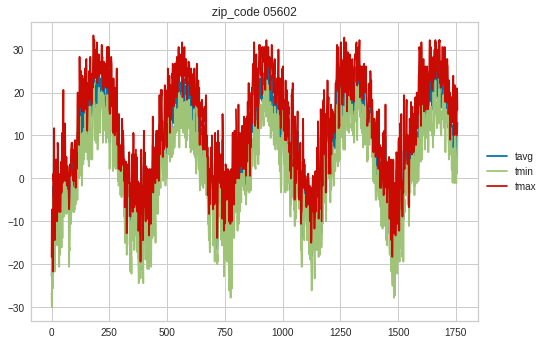

02067


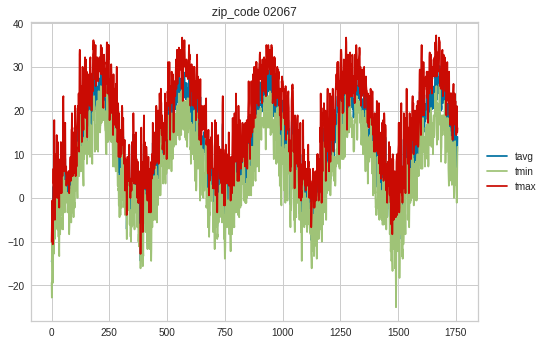

04530


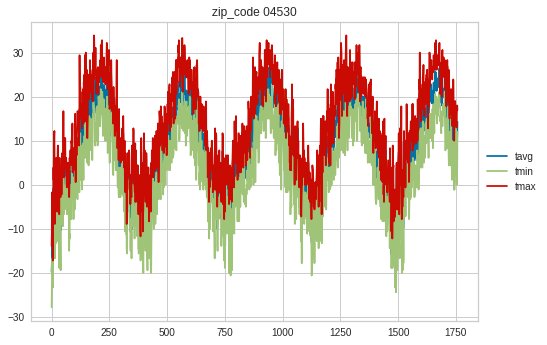

02199


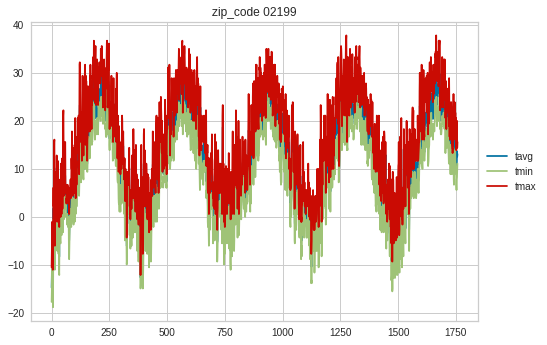

02126


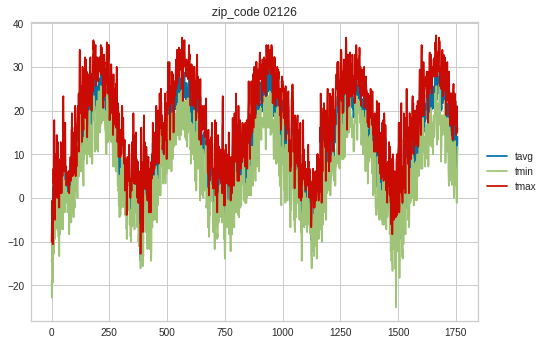

05446


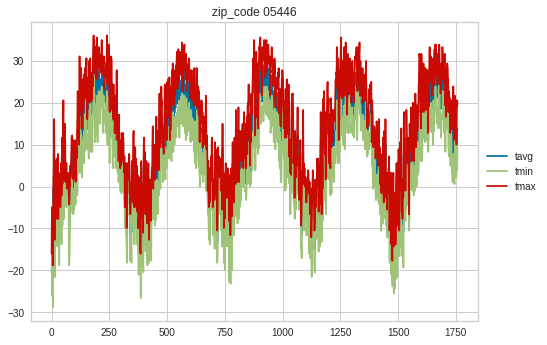

02747


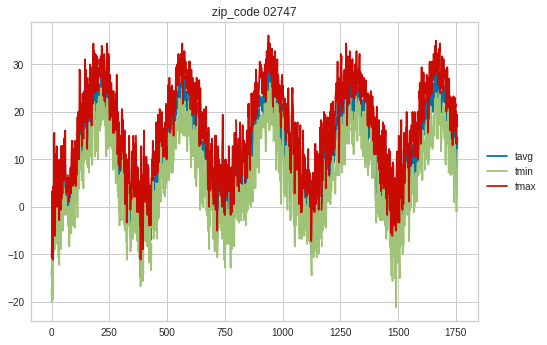

01757


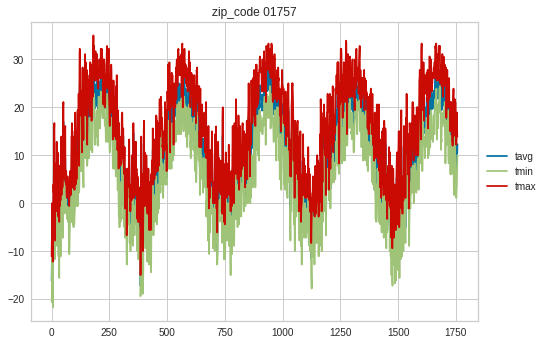

03087


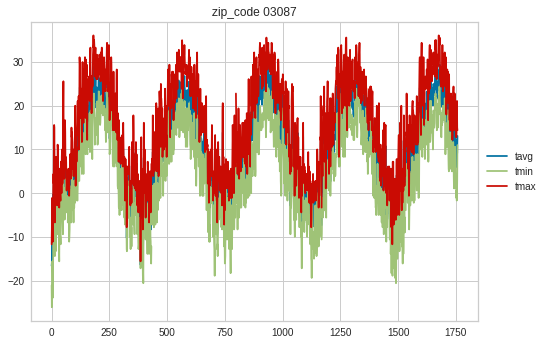

02341


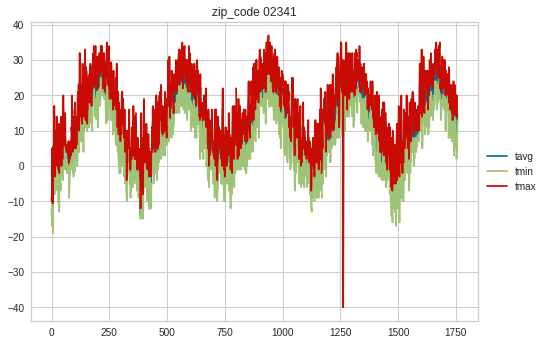

02720


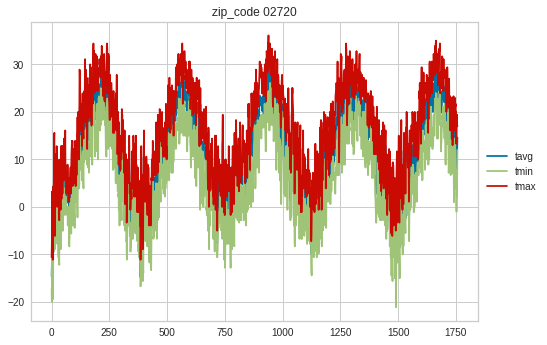

02052


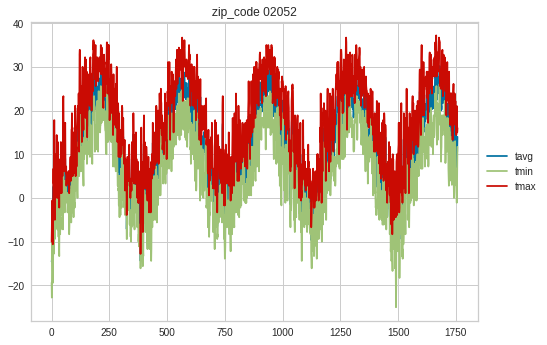

01721


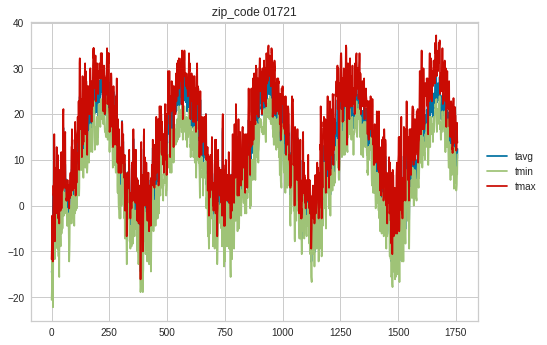

02453


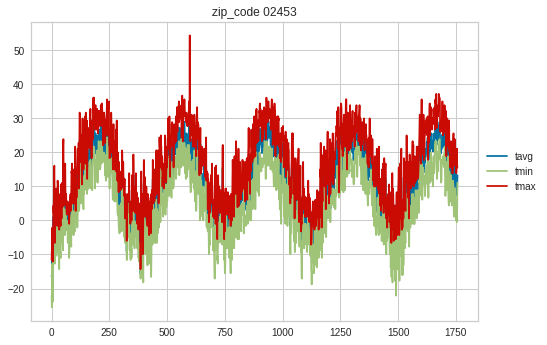

02025


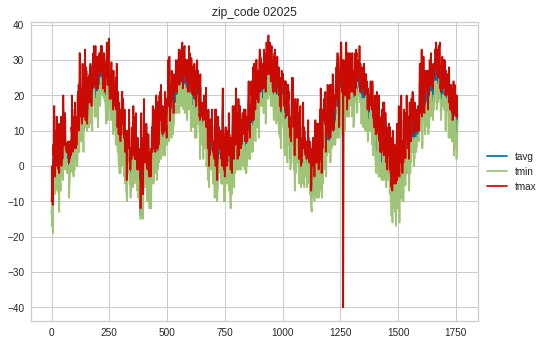

05495


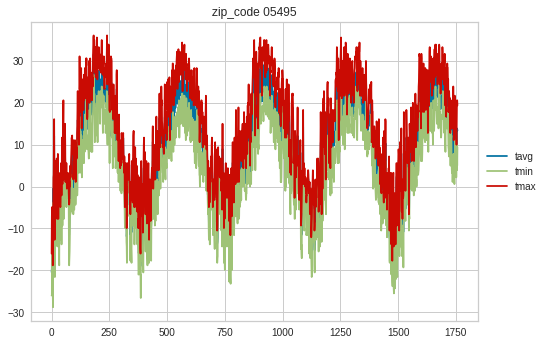

03785


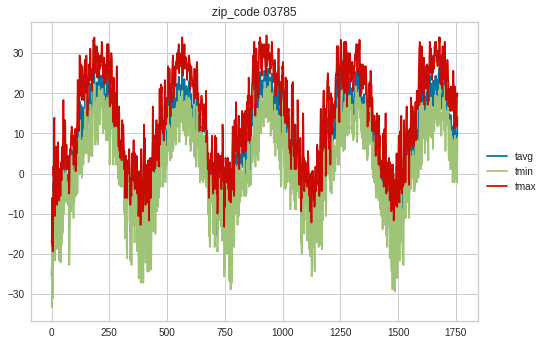

04210


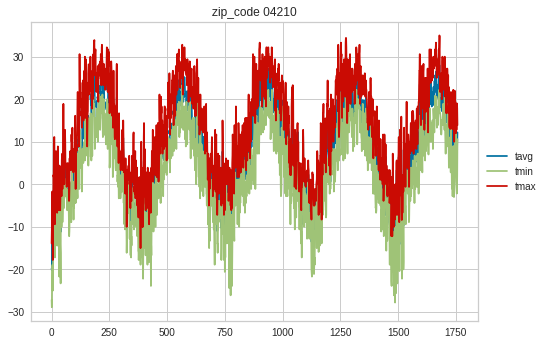

04330


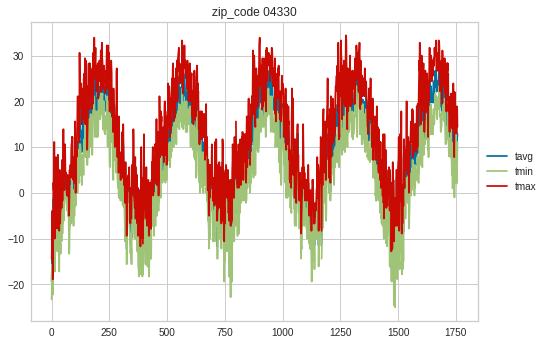

01776


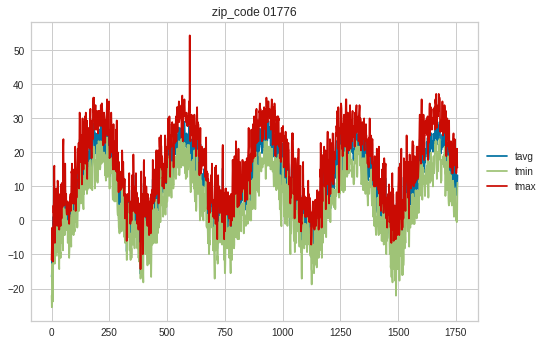

02169


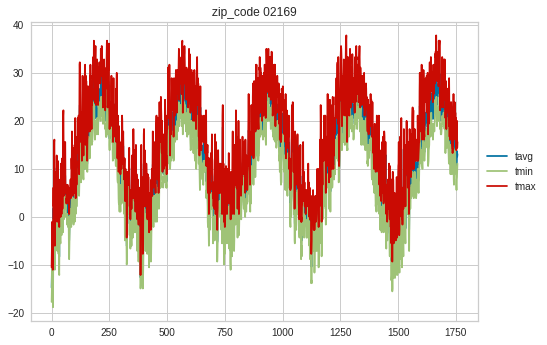

04072


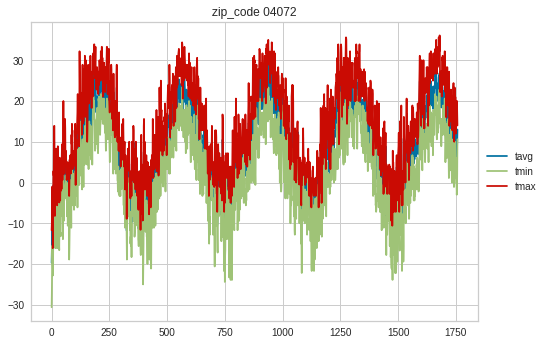

02189


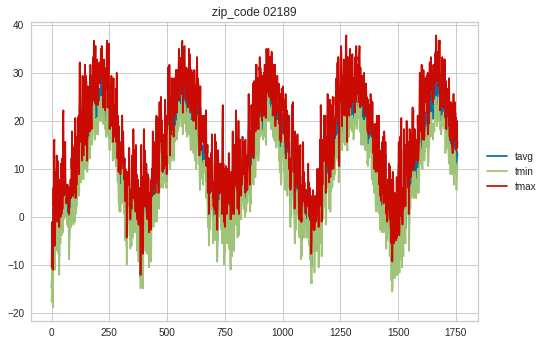

03038


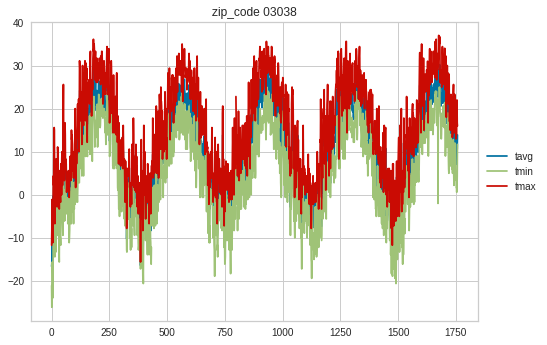

02460


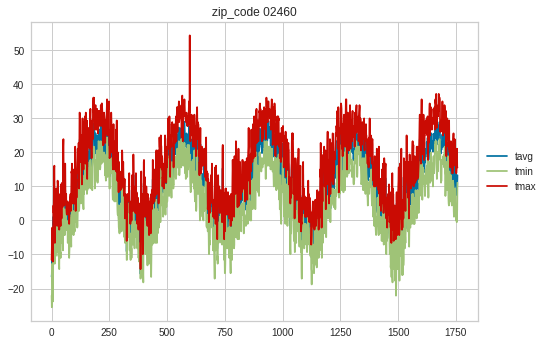

02038


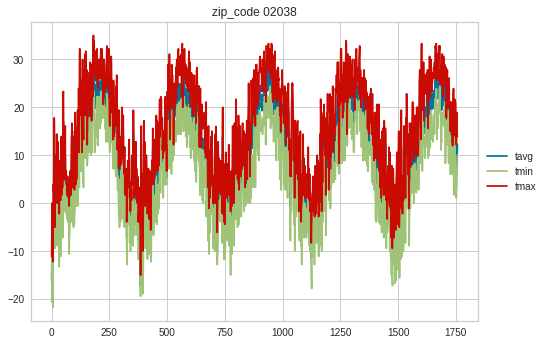

02215


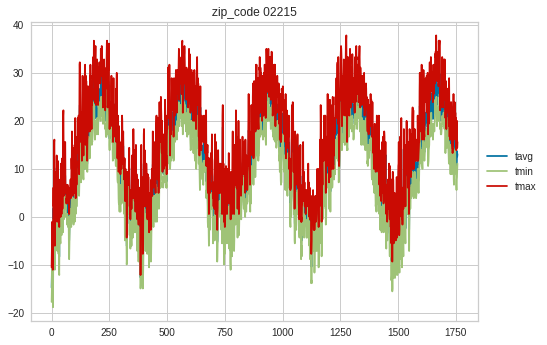

01915


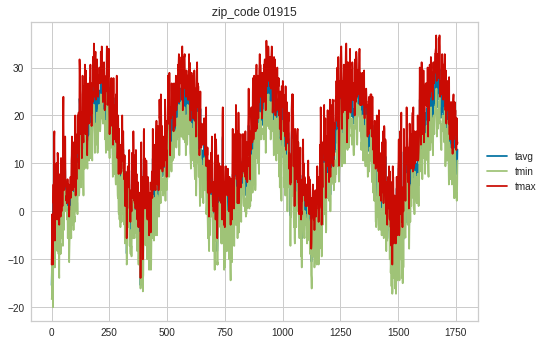

04105


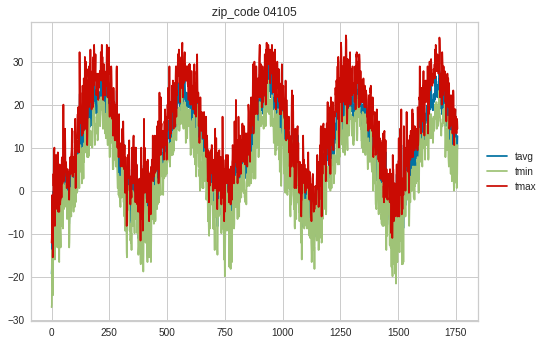

04605


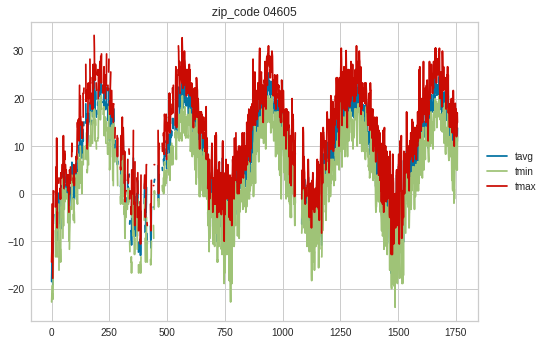

03060


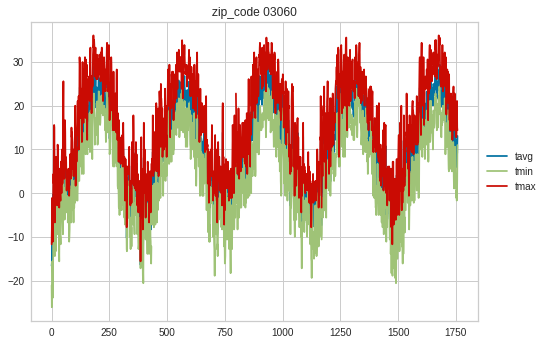

05403


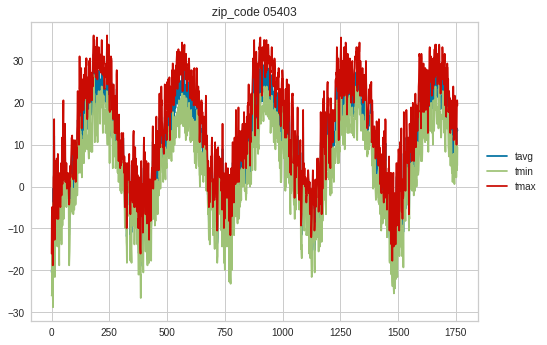

02140


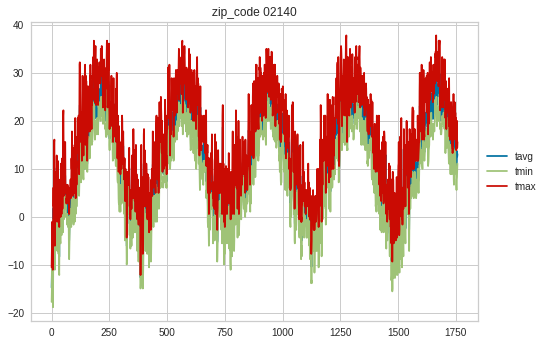

05363


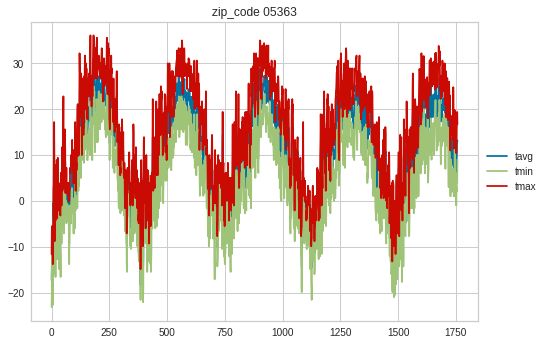

05673


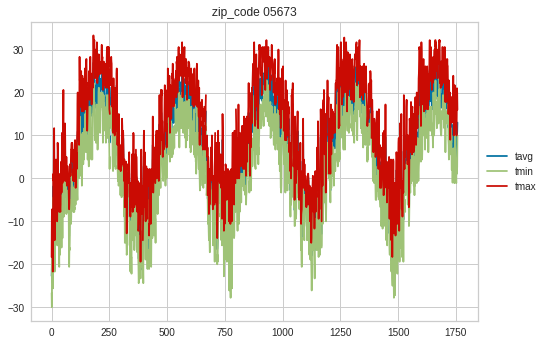

02026


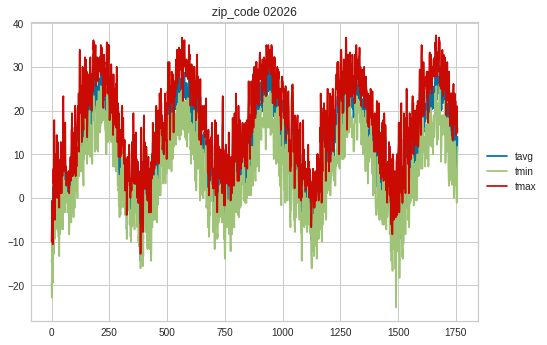

02021


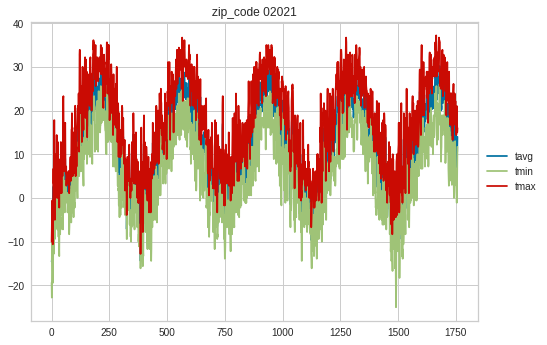

02048


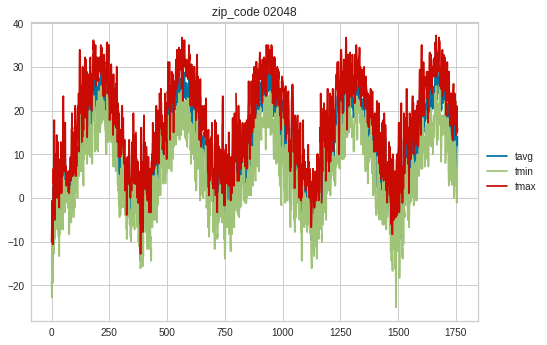

02339


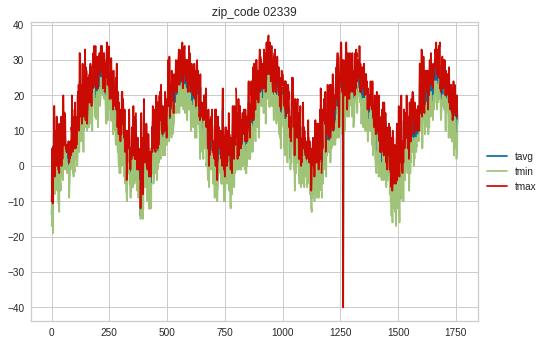

02886


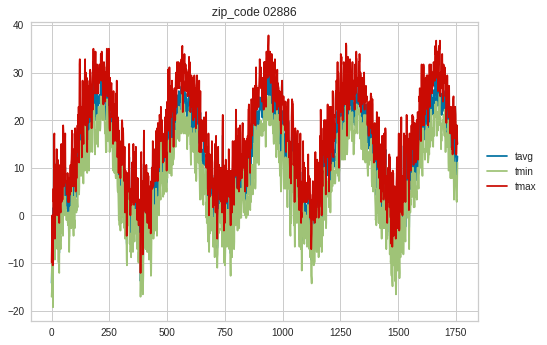

03053


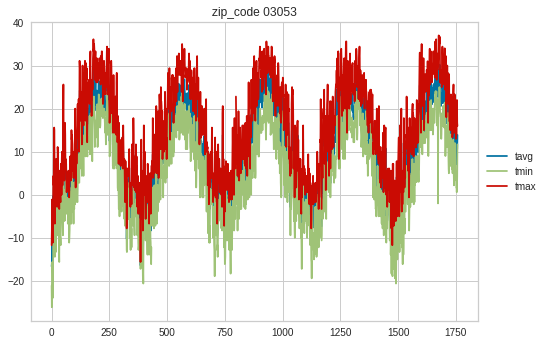

01803


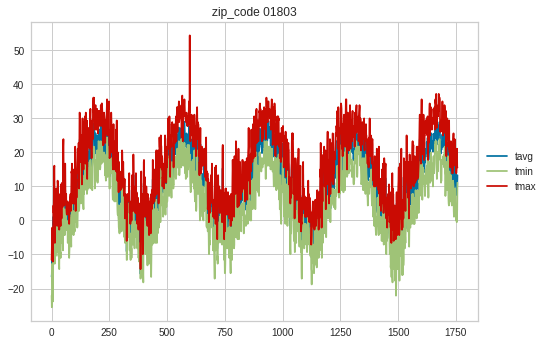

05060


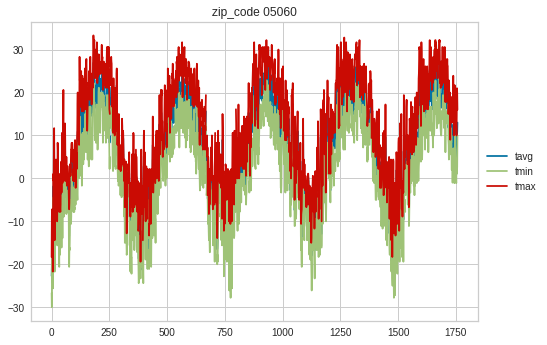

05255


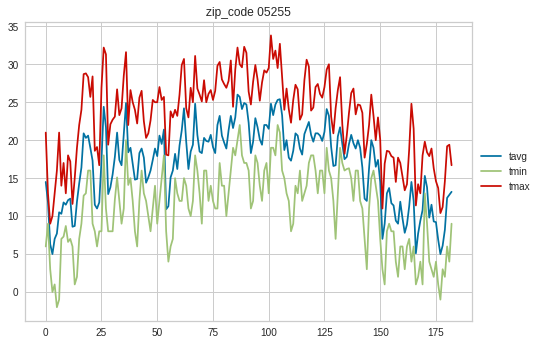

02536


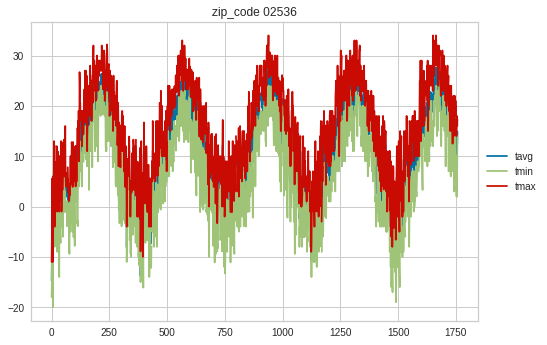

04032


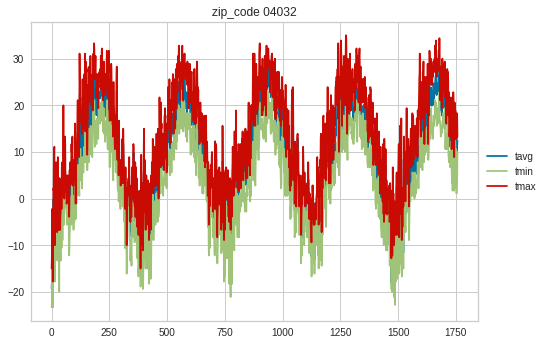

05829


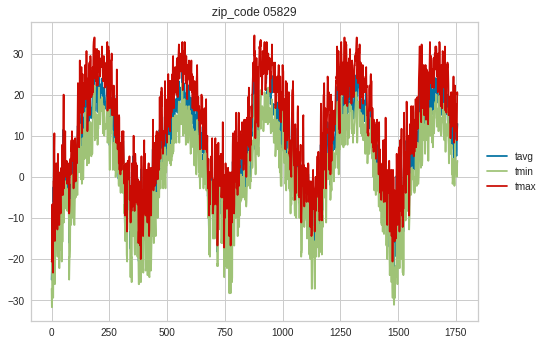

03885


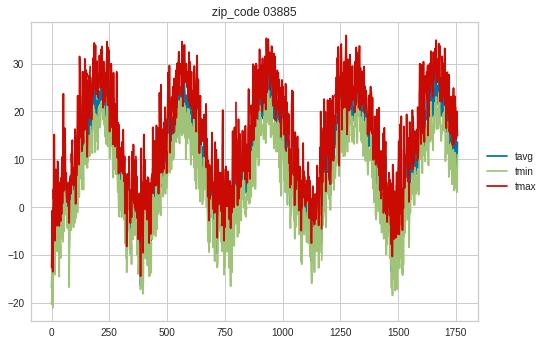

01603


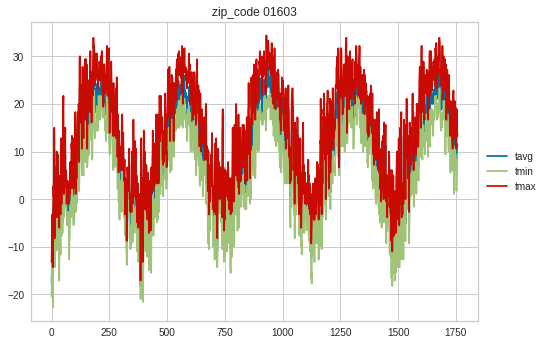

01605


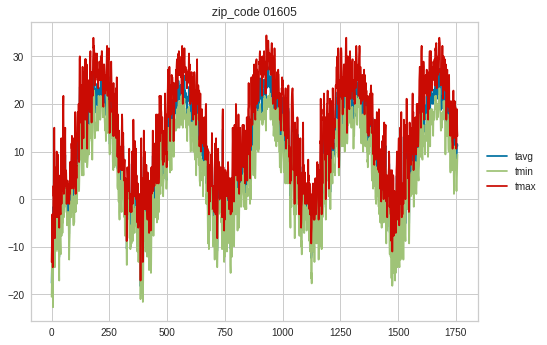

02920


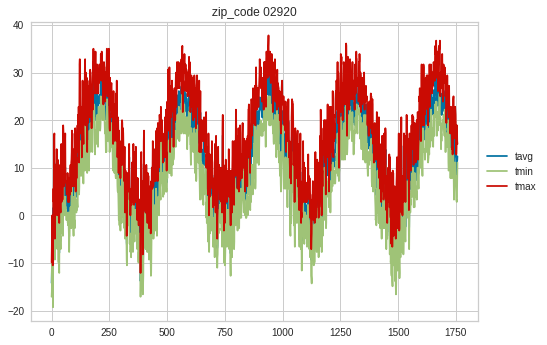

01450


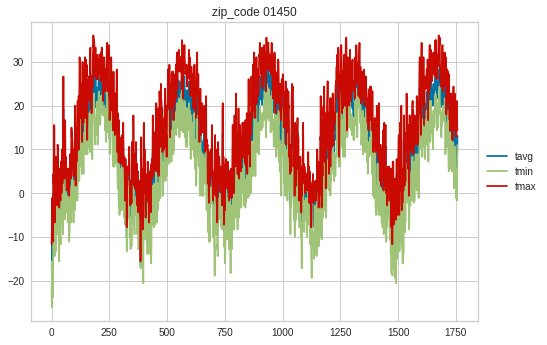

04011


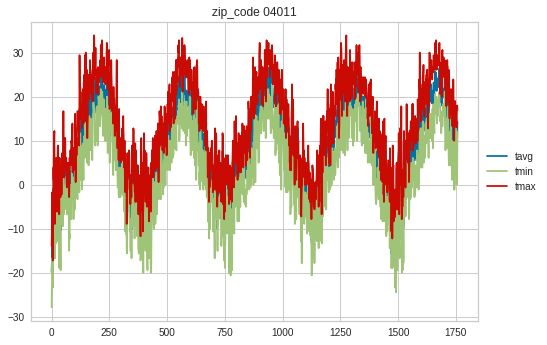

04426
02467


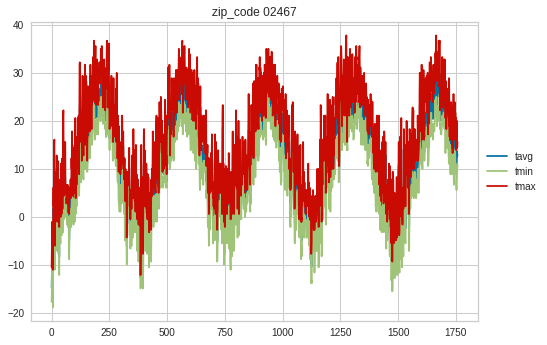

05676


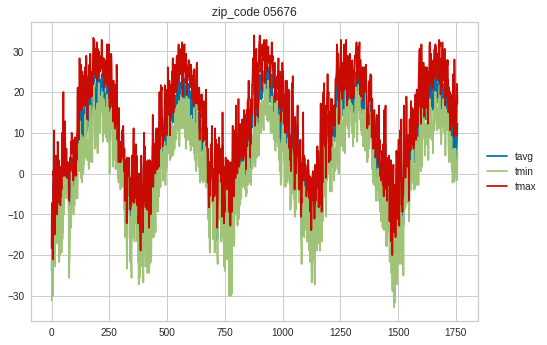

01510


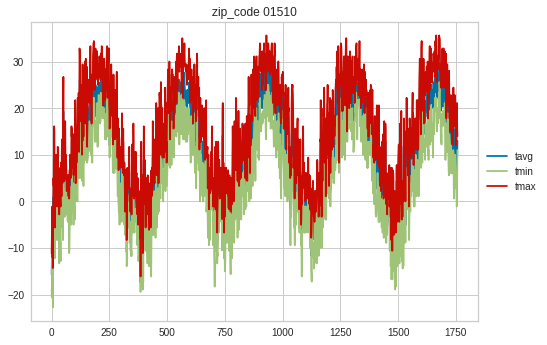

03054


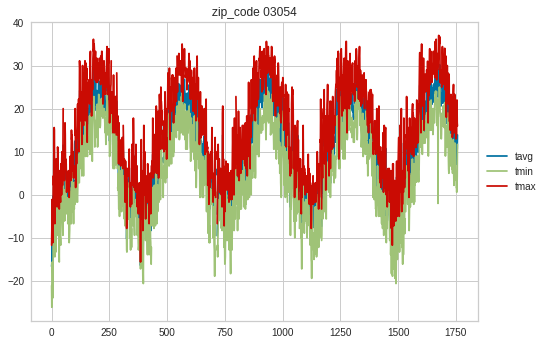

02653


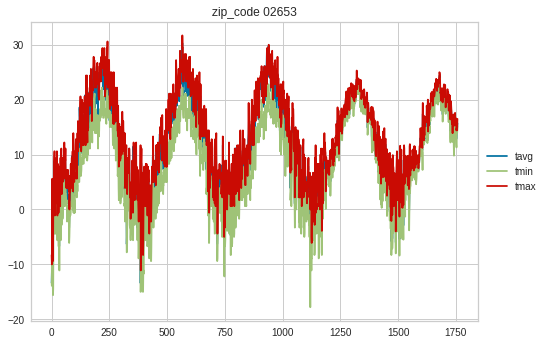

03301


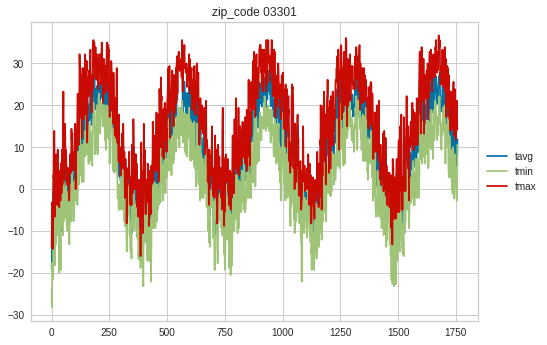

02128


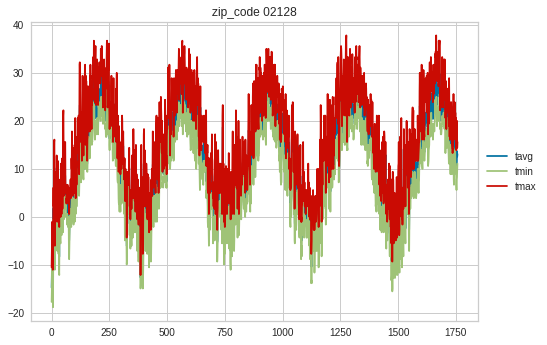

05753


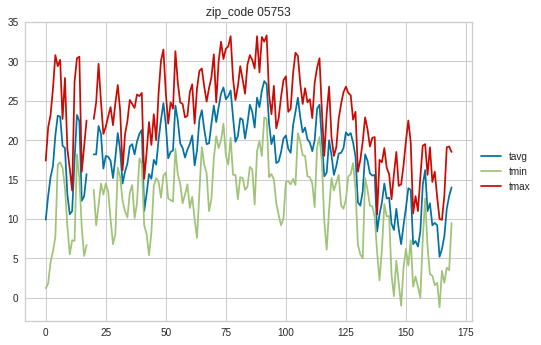

05764


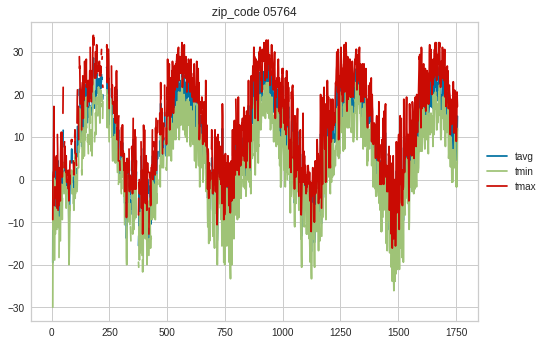

05743


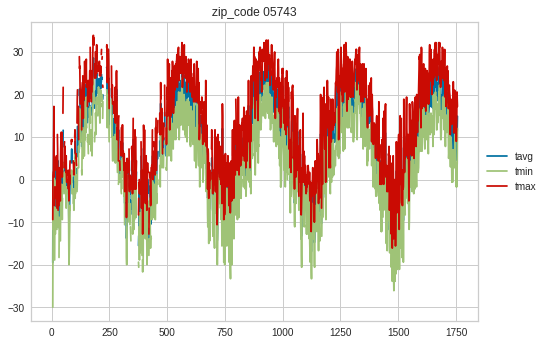

02349


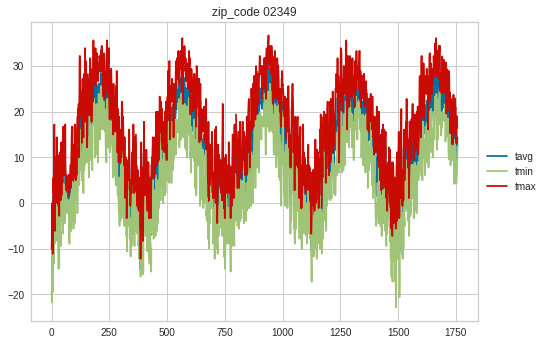

02184


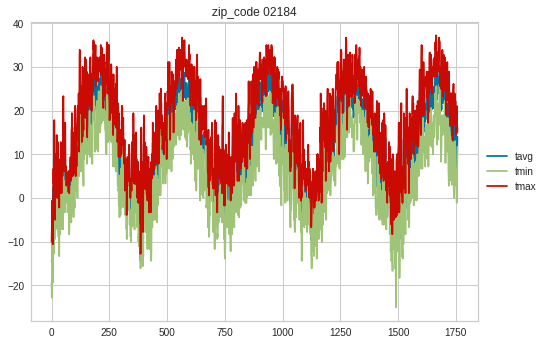

02760


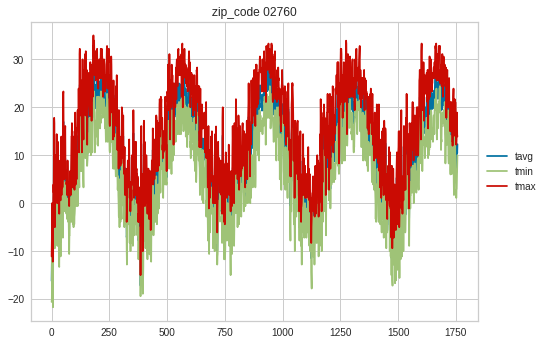

02368


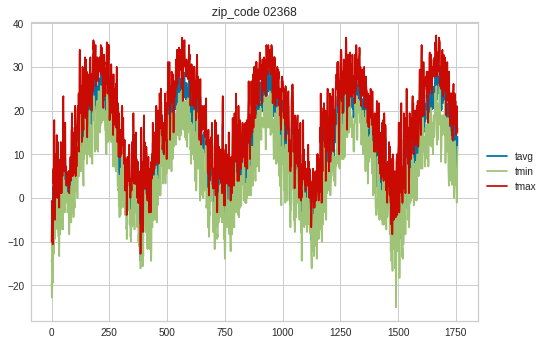

02767


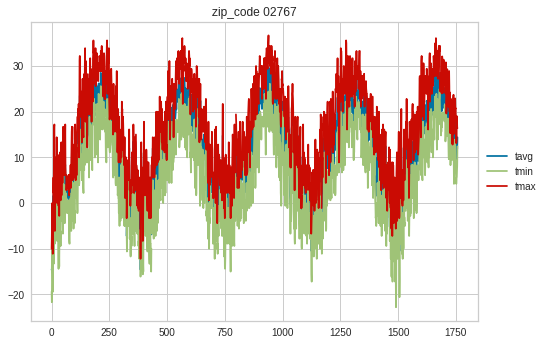

02301


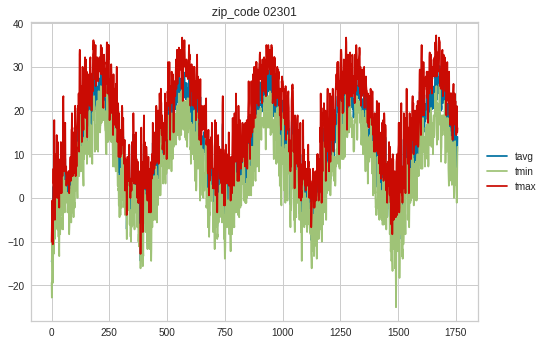

02053


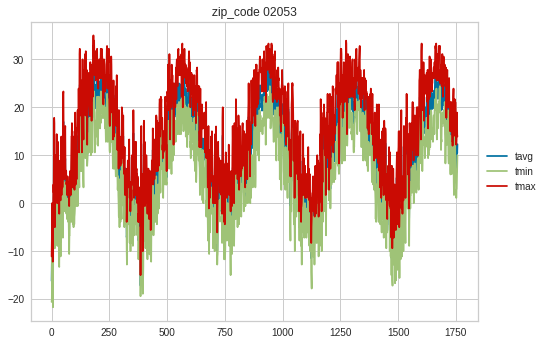

01588


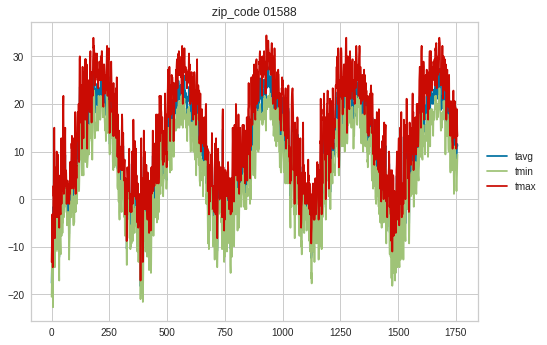

02806


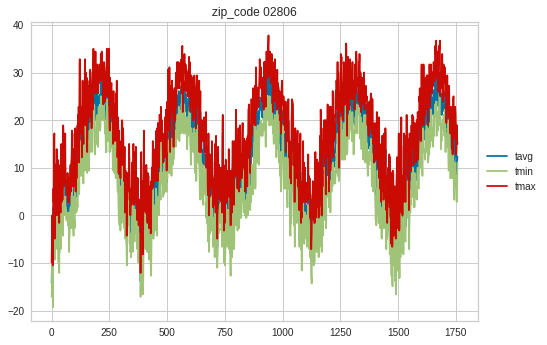

02842


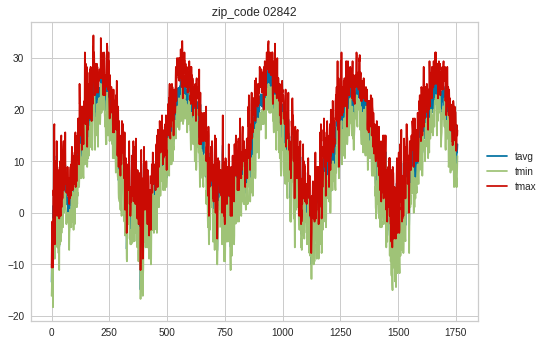

02601


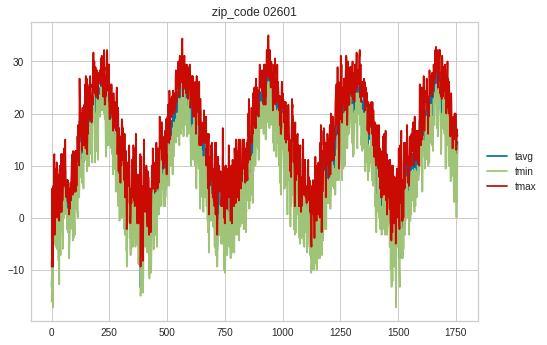

04578


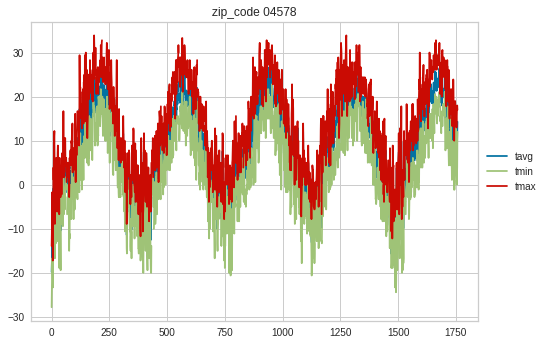

02330


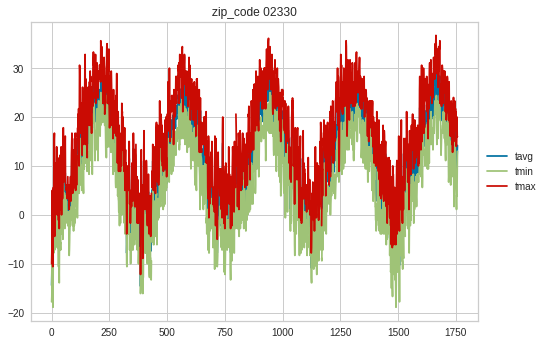

03220


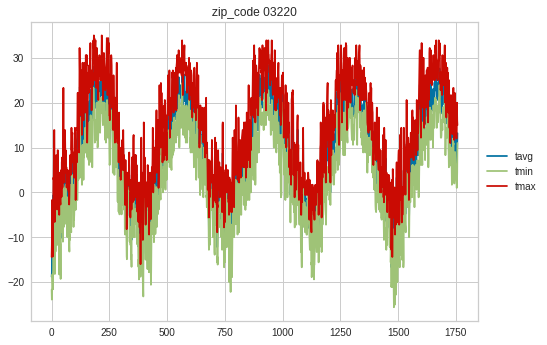

05672


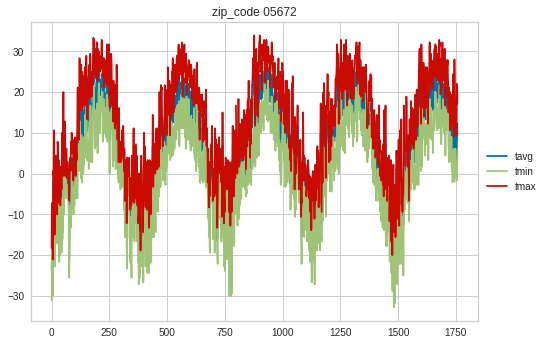

03818
02356


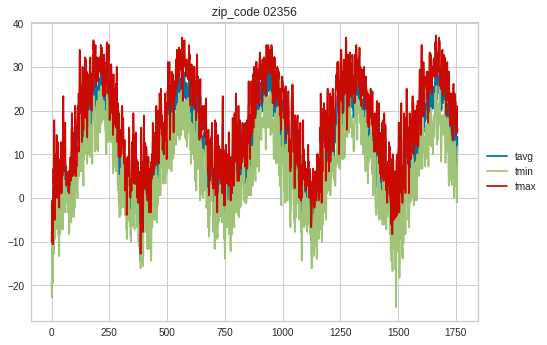

02879


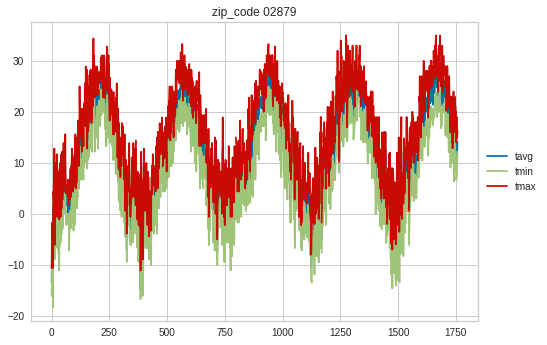

01545


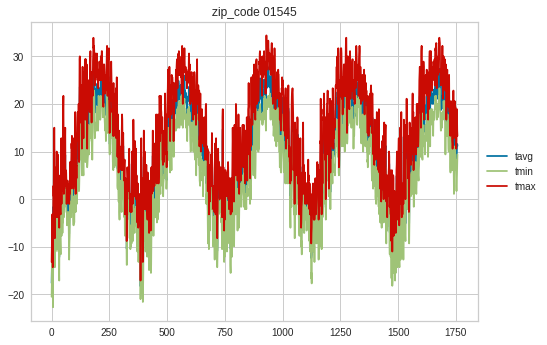

01566


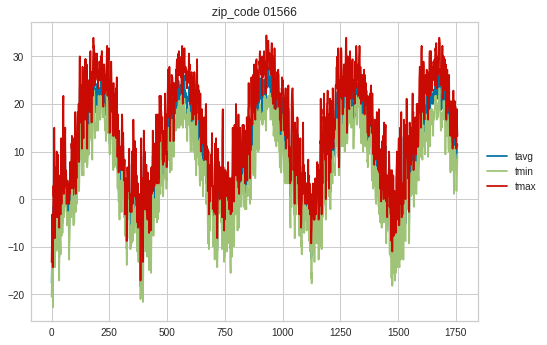

01960


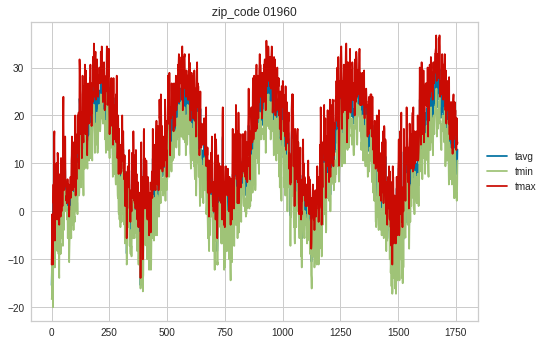

03820


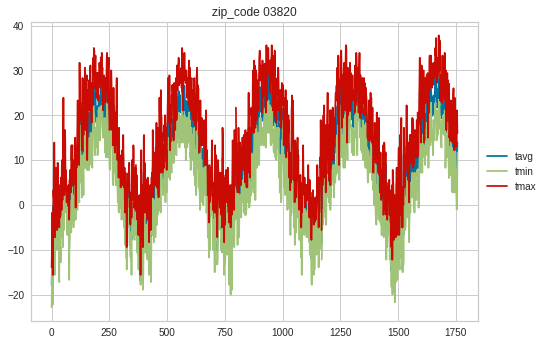

01950


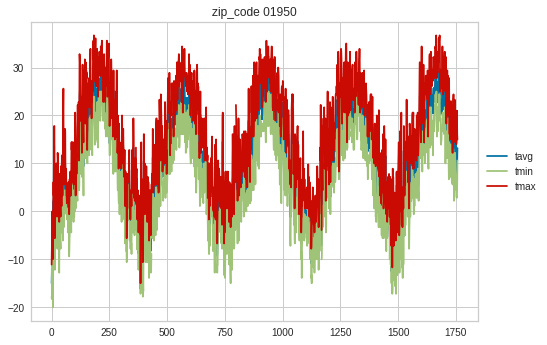

03055


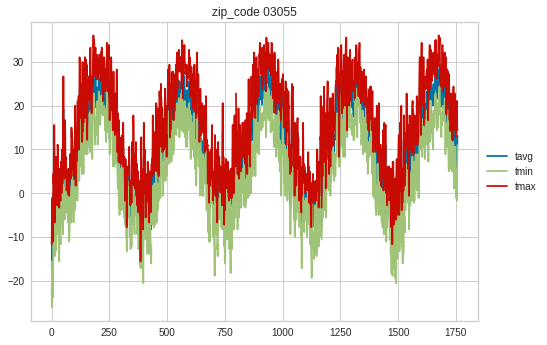

01970


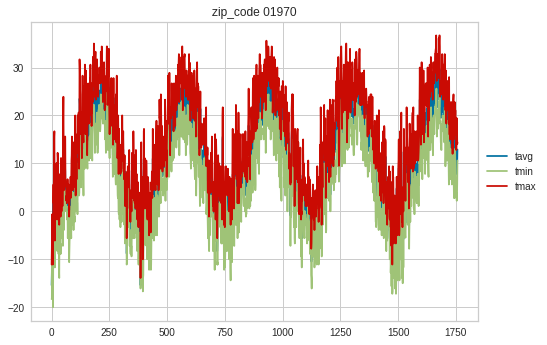

05149


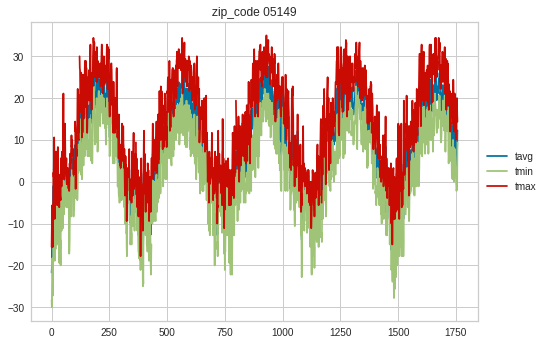

05156


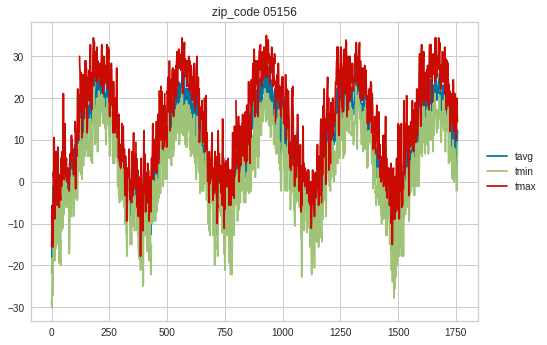

03584
05491


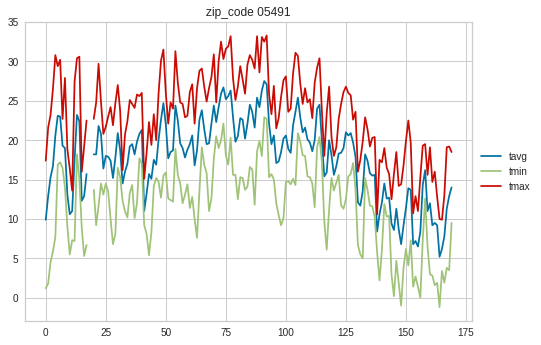

04062


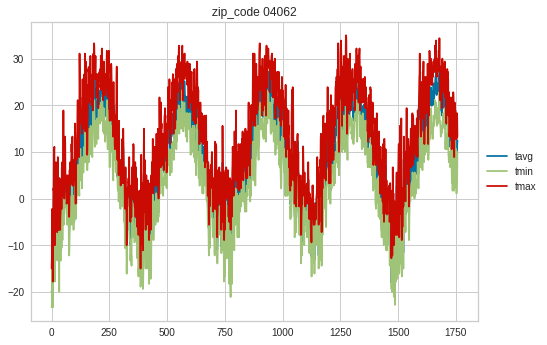

04103


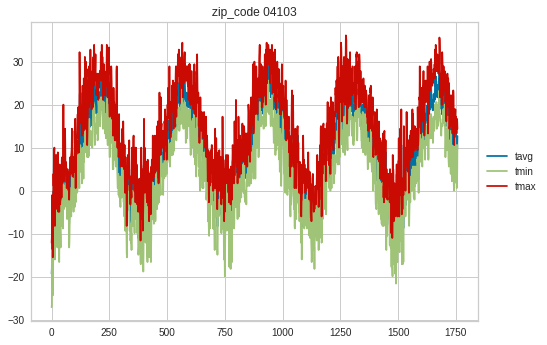

04074


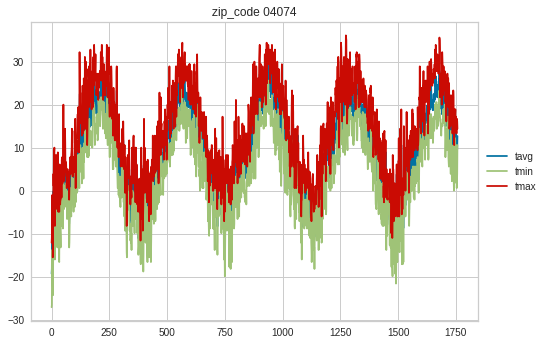

02138


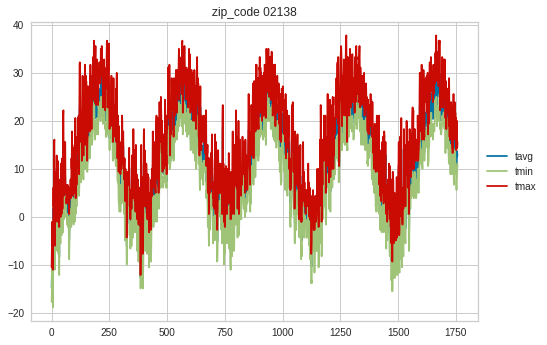

02452


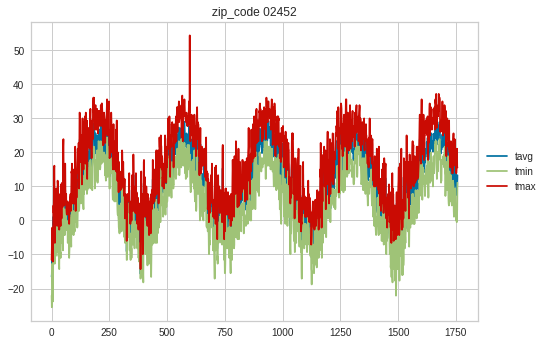

02145


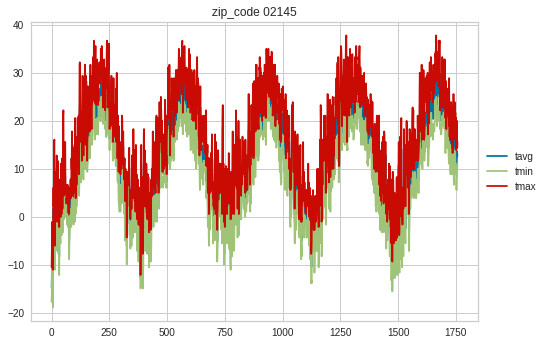

02136


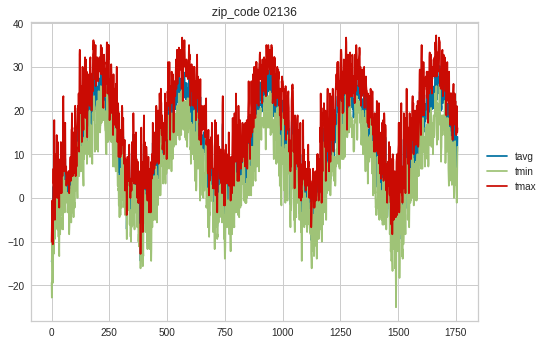

02478


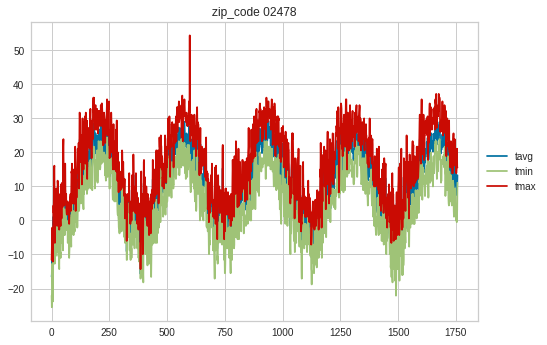

01775


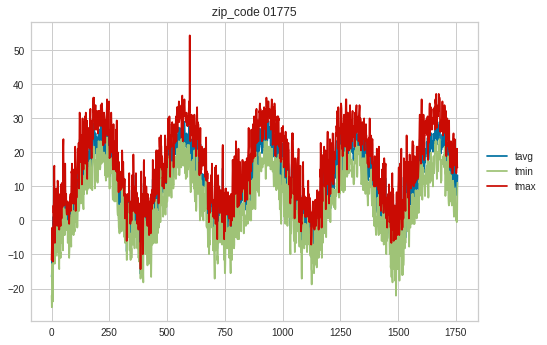

02360


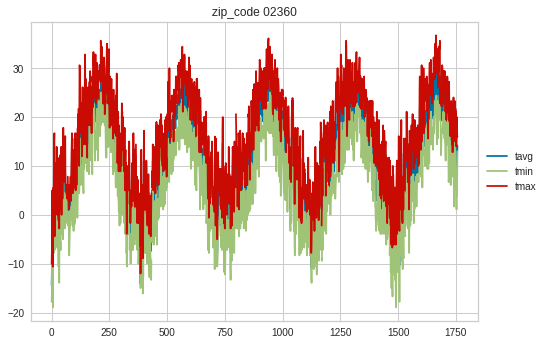

02050


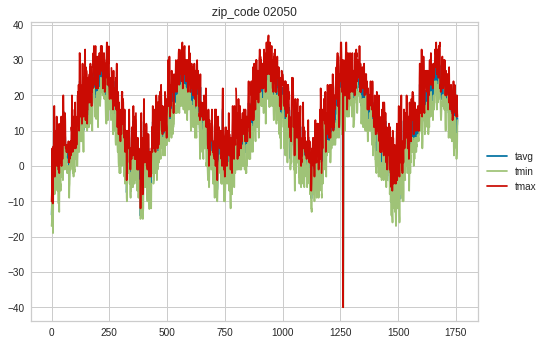

03561


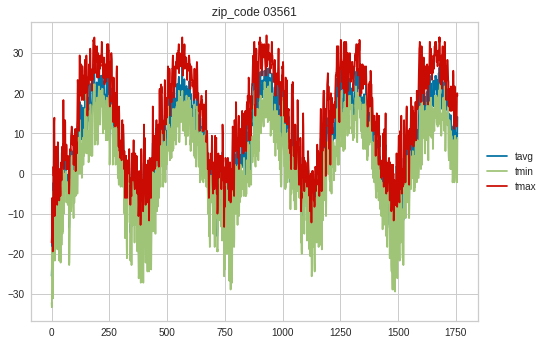

02571


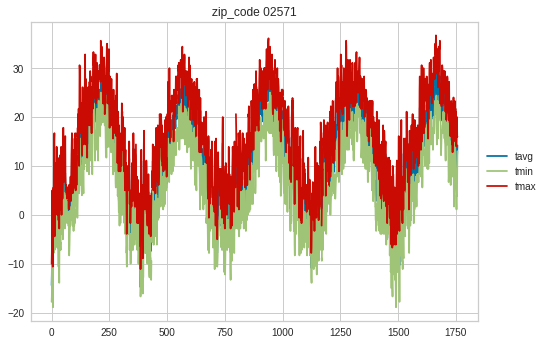

01749


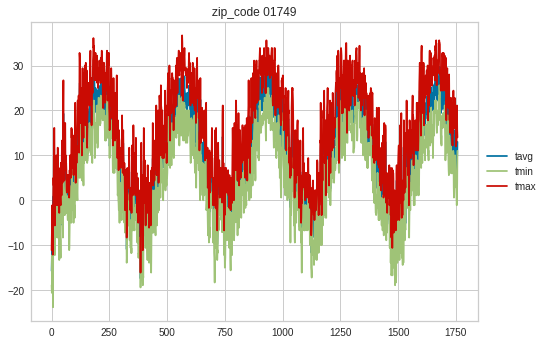

02915


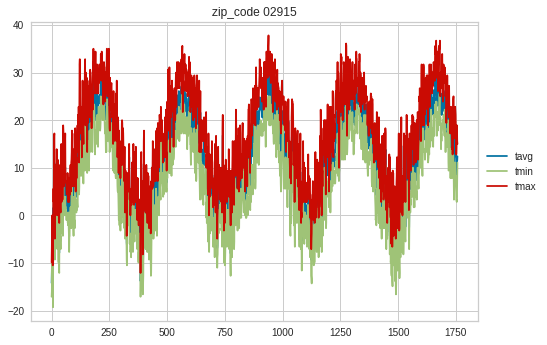

02176


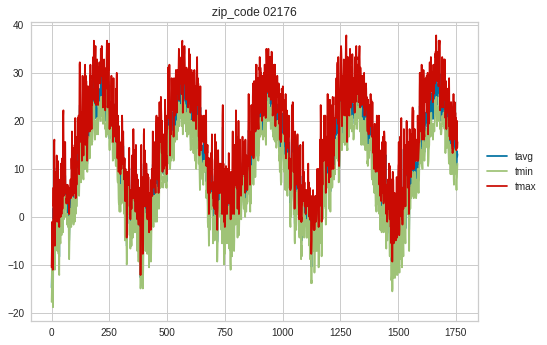

05443


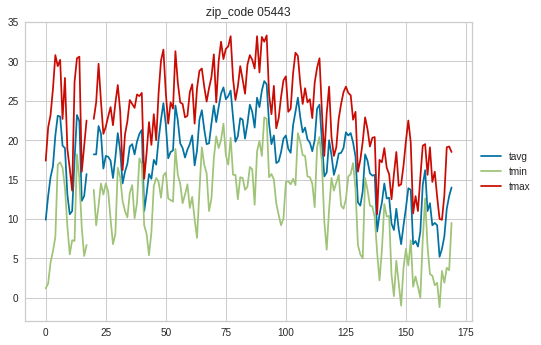

03608


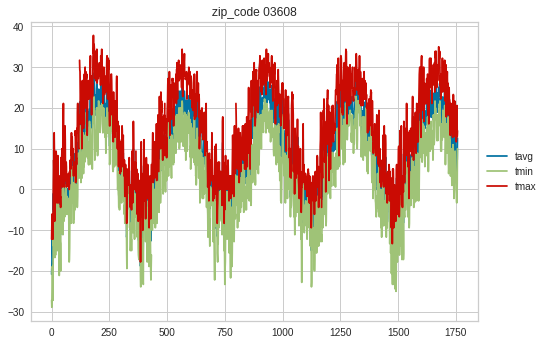

04106


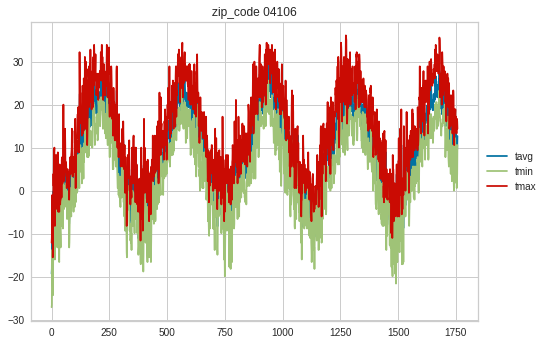

04841


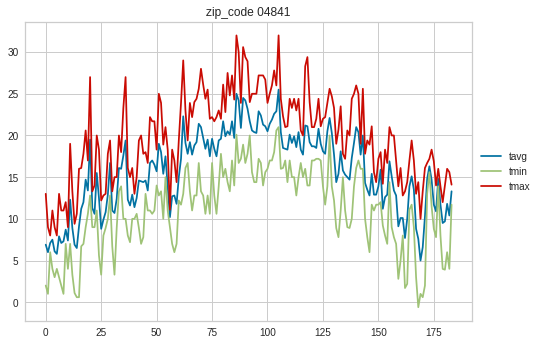

04901


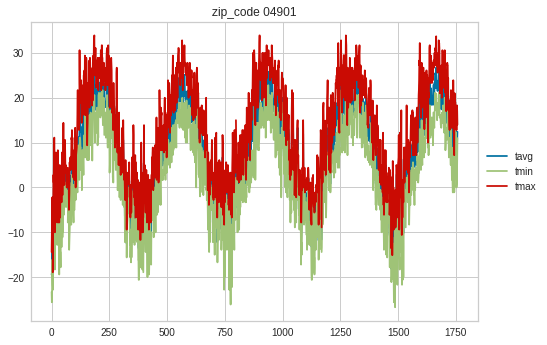

02445


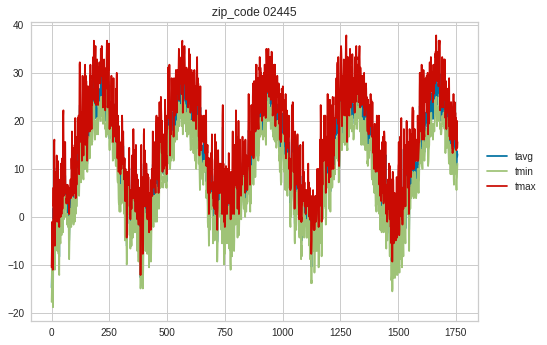

02062


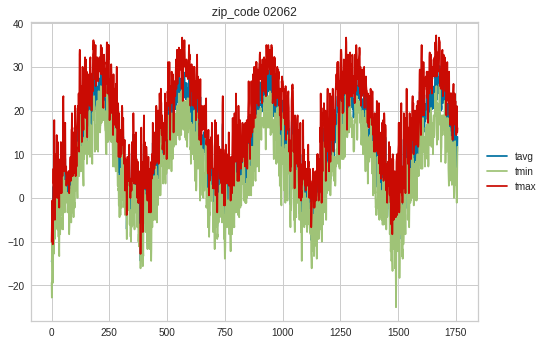

02132


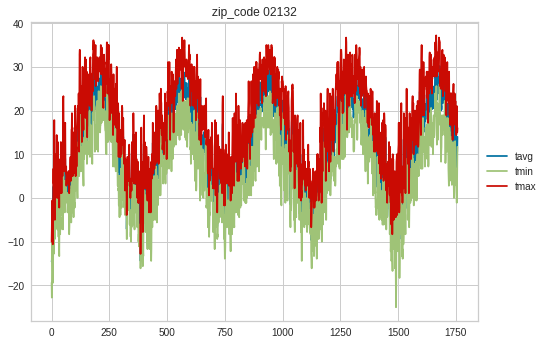

02143


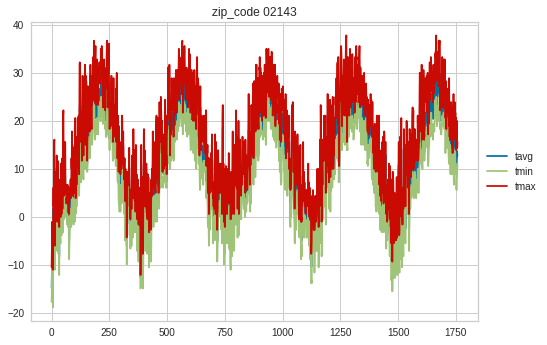

01930


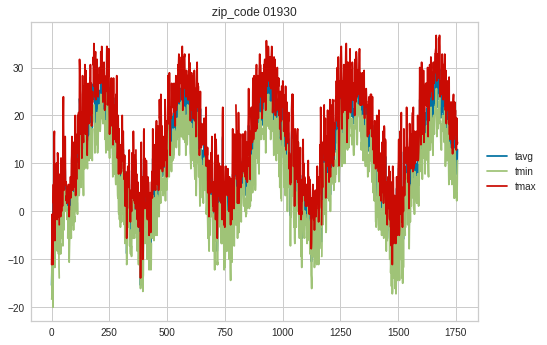

01880


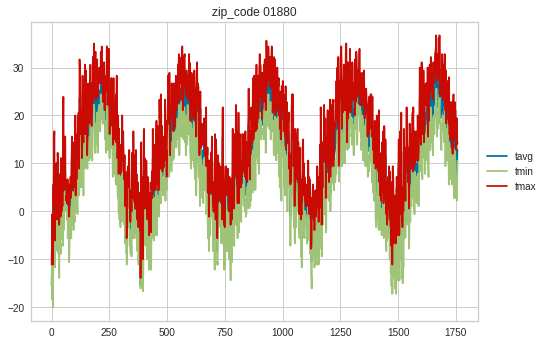

03865


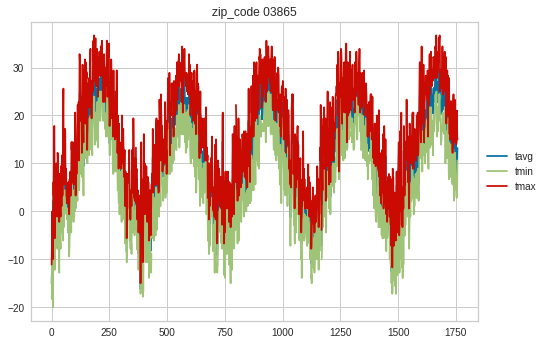

02914


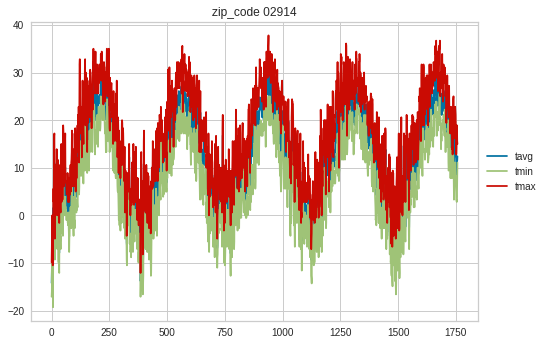

02664


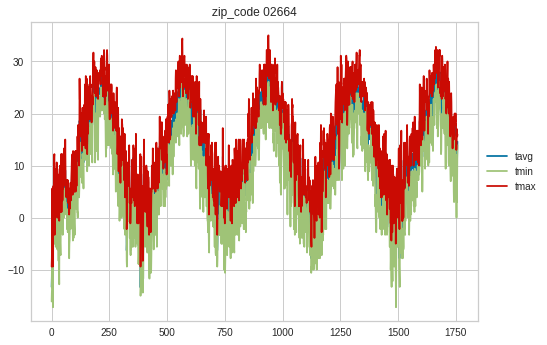

02114


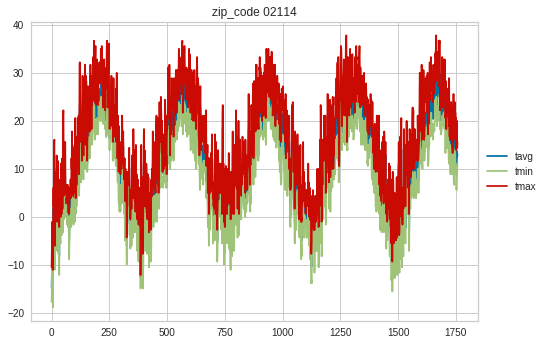

02302


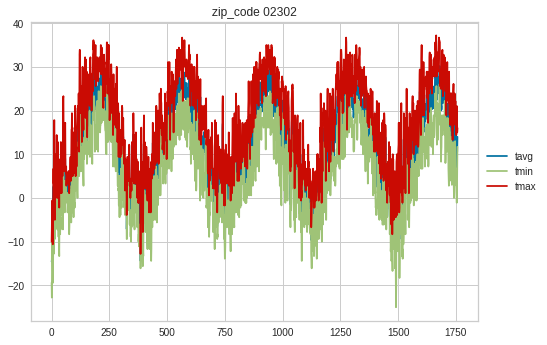

02904


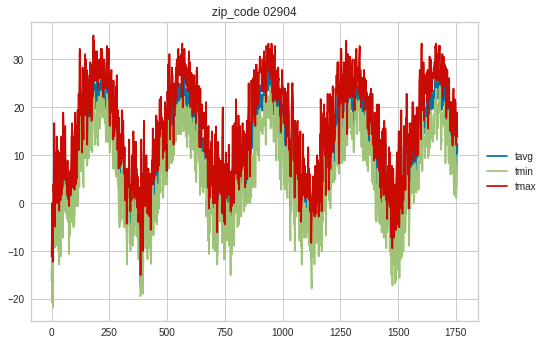

01501


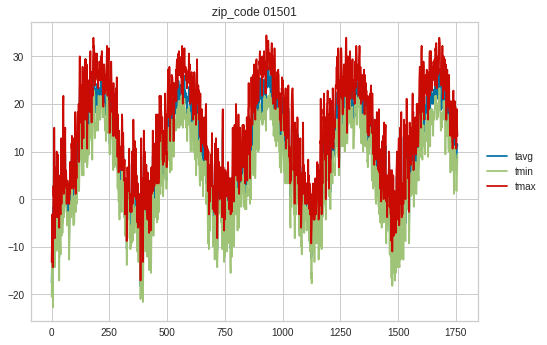

03106


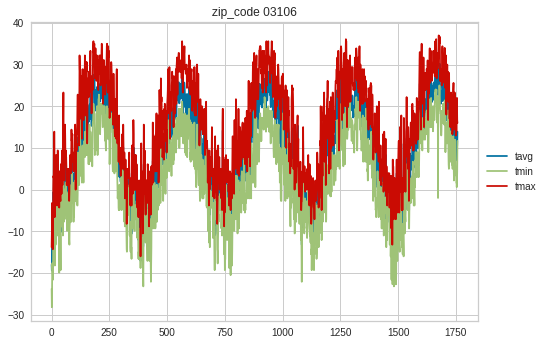

03862


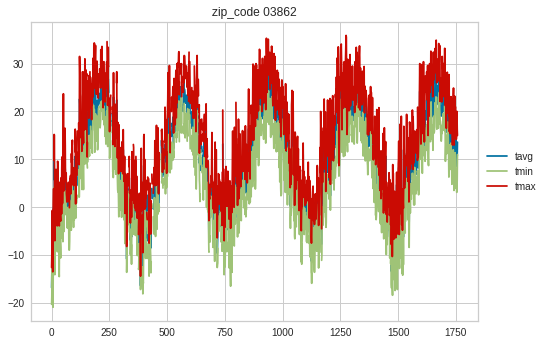

03244


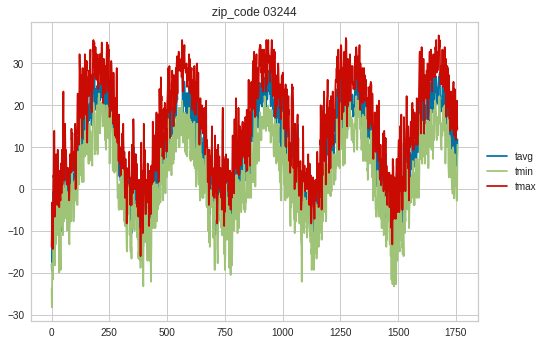

03773


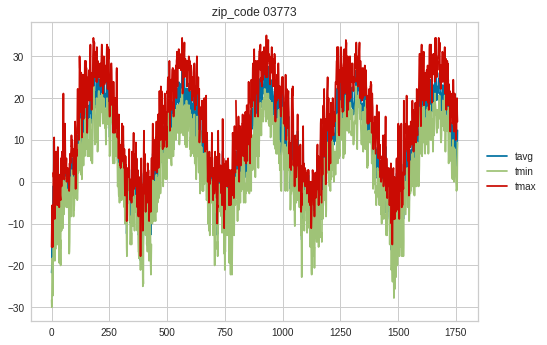

04102


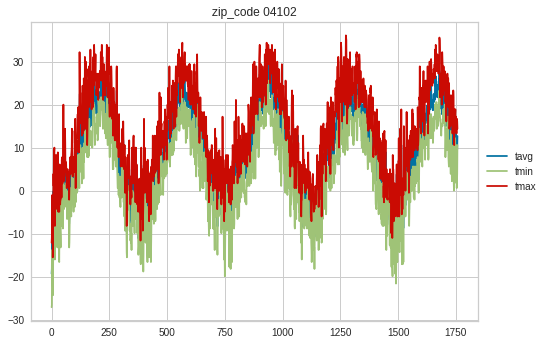

03784


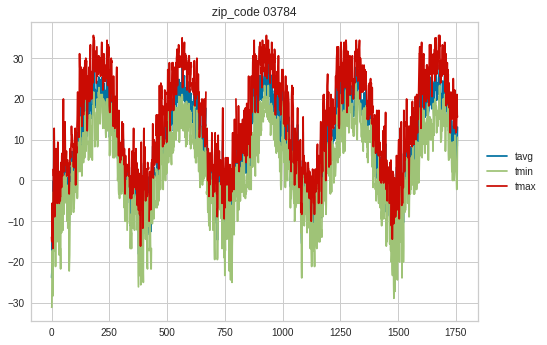

04401


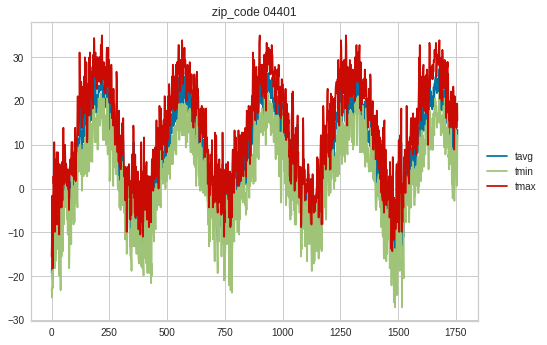

04240


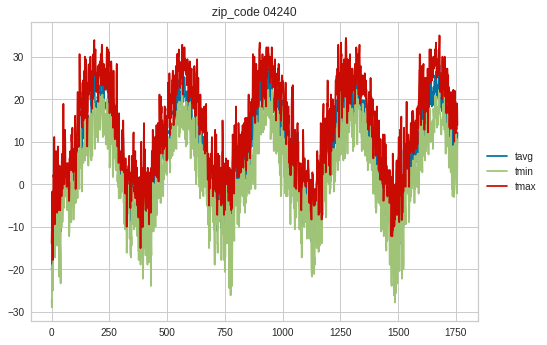

04073


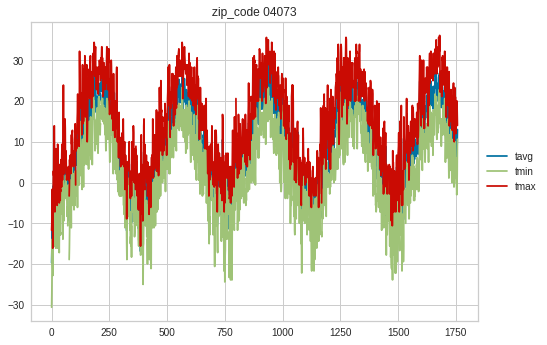

02466


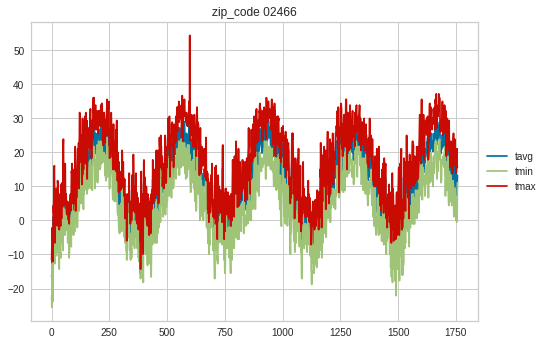

02135


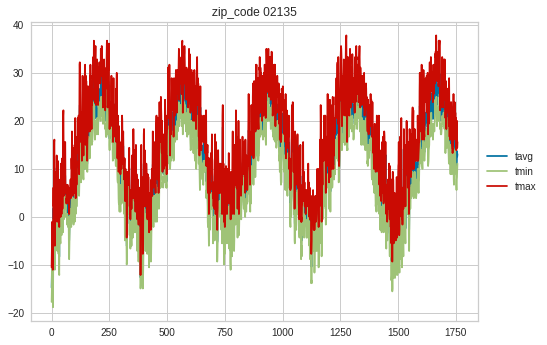

02125


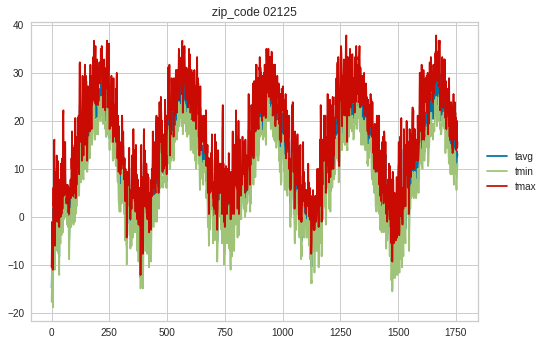

01938


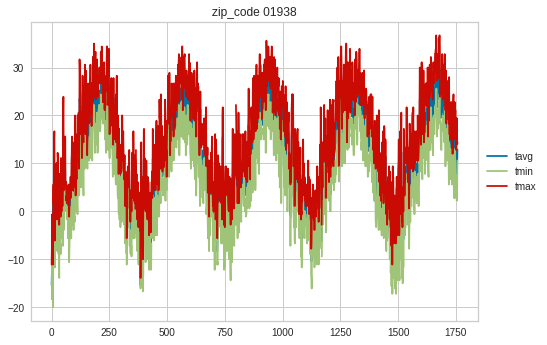

02646


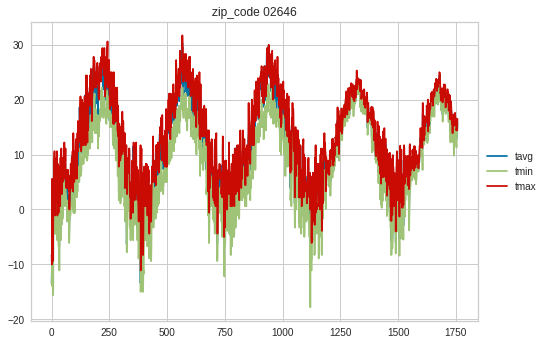

03458


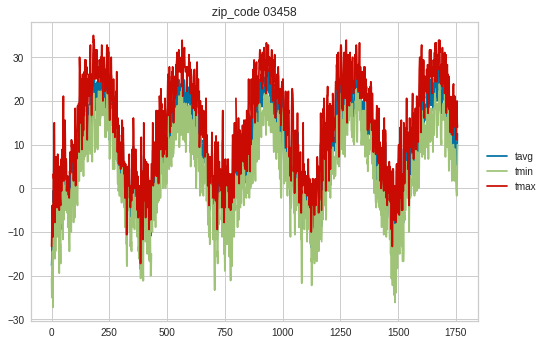

,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
0,2018-01-01,-22.7,-26.7,-18.3,NaN,NaN,NaN,10.3,NaN,1026.9,NaN,44.2641,-72.577,05602
1,2018-01-02,-20.6,-30.0,-8.9,NaN,NaN,NaN,6.4,NaN,NaN,NaN,44.2641,-72.577,05602
2,2018-01-03,-10.5,-13.9,-7.2,NaN,NaN,NaN,10.2,NaN,1022.1,NaN,44.2641,-72.577,05602
3,2018-01-04,-11.9,-15.0,-8.9,NaN,NaN,NaN,12.8,NaN,NaN,NaN,44.2641,-72.577,05602
4,2018-01-05,-18.9,-21.7,-11.1,NaN,NaN,315.0,21.6,NaN,NaN,NaN,44.2641,-72.577,05602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753,2022-10-20,5.9,-1.0,12.2,0.0,NaN,209.0,12.8,NaN,1012.7,NaN,42.8856,-71.947,03458
1754,2022-10-21,5.6,-1.7,15.0,0.0,NaN,225.0,6.6,NaN,1019.8,NaN,42.8856,-71.947,03458
1755,2022-10-22,8.2,0.0,20.0,0.0,NaN,208.0,7.3,NaN,1024.8,NaN,42.8856,-71.947,03458
1756,2022-10-23,9.0,3.3,15.0,1.8,NaN,16.0,3.4,NaN,1027.8,NaN,42.8856,-71.947,03458


In [16]:
us_zip = pgeocode.Nominatim('us')
temp_df = pd.DataFrame()
addr_weather_df = pd.DataFrame()
lat_long_list = []
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 24)
err_list = []
for zip in df_zip['zipcode'].values.tolist():
    print(zip)
    lat, long = us_zip.query_postal_code(zip)[9:11][0], us_zip.query_postal_code(zip)[9:11][1]
    lat_long_list.append((lat, long))
    location = Point(lat, long)
    data = Daily(location, start, end)
    data = data.fetch()
    if len(data) == 0:
        err_list.append(zip)
        continue
    data.reset_index(inplace = True)
    data['lat'] = lat
    data['long'] = long
    data['zip'] = zip
    addr_weather_df = addr_weather_df.append(data)
    data.plot(y=['tavg', 'tmin', 'tmax'])
    plt.title('zip_code ' + zip)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    
addr_weather_df['time'] = addr_weather_df['time'].apply(lambda x : x.strftime("%Y-%m-%d"))
addr_weather_df

# **Error List**

In [17]:
err_list

['04426', '03818', '03584']

Combining weather with weather at a zipcode.

# **Combining Weather Data along with Historical Weather Details**

In [18]:
df_weather_consolidated = pd.merge(df_weather, addr_weather_df, how = 'inner', left_on = ['zip5', 'day_dt'], right_on = ['zip', 'time'])
df_weather_consolidated

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,store_id,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
0,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,619,2019-03-20,1.9,-6.1,8.9,0.0,NaN,NaN,9.9,NaN,1028.8,NaN,41.6338,-70.9958,02747
1,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,619,2019-03-21,4.9,-2.8,8.9,0.0,NaN,123.0,13.2,NaN,1020.7,NaN,41.6338,-70.9958,02747
2,02747,2019-03-22,45.1,38.6,18,7,6,32,MINIMAL,29.8,83,37.1,0.2,0.0,36.1,75,OTH,619,2019-03-22,5.1,3.3,6.7,NaN,NaN,333.0,23.2,NaN,992.2,NaN,41.6338,-70.9958,02747
3,02747,2019-03-23,52.2,32.7,32,0,6,30,LOW,35.8,36,23.2,0.0,0.0,43.1,3,OTH,619,2019-03-23,3.4,-0.6,8.3,NaN,NaN,283.0,31.6,NaN,1001.4,NaN,41.6338,-70.9958,02747
4,02747,2019-03-24,59.1,25.7,3,0,7,30,LOW,32.8,23,19.2,0.0,0.0,53.7,19,OTH,619,2019-03-24,4.9,-3.3,11.7,0.0,NaN,NaN,16.6,NaN,1016.7,NaN,41.6338,-70.9958,02747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,17,0,6,0,MINIMAL,29.8,50,32.7,0.0,0.0,45.2,12,OTH,326,2022-10-20,6.5,3.0,10.0,0.0,NaN,197.0,11.8,NaN,1011.7,NaN,44.1889,-72.8283,05673
2626,05673,2022-10-21,55.3,29.9,3,0,6,0,MINIMAL,17.9,43,31.4,0.0,0.0,50.1,1,OTH,326,2022-10-21,7.9,2.0,14.4,0.0,NaN,178.0,10.2,NaN,1019.2,NaN,44.1889,-72.8283,05673
2627,05673,2022-10-22,62.3,35.9,1,0,8,20,MINIMAL,14.9,46,39.4,0.0,0.0,60.4,2,OTH,326,2022-10-22,10.8,1.1,21.0,0.0,NaN,158.0,9.5,NaN,1023.8,NaN,44.1889,-72.8283,05673
2628,05673,2022-10-23,62.1,35.9,3,65,6,20,MINIMAL,3.0,45,40.4,0.1,0.0,62.3,69,OTH,326,2022-10-23,10.7,2.8,20.0,0.0,NaN,30.0,3.0,NaN,1028.7,NaN,44.1889,-72.8283,05673


In [19]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

In [20]:
df_weather_consolidated['avg_temperature_amt'] = (df_weather_consolidated['high_temperature_amt'] + df_weather_consolidated['low_temperature_amt'] )/ 2
df_weather_consolidated['historic_tmin'] = df_weather_consolidated['tmin'].apply(lambda x : ((9 * x) / 5) + 32)
df_weather_consolidated['historic_tmax'] = df_weather_consolidated['tmax'].apply(lambda x : ((9 * x) / 5) + 32)
df_weather_consolidated['historic_tavg'] = df_weather_consolidated['tavg'].apply(lambda x : ((9 * x) / 5) + 32)

In [21]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

# **Combining Weather and Holiday Data Together**

In [22]:
df_weather_consolidated = pd.merge(df_weather_consolidated, df_holiday_combined[df_holiday_combined.level == 'FE'], how = 'left', left_on = 'day_dt', right_on = 'date')
df_weather_consolidated.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'store_id', 'time', 'tavg',
       'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt', 'pres', 'tsun',
       'lat', 'long', 'zip', 'avg_temperature_amt', 'historic_tmin',
       'historic_tmax', 'historic_tavg', 'level', 'year', 'date',
       'holiday_name'],
      dtype='object')

In [23]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

In [24]:
'''
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'date', 'store_id']]
'''
df_weather_consolidated['holiday_ind'] = np.where(df_weather_consolidated['date'].isna(),0,1)
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'holiday_ind', 'store_id']]

In [25]:
df_weather_refined.iloc[0]

zip5                         02747
day_dt                  2019-03-20
high_temperature_amt          52.2
low_temperature_amt           21.7
avg_temperature_amt          36.95
historic_tmin                21.02
historic_tmax                48.02
historic_tavg                35.42
holiday_ind                      0
store_id                       619
Name: 0, dtype: object

In [26]:
df_weather_refined[df_weather_refined.zip5.isin(['02747','05673','05764'])]

,zip5,day_dt,high_temperature_amt,low_temperature_amt,avg_temperature_amt,historic_tmin,historic_tmax,historic_tavg,holiday_ind,store_id
0,02747,2019-03-20,52.2,21.7,36.95,21.02,48.02,35.42,0,619
1,02747,2019-03-21,53.1,31.7,42.40,26.96,48.02,40.82,0,619
2,02747,2019-03-22,45.1,38.6,41.85,37.94,44.06,41.18,0,619
3,02747,2019-03-23,52.2,32.7,42.45,30.92,46.94,38.12,0,619
4,02747,2019-03-24,59.1,25.7,42.40,26.06,53.06,40.82,0,619
...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,43.95,37.40,50.00,43.70,0,326
2626,05673,2022-10-21,55.3,29.9,42.60,35.60,57.92,46.22,0,326
2627,05673,2022-10-22,62.3,35.9,49.10,33.98,69.80,51.44,0,326
2628,05673,2022-10-23,62.1,35.9,49.00,37.04,68.00,51.26,0,326


In [27]:
df_weather_refined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id'],
      dtype='object')

# **Get Transaction Data at Store-CSC-Day Level**

In [28]:
#df_txn_1 = pd.read_csv('result_txn_1.csv')
#df_txn_2 = pd.read_csv('result_txn_2.csv')
#df_txn_1.columns = [col.lower() for col in df_txn_1.columns]
#df_txn_2.columns = [col.lower() for col in df_txn_2.columns]
df_txn = pd.read_csv('result_txn_619_326_3087.csv')
df_txn.columns = [col.lower() for col in df_txn.columns]
df_txn['eff_price'] = np.where((df_txn['promo_unit_prc'] == 0) | (df_txn['promo_unit_prc'].isna()), df_txn['reg_unit_prc'], df_txn['promo_unit_prc'])
df_txn['promo_depth'] = df_txn['eff_price'] / df_txn['reg_unit_prc']
df_txn.head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.00,8.95,0.0,0.0,1.79,0.89949749
1,2020-01-01,146393,25,619,1.99,NaN,15.92,8,8,-2.58,13.34,0.0,0.0,1.99,1.00000000
2,2020-01-01,146399,25,619,1.99,NaN,37.81,19,21,-6.45,31.36,0.0,0.0,1.99,1.00000000
3,2020-01-01,146408,25,619,2.69,NaN,5.38,2,0,0.00,5.38,0.0,0.0,2.69,1.00000000
4,2020-01-01,146408,25,3087,2.69,NaN,13.45,5,0,0.00,13.45,0.0,0.0,2.69,1.00000000


In [29]:
df_txn[df_txn['promo_depth'] < 1].head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.0,8.95,0.0,0.0,1.79,0.89949749
15,2020-01-01,322058,11,619,3.99,2.99,10.47,3,3,-1.5,8.97,0.0,0.0,2.99,0.74937343
17,2020-01-01,322058,11,3087,3.99,2.99,6.98,2,2,-1.0,5.98,0.0,0.0,2.99,0.74937343
18,2020-01-01,322060,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.93987976
29,2020-01-01,460913,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.93987976


In [30]:
len(df_txn[['consumer_selling_cd']].drop_duplicates())

33

In [31]:
df_weather_refined['day_dt'].min(), df_txn['txn_dte'].min()

('2019-03-20', '2020-01-01')

In [32]:
df_txn.groupby(['store_id','consumer_selling_cd']).agg({'txn_dte': np.min})

txn_dte
store_id consumer_selling_cd            
326      146399               2020-01-03
         146408               2020-01-03
         146629               2020-01-02
         146761               2020-01-03
         146835               2020-01-03
         147065               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-01
         322087               2020-01-02
         322325               2020-01-03
         322389               2020-01-02
         322390               2020-01-01
         322455               2020-01-02
         410691               2020-01-01
         460651               2020-01-01
         460913               2020-01-01
         461103               2020-12-18
         466564               2020-01-01
         778229               2020-01-01
619      146385               2020-01-01
         146393               2020-01-01
         146399               2020-01-01
         146408               2020-01-01
         146453               2020-01-01
         146629               2020-01-01
         146675               2020-01-01
         146761               2020-01-02
         146835               2020-01-01
         322045               2020-01-01
         322058               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-02
         322087               2020-01-01
         322554               2020-01-01
         322557               2020-01-03
         322625               2020-01-02
         413364               2020-07-12
         460913               2020-01-02
3087     146404               2020-01-01
         146408               2020-01-01
         146453               2020-01-02
         146629               2020-01-01
         146675               2020-01-04
         146761               2020-01-03
         146835               2020-01-01
         322045               2020-01-02
         322058               2020-01-01
         322059               2020-01-02
         322060               2020-01-04
         322082               2020-01-01
         322087               2020-01-04
         322325               2020-01-02
         322554               2020-01-01
         322557               2020-01-01
         437609               2020-01-02
         460913               2020-01-01
         464561               2020-01-02
         778229               2020-01-01

In [33]:
top_csc_list = df_txn['consumer_selling_cd'].drop_duplicates().tolist()
top_csc_list

[146385,
 146393,
 146399,
 146408,
 146404,
 146453,
 146629,
 146675,
 146835,
 147065,
 322045,
 322059,
 322058,
 322060,
 322082,
 322087,
 322390,
 322554,
 322557,
 410691,
 460651,
 460913,
 466564,
 778229,
 146761,
 322325,
 322389,
 322455,
 322625,
 437609,
 464561,
 413364,
 461103]

In [34]:
df_weather_txn_combined = pd.merge(df_weather_refined[df_weather_refined.day_dt >= '2020-01-01'], df_txn, how='inner', left_on=['day_dt', 'store_id'], right_on=['txn_dte', 'store_id'])
df_weather_txn_combined.drop(columns = ['txn_dte'], axis = 1, inplace = True)
df_weather_txn_combined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth'],
      dtype='object')

In [35]:
df_weather_txn_combined.iloc[0]

zip5                             02747
day_dt                      2020-01-01
high_temperature_amt              41.2
low_temperature_amt               29.7
avg_temperature_amt              35.45
historic_tmin                    33.08
historic_tmax                    42.08
historic_tavg                    37.76
holiday_ind                          1
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      1.99
promo_unit_prc                    1.79
total_gross_amt                   9.95
total_item_qty                       5
total_mkdn_qty                       5
total_mkdn_amt                    -1.0
total_net_amt                     8.95
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         1.79
promo_depth                 0.89949749
Name: 0, dtype: object

In [36]:
#try with z transformation as well and add info on the dataset
df_weather_txn_combined['log_total_item_qty'] = np.log(df_weather_txn_combined['total_item_qty'] + 1)
df_weather_txn_combined['log_avg_temperature_amt'] = np.log(df_weather_txn_combined['avg_temperature_amt'] + 1)
df_weather_txn_combined['log_historic_tavg'] = np.log(df_weather_txn_combined['historic_tavg'] + 1)
df_weather_txn_combined['log_historic_tmin'] = np.log(df_weather_txn_combined['historic_tmin'] + 1)
df_weather_txn_combined['log_historic_tmax'] = np.log(df_weather_txn_combined['historic_tmax'] + 1)
df_weather_txn_combined['log_eff_price'] = np.log(df_weather_txn_combined['eff_price'] + 1)
df_weather_txn_combined.set_index('day_dt', inplace = True)


invalid value encountered in log


In [37]:
df_weather_txn_combined.columns

Index(['zip5', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth', 'log_total_item_qty', 'log_avg_temperature_amt',
       'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax',
       'log_eff_price'],
      dtype='object')

In [38]:
df_weather_txn_combined.iloc[0]

zip5                             02747
high_temperature_amt              41.2
low_temperature_amt               29.7
avg_temperature_amt              35.45
historic_tmin                    33.08
historic_tmax                    42.08
historic_tavg                    37.76
holiday_ind                          1
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      1.99
promo_unit_prc                    1.79
total_gross_amt                   9.95
total_item_qty                       5
total_mkdn_qty                       5
total_mkdn_amt                    -1.0
total_net_amt                     8.95
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         1.79
promo_depth                 0.89949749
log_total_item_qty          1.79175947
log_avg_temperature_amt     3.59594146
log_historic_tavg           3.65738879
log_historic_tmin        

In [39]:
orig_df_weather_txn_combined = df_weather_txn_combined.copy()
df_weather_txn_combined = df_weather_txn_combined[['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth', 'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax','log_eff_price', 'log_total_item_qty']]

In [40]:
df_weather_txn_combined.iloc[0]

zip5                            02747
store_id                          619
consumer_selling_cd            146385
promo_depth                0.89949749
log_avg_temperature_amt    3.59594146
log_historic_tavg          3.65738879
log_historic_tmin           3.5287107
log_historic_tmax          3.76305885
log_eff_price               1.0260416
log_total_item_qty         1.79175947
Name: 2020-01-01, dtype: object

In [41]:
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined.index
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'])
df_weather_txn_combined['dayofweek'] = df_weather_txn_combined['transaction_date'].dt.dayofweek
df_weather_txn_combined['quarter'] = df_weather_txn_combined['transaction_date'].dt.quarter
df_weather_txn_combined['month'] = df_weather_txn_combined['transaction_date'].dt.month
df_weather_txn_combined['year'] = df_weather_txn_combined['transaction_date'].dt.year
df_weather_txn_combined['dayofyear'] = df_weather_txn_combined['transaction_date'].dt.dayofyear
df_weather_txn_combined['dayofmonth'] = df_weather_txn_combined['transaction_date'].dt.day
df_weather_txn_combined['weekofyear'] = df_weather_txn_combined['transaction_date'].dt.isocalendar().week


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [42]:
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'].astype(str), format='%Y-%m-%d')
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined['transaction_date'].astype(int)

casting datetime64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.


In [43]:
df_weather_txn_combined.drop(columns = ['transaction_date'], axis = 1, inplace=True)

In [44]:
df_weather_txn_combined.iloc[0]

zip5                            02747
store_id                          619
consumer_selling_cd            146385
promo_depth                0.89949749
log_avg_temperature_amt    3.59594146
log_historic_tavg          3.65738879
log_historic_tmin           3.5287107
log_historic_tmax          3.76305885
log_eff_price               1.0260416
log_total_item_qty         1.79175947
dayofweek                           2
quarter                             1
month                               1
year                             2020
dayofyear                           1
dayofmonth                          1
weekofyear                          1
Name: 2020-01-01, dtype: object

In [45]:
df_weather_txn_combined.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [46]:
unique_str_csc_list = df_weather_txn_combined[['store_id', 'consumer_selling_cd']].drop_duplicates().values.tolist()
unique_str_csc_list

[[619, 146385],
 [619, 146393],
 [619, 146399],
 [619, 146408],
 [619, 146453],
 [619, 146629],
 [619, 146675],
 [619, 146835],
 [619, 322045],
 [619, 322058],
 [619, 322059],
 [619, 322060],
 [619, 322087],
 [619, 322554],
 [619, 146761],
 [619, 322082],
 [619, 322625],
 [619, 460913],
 [619, 322557],
 [619, 413364],
 [326, 147065],
 [326, 322059],
 [326, 322060],
 [326, 322082],
 [326, 322390],
 [326, 410691],
 [326, 460651],
 [326, 460913],
 [326, 466564],
 [326, 778229],
 [326, 146629],
 [326, 322087],
 [326, 322389],
 [326, 322455],
 [326, 146399],
 [326, 146408],
 [326, 146761],
 [326, 146835],
 [326, 322325],
 [326, 461103]]

# **Obtaining Train, Validation and Test Dates**

In [47]:
unique_date_list = sorted(list(set(list(df_weather_txn_combined.index))))
#test_dates = [dt for dt in unique_date_list if dt >= '2022-07-24' and dt <= '2022-10-22']
#val_dates =  [dt for dt in unique_date_list if dt >= '2022-05-01' and dt <= '2022-07-23']
test_dates = [dt for dt in unique_date_list if dt >= '2022-05-01']
train_dates = [dt for dt in unique_date_list if dt < '2022-05-01']

In [48]:
print(min(train_dates), max(train_dates))
#print(min(val_dates), max(val_dates))
print(min(test_dates), max(test_dates))

2020-01-01 2022-04-30
2022-05-01 2022-10-24


In [49]:
train_indices = df_weather_txn_combined.index.isin(train_dates)
#val_indices = df_weather_txn_combined.index.isin(val_dates)
test_indices = df_weather_txn_combined.index.isin(test_dates)

In [50]:
df_train = df_weather_txn_combined.iloc[train_indices]
#df_val = df_weather_txn_combined.iloc[val_indices]
df_test = df_weather_txn_combined.iloc[test_indices]

In [51]:
print(len(df_train))
#print(len(df_val)) 
print(len(df_test))

24714
4858


In [52]:
df_train.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [53]:
#df_val.columns

In [54]:
df_test.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [55]:
df_train.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2020-01-01,02747,619,146385,0.89949749,3.59594146,3.65738879,3.5287107,3.76305885,1.02604160,1.79175947,2,1,1,2020,1,1,1
2020-01-01,02747,619,146393,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.09527339,2.19722458,2,1,1,2020,1,1,1
2020-01-01,02747,619,146399,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.09527339,2.99573227,2,1,1,2020,1,1,1
2020-01-01,02747,619,146408,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.30562646,1.09861229,2,1,1,2020,1,1,1
2020-01-01,02747,619,146453,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.30562646,0.69314718,2,1,1,2020,1,1,1


In [56]:
df_test.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2022-05-01,02747,619,146385,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.19088756,2.63905733,6,2,5,2022,121,1,17
2022-05-01,02747,619,146393,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.09527339,1.94591015,6,2,5,2022,121,1,17
2022-05-01,02747,619,146399,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.09527339,2.07944154,6,2,5,2022,121,1,17
2022-05-01,02747,619,146408,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.56653041,1.94591015,6,2,5,2022,121,1,17
2022-05-01,02747,619,146453,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.56653041,1.60943791,6,2,5,2022,121,1,17


In [57]:
#df_val.head()

In [58]:
df_train['store_id'].drop_duplicates()

day_dt
2020-01-01    619
2020-01-01    326
Name: store_id, dtype: int64

In [59]:
df_test['store_id'].drop_duplicates()

day_dt
2022-05-01    619
2022-05-01    326
Name: store_id, dtype: int64

In [60]:
#df_val['store_id'].drop_duplicates()

# **WMAPE**

In [61]:
import tensorflow as tf

def weighted_mape(y_true,y_pred):
    tot = tf.reduce_sum(y_true)
    tot = tf.clip_by_value(tot, clip_value_min=1,clip_value_max=100000)
    wmape = tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot)*100#/tot
    #print("a")
    #print(tf.reduce_sum(y_true))
    #print("b")
    #print(tf.subtract(y_true,y_pred))
    #print("c")
    #print(tf.abs(tf.subtract(y_true,y_pred)))
    #print("d")
    #print(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))))
    #print("e")
    #print(tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot))

    return(wmape)

In [62]:
def wmape_test(actual, forecast):
    # we take two series and calculate an output a wmape from it

    # make a series called mape
    se_mape = abs(actual-forecast)/actual

    # get a float of the sum of the actual
    ft_actual_sum = actual.sum()

    # get a series of the multiple of the actual & the mape
    se_actual_prod_mape = actual * se_mape

    # summate the prod of the actual and the mape
    ft_actual_prod_mape_sum = se_actual_prod_mape.sum()

    # float: wmape of forecast
    ft_wmape_forecast = ft_actual_prod_mape_sum / ft_actual_sum

    # return a float
    return ft_wmape_forecast

# ***Get UPC Information***

In [63]:
df_upc = pd.read_csv("result_upc.csv")
df_upc.columns = [col.lower() for col in df_upc.columns]
df_upc.head()

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
0,74153190,3800019975,1,KLLGGS RAISIN BRAN CEREAL CRUNCH,KELLOGGS RAISIN BRAN CEREAL CRUNCH,1101020302,2,RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ,11010203,3,RTE CEREAL MAINSTREAM BOX ADULT -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11014346,7699,605137,True,False,2019-03-02,A,V,2019-01-11,True,84696,1232,N,1.4063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
1,62015452,3800024741,1,KLLGG CINNAMON SNACKING CEREAL,KELLOGGS CINNAMON SNACKING CEREAL,1101040201,1,RTE CEREAL OTG MULTI SERVE CADDIES,11010402,2,RTE CEREAL OTG MULTI SERVE -NS,110104,4,RTE CEREAL ON THE GO,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010140,3566968,1215895,True,False,2021-07-08,NaN,V,2021-07-08,True,50529,1232,N,0.3150,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
2,64208231,2113015286,1,S SEL CEREAL MUESLI,SIGNATURE SELECT CEREAL MUESLI 15.3 OUNCE,1101030203,3,RTE CEREAL NATURAL/ORGANIC GRANOLA MUESLI,11010302,2,RTE CEREAL NATURAL/ORGANIC GRANOLA -NS,110103,3,RTE CEREAL NATURAL/ORGANIC,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11012908,7186,322244,True,False,2018-02-10,A,V,2016-10-21,True,17492,305,H,0.9563,True,True,305,True,2022-08-10 06:48:17.000 -0600,2022-10-21 05:04:41.794 -0600,False
3,73352816,88397814726,1,MOMS BEST CEREAL COCOA RICE CRISPY,MOMS BEST CRISPY COCOA RICE CEREAL,1101030101,1,RTE CEREAL NATURAL/ORGANIC COLD SWEET,11010301,1,RTE CEREAL NATURAL/ORGANIC COLD -NS,110103,3,RTE CEREAL NATURAL/ORGANIC,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010630,436485,525025,True,False,2022-02-19,A,V,2013-09-10,True,95321,0,N,0.8125,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
4,64794413,1600016349,1,GM CHEERIOS VERY BERRY,GENERAL MILLS VERY BERRY CHEERIOS,1101020202,2,RTE CEREAL MAINSTREAM BOX FAM LARGE SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010513,6369,792850,True,False,2020-02-25,NaN,V,2020-02-25,True,66653,1416,N,0.9063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


In [64]:
df_upc.iloc[0]

upc_d1_sk                                                               74153190
upc_nbr                                                               3800019975
corporation_id                                                                 1
item_dsc                                        KLLGGS RAISIN BRAN CEREAL CRUNCH
internet_item_dsc                             KELLOGGS RAISIN BRAN CEREAL CRUNCH
smic_sub_sub_class_id                                                 1101020302
smic_sub_sub_class_cd                                                          2
smic_sub_sub_class_dsc                  RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ
smic_sub_class_id                                                       11010203
smic_sub_class_cd                                                              3
smic_sub_class_dsc                           RTE CEREAL MAINSTREAM BOX ADULT -NS
smic_class_id                                                             110102
smic_class_cd               

In [65]:
df_upc.columns

Index(['upc_d1_sk', 'upc_nbr', 'corporation_id', 'item_dsc',
       'internet_item_dsc', 'smic_sub_sub_class_id', 'smic_sub_sub_class_cd',
       'smic_sub_sub_class_dsc', 'smic_sub_class_id', 'smic_sub_class_cd',
       'smic_sub_class_dsc', 'smic_class_id', 'smic_class_cd',
       'smic_class_dsc', 'smic_category_id', 'smic_category_cd',
       'smic_category_dsc', 'smic_group_id', 'smic_group_cd', 'smic_group_dsc',
       'section_cd', 'section_nm', 'retail_department_id', 'department_nm',
       'corporate_item_cd', 'corporate_item_integration_id',
       'consumer_selling_cd', 'primary_consumer_selling_code_ind',
       'prefered_corporate_item_lock_ind', 'preferred_cic_update_dt',
       'preferred_cic_update_cd', 'retail_status_ind', 'create_dt',
       'scan_unit_ind', 'common_retail_cd', 'brand_cd',
       'manufacturer_type_ind', 'equivalized_unit_fctr', 'safeway_upc_ind',
       'equivalized_factor_source_update_ind', 'own_brands_brand_cd',
       'own_brands_ind', 'dw_creat

In [66]:
df_upc.groupby(['consumer_selling_cd'])['retail_status_ind'].count()

consumer_selling_cd
103589     1
146273     2
146275     2
146276     2
146279     2
          ..
1274442    1
1274454    1
1274455    1
1274456    1
1274457    1
Name: retail_status_ind, Length: 1177, dtype: int64

In [67]:
df_upc[(df_upc.consumer_selling_cd == 460913) & (df_upc.retail_status_ind == 'V')]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
114,64860460,1600016968,1,GM CHEERIOS HONEY NUT,GENERAL MILLS HONEY NUT CHEERIOS,1101020203,3,RTE CEREAL MAINSTREAM BOX FAM FAMILY SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11011576,959633,460913,True,False,2021-02-27,A,V,2021-02-10,True,40884,1416,N,1.175,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


In [68]:
df_upc[(df_upc.consumer_selling_cd == 146276) & (df_upc.retail_status_ind == 'V')].groupby(['consumer_selling_cd', 'retail_status_ind']).agg({'dw_last_update_ts': np.max})

,,dw_last_update_ts
consumer_selling_cd,retail_status_ind,
146276,V,2022-10-15 05:03:22.579 -0600


In [69]:
df_upc_1 = df_upc[df_upc.retail_status_ind == 'V'].groupby(['consumer_selling_cd', 'retail_status_ind']).agg({'dw_last_update_ts': np.max}).reset_index()
df_upc_2 = pd.merge(df_upc, df_upc_1, how = 'inner', on = ['consumer_selling_cd', 'retail_status_ind', 'dw_last_update_ts'])

In [70]:
df_upc[(df_upc.consumer_selling_cd == 146276)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
922,65728259,76026300026,1,BEAR CREEK SOUP MIX CHEDDAR BROCCOLI,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX,2510020205,5,DRY SOUP REG PREP DIP/SOUP CHICKEN MIX -NS,25100202,2,DRY SOUP REG PREP DRY DIP/SOUP,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25050036,32076,146276,True,False,2007-03-25,A,V,2004-02-03,True,27129,0,N,0.7000,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
929,64540151,76026352934,1,BEAR CREEK CHDR BROC SOUP MIX - EACH,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX - EACH,2510020103,3,DRY SOUP REG PREP PILLOW PACK -NS,25100201,1,DRY SOUP REG PREP PACKS,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25100022,3061504,146276,True,False,2022-04-23,A,V,2022-04-07,True,79657,0,N,0.6625,True,True,0,False,2022-05-05 00:30:18.000 -0600,2022-10-15 05:03:22.579 -0600,False


In [71]:
df_upc_2[(df_upc_2.consumer_selling_cd == 146276)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
773,64540151,76026352934,1,BEAR CREEK CHDR BROC SOUP MIX - EACH,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX - EACH,2510020103,3,DRY SOUP REG PREP PILLOW PACK -NS,25100201,1,DRY SOUP REG PREP PACKS,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25100022,3061504,146276,True,False,2022-04-23,A,V,2022-04-07,True,79657,0,N,0.6625,True,True,0,False,2022-05-05 00:30:18.000 -0600,2022-10-15 05:03:22.579 -0600,False


In [72]:
df_upc_2[(df_upc_2.consumer_selling_cd == 460913)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
92,64860460,1600016968,1,GM CHEERIOS HONEY NUT,GENERAL MILLS HONEY NUT CHEERIOS,1101020203,3,RTE CEREAL MAINSTREAM BOX FAM FAMILY SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11011576,959633,460913,True,False,2021-02-27,A,V,2021-02-10,True,40884,1416,N,1.175,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


# ***Get Day Week Information***

In [73]:
df_day_week = pd.read_csv('result_day_week.csv')
df_day_week.columns = [col.lower() for col in df_day_week.columns]
df_day_week.head()

,date_val,year,week_start_date,week_end_date,week_nbr
0,2019-12-29,2020,2019-12-29,2020-01-04,1
1,2019-12-30,2020,2019-12-29,2020-01-04,1
2,2019-12-31,2020,2019-12-29,2020-01-04,1
3,2020-01-01,2020,2019-12-29,2020-01-04,1
4,2020-01-02,2020,2019-12-29,2020-01-04,1


# ***Get Weekly Weather Aggregate***

In [74]:
df_weather.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,store_id
1329,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,619
1330,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,619
1331,02747,2019-03-22,45.1,38.6,18,7,6,32,MINIMAL,29.8,83,37.1,0.2,0.0,36.1,75,OTH,619
1332,02747,2019-03-23,52.2,32.7,32,0,6,30,LOW,35.8,36,23.2,0.0,0.0,43.1,3,OTH,619
1333,02747,2019-03-24,59.1,25.7,3,0,7,30,LOW,32.8,23,19.2,0.0,0.0,53.7,19,OTH,619


In [75]:
df_weather_refined.iloc[0]

zip5                         02747
day_dt                  2019-03-20
high_temperature_amt          52.2
low_temperature_amt           21.7
avg_temperature_amt          36.95
historic_tmin                21.02
historic_tmax                48.02
historic_tavg                35.42
holiday_ind                      0
store_id                       619
Name: 0, dtype: object

In [76]:
df_weather_refined_extended = pd.merge(df_weather_refined, df_day_week, how = 'inner', left_on='day_dt', right_on='date_val' )
df_weather_refined_extended.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,avg_temperature_amt,historic_tmin,historic_tmax,historic_tavg,holiday_ind,store_id,date_val,year,week_start_date,week_end_date,week_nbr
0,02747,2019-12-29,46.1,21.7,33.90,28.04,44.06,36.50,0,619,2019-12-29,2020,2019-12-29,2020-01-04,1
1,05673,2019-12-29,35.1,21.2,28.15,21.92,33.08,29.30,0,326,2019-12-29,2020,2019-12-29,2020-01-04,1
2,02747,2019-12-30,39.1,34.6,36.85,35.96,37.94,37.40,0,619,2019-12-30,2020,2019-12-29,2020-01-04,1
3,05673,2019-12-30,29.4,22.9,26.15,24.98,30.02,27.32,0,326,2019-12-30,2020,2019-12-29,2020-01-04,1
4,02747,2019-12-31,52.2,37.6,44.90,NaN,NaN,NaN,0,619,2019-12-31,2020,2019-12-29,2020-01-04,1


In [77]:
df_weather_refined_extended.iloc[0]

zip5                         02747
day_dt                  2019-12-29
high_temperature_amt          46.1
low_temperature_amt           21.7
avg_temperature_amt           33.9
historic_tmin                28.04
historic_tmax                44.06
historic_tavg                 36.5
holiday_ind                      0
store_id                       619
date_val                2019-12-29
year                          2020
week_start_date         2019-12-29
week_end_date           2020-01-04
week_nbr                         1
Name: 0, dtype: object

In [78]:
df_weather_refined_extended.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'date_val', 'year',
       'week_start_date', 'week_end_date', 'week_nbr'],
      dtype='object')

In [79]:
df_weather_refined_extended = df_weather_refined_extended[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 
       'week_start_date', 'week_end_date']]

In [80]:
df_weather_refined_extended.iloc[0]

zip5                         02747
day_dt                  2019-12-29
high_temperature_amt          46.1
low_temperature_amt           21.7
avg_temperature_amt           33.9
historic_tmin                28.04
historic_tmax                44.06
historic_tavg                 36.5
holiday_ind                      0
store_id                       619
week_start_date         2019-12-29
week_end_date           2020-01-04
Name: 0, dtype: object

In [81]:
df_wkly_weather_stats = df_weather_refined_extended.groupby(['zip5', 'week_start_date', 'week_end_date']).agg({'high_temperature_amt' : np.mean, 
                                                                                                       'low_temperature_amt' : np.mean,
                                                                                                       'avg_temperature_amt' : np.mean
                                                                                                      }
                                                                                                     )
df_wkly_weather_stats.columns = ['wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']
df_wkly_weather_stats.reset_index(inplace = True)
df_wkly_weather_stats.sort_values(by=['week_end_date','zip5'])
df_wkly_weather_stats

,zip5,week_start_date,week_end_date,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt
0,02747,2019-12-29,2020-01-04,46.28571429,32.78571429,39.53571429
1,02747,2020-01-05,2020-01-11,45.30000000,27.65714286,36.47857143
2,02747,2020-01-12,2020-01-18,45.87142857,26.38571429,36.12857143
3,02747,2020-01-19,2020-01-25,42.47142857,17.61428571,30.04285714
4,02747,2020-01-26,2020-02-01,43.47142857,26.38571429,34.92857143
...,...,...,...,...,...,...
291,05673,2022-09-25,2022-10-01,62.07142857,42.48571429,52.27857143
292,05673,2022-10-02,2022-10-08,62.64285714,37.35714286,50.00000000
293,05673,2022-10-09,2022-10-15,59.34285714,40.44285714,49.89285714
294,05673,2022-10-16,2022-10-22,56.77142857,35.87142857,46.32142857


In [82]:
df_wkly_weather_stats = pd.merge(df_wkly_weather_stats, df_str_zip, how = 'inner', on = 'zip5')
df_wkly_weather_stats

,zip5,week_start_date,week_end_date,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,store_id
0,02747,2019-12-29,2020-01-04,46.28571429,32.78571429,39.53571429,619
1,02747,2020-01-05,2020-01-11,45.30000000,27.65714286,36.47857143,619
2,02747,2020-01-12,2020-01-18,45.87142857,26.38571429,36.12857143,619
3,02747,2020-01-19,2020-01-25,42.47142857,17.61428571,30.04285714,619
4,02747,2020-01-26,2020-02-01,43.47142857,26.38571429,34.92857143,619
...,...,...,...,...,...,...,...
291,05673,2022-09-25,2022-10-01,62.07142857,42.48571429,52.27857143,326
292,05673,2022-10-02,2022-10-08,62.64285714,37.35714286,50.00000000,326
293,05673,2022-10-09,2022-10-15,59.34285714,40.44285714,49.89285714,326
294,05673,2022-10-16,2022-10-22,56.77142857,35.87142857,46.32142857,326


# **Model**

In [83]:
x_cols = [#'zip5', 'store_id', 'consumer_selling_cd', 
          'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 
       'dayofweek', 'quarter', 'month', #'year',
       'dayofyear', 'dayofmonth', 'weekofyear']
y_col = ['log_total_item_qty']

In [119]:
feature_importance_xgbmr_list = []
feature_importance_lgbmr_list = []

df_test_actual_vs_predicted_xgbmr = pd.DataFrame()
df_test_actual_vs_predicted_lgbmr = pd.DataFrame()


In [109]:
def xgboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs XGBOOST regression.
    """

    xgboost_reg = xgboost.XGBRegressor(objective ='reg:linear', seed=20, verbosity = 0)# for test
    params = { 'max_depth': [3, 5, 6, 10, 15, 20],
               'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
               'subsample': np.arange(0.5, 1.0, 0.1),
               'colsample_bytree': np.arange(0.4, 1.0, 0.1),
               'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
               'n_estimators': [10, 50, 100, 500, 1000]
            }
    clf = RandomizedSearchCV(estimator=xgboost_reg,
                             param_distributions=params,
                             scoring='neg_mean_squared_error',
                             #loss = 'huber',
                             n_iter=25,
                             verbose=0)
    clf.fit(X_train, y_train)
    print("Best parameters:", clf.best_params_)
    print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
    
    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_xgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("XGBBOST : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    #df_test_actual_vs_predicted_xgbmr = df_test_actual_vs_predicted_xgbmr.append(y_test_combined)

    # Shap
    model = clf.best_estimator_
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

In [118]:
def lightgbm_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs Light GBM regression.
    """
    lgbmr = lgb.LGBMRegressor()
    params = {
    'learning_rate': [.1, 0.05],
    'num_leaves': [10,20,30,40,50],
    'boosting_type' : ['gbdt'],
    'objective' : ['regression'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['mse']
    }

    clf = RandomizedSearchCV(lgbmr,params,verbose=1,n_jobs = -1,n_iter=np.random.randint(10, 100))
    clf.fit(X_train,y_train)
    print(clf.best_params_)
    
    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_lgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("XGBBOST : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    
    # Shap
    model = clf.best_estimator_
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

146385-LIPTON SOUP ONION MIX 10-DRY SOUP
Fitting 5 folds for each of 22 candidates, totalling 110 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in double_scalars


{'subsample': 0.5, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 7, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}
Lowest RMSE:  nan


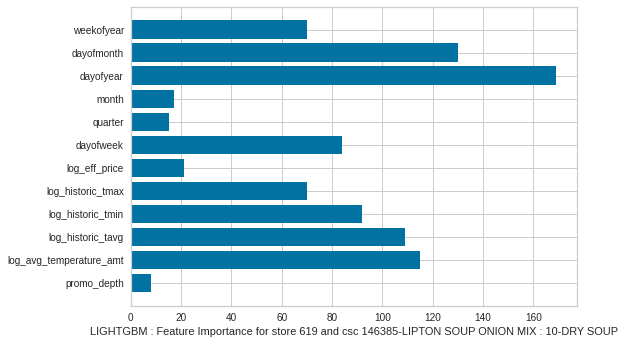

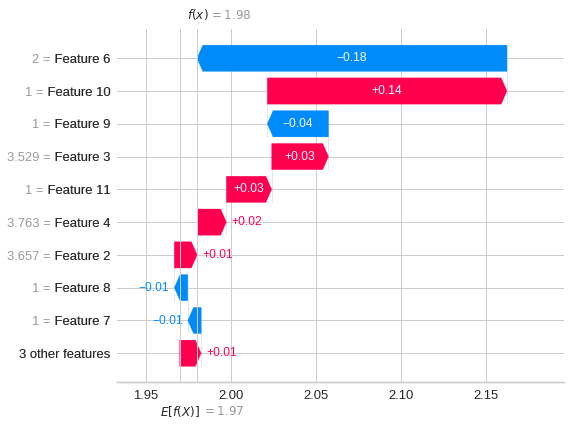

In [113]:
store, csc = unique_str_csc_list[0]
df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]

train_indices = df_train_modified.index
test_indices = df_test_modified.index

X_train = df_train_modified[x_cols].values
y_train = df_train_modified[y_col].values

X_test = df_test_modified[x_cols].values
y_test = df_test_modified[y_col].values

csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
csc_info         = str(csc) + '-' + csc_desc
print(csc_info, smic_ctg_info)

lgbmr = lgb.LGBMRegressor()
params = {
    'learning_rate': [.1, 0.05],
    'num_leaves': [10,20,30,40,50],
    'boosting_type' : ['gbdt'],
    'objective' : ['regression'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['mse']
}

clf = RandomizedSearchCV(lgbmr,params,verbose=1,n_jobs = -1,n_iter=np.random.randint(10, 100))
clf.fit(X_train,y_train)
print(clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
store_csc_list = [store, csc, csc_info, smic_ctg_info]
feature_importance_xgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
plt.barh(x_cols, clf.best_estimator_.feature_importances_)
plt.xlabel("LIGHTGBM : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
plt.show(block = False)

y_test_predicted = clf.predict(X_test)
y_test_combined = pd.DataFrame()
y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
y_test_combined['store_id'] = store
y_test_combined['csc'] = csc
y_test_combined.index = test_indices
   
# Shap
model = clf.best_estimator_
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[0])
#shap.plots.bar(shap_values)
plt.show(block = False)

In [ ]:
store, csc = unique_str_csc_list[0]
df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]

train_indices = df_train_modified.index
test_indices = df_test_modified.index

X_train = df_train_modified[x_cols].values
y_train = df_train_modified[y_col].values

X_test = df_test_modified[x_cols].values
y_test = df_test_modified[y_col].values

xgboost_reg_2 = xgboost.XGBRegressor(objective ='reg:linear', seed=20, verbosity = 0)# for test
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
           'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
           'subsample': np.arange(0.5, 1.0, 0.1),
           'colsample_bytree': np.arange(0.4, 1.0, 0.1),
           'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
           'n_estimators': [10, 50, 100, 500, 1000]
        }
clf = RandomizedSearchCV(estimator=xgboost_reg_2,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         #loss = 'huber',
                         n_iter=25,
                         verbose=0)
clf.fit(X_train, y_train)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
y_test_predicted = clf.predict(X_test)
    


Best parameters: {'subsample': 0.7, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.7}
Lowest RMSE:  0.5066173295182499


In [ ]:
x_cols

['promo_depth',
 'log_avg_temperature_amt',
 'log_historic_tavg',
 'log_historic_tmin',
 'log_historic_tmax',
 'log_eff_price',
 'dayofweek',
 'quarter',
 'month',
 'dayofyear',
 'dayofmonth',
 'weekofyear']

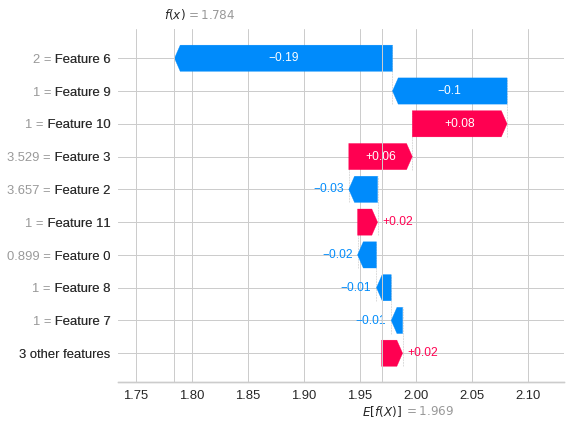

In [ ]:
model = clf.best_estimator_
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[0])

In [ ]:
shap_values

.values =
array([[-0.001043  ,  0.07938927,  0.01871721, ...,  0.00082838,
        -0.00479056,  0.00574704],
       [-0.001043  ,  0.09443602,  0.01871721, ...,  0.00082838,
        -0.00479056,  0.00665886],
       [-0.001043  ,  0.02027039,  0.03576993, ...,  0.04699919,
        -0.0037607 , -0.00881959],
       ...,
       [-0.0016281 , -0.03801692, -0.01482628, ..., -0.00658815,
        -0.02787199, -0.02540338],
       [-0.0016281 , -0.06361919, -0.01482628, ..., -0.00658815,
        -0.02523267, -0.02850984],
       [-0.0016281 , -0.02864606, -0.01482628, ..., -0.00658815,
         0.02564381, -0.02850984]], dtype=float32)

.base_values =
array([1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997,
       1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997,
       1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997,
       1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0018997,
       1.0018997, 1.0018997, 1.0018997, 1.0018997, 1.0

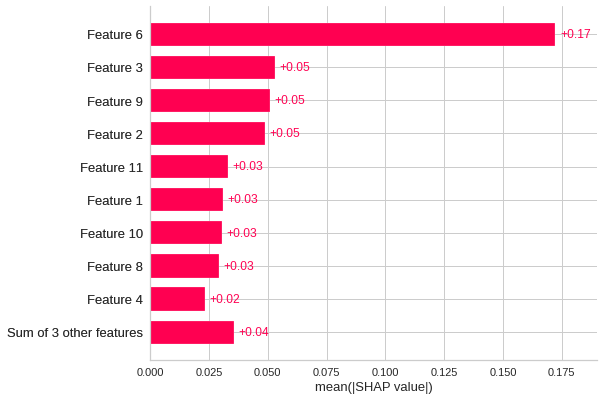

In [ ]:
shap.plots.bar(shap_values)

Processing store : 619 and csc : 146385
146385-LIPTON SOUP ONION MIX 10-DRY SOUP
Length of train data :  810
Length of test data :  171


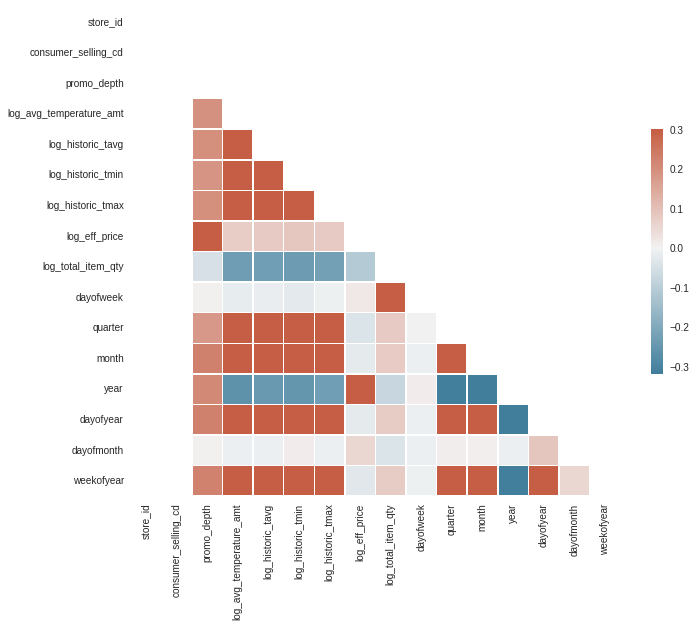

Calling xgboost_regression
Best parameters: {'subsample': 0.7, 'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.7}
Lowest RMSE:  0.4976179562054551


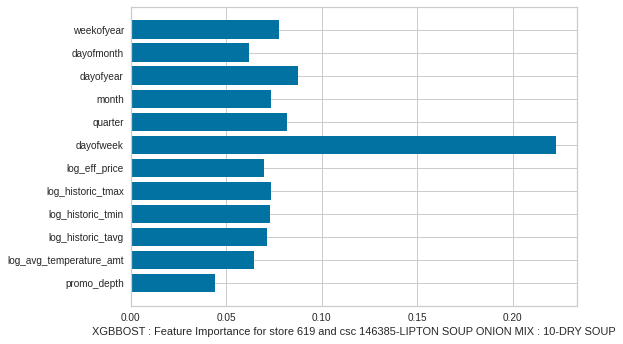

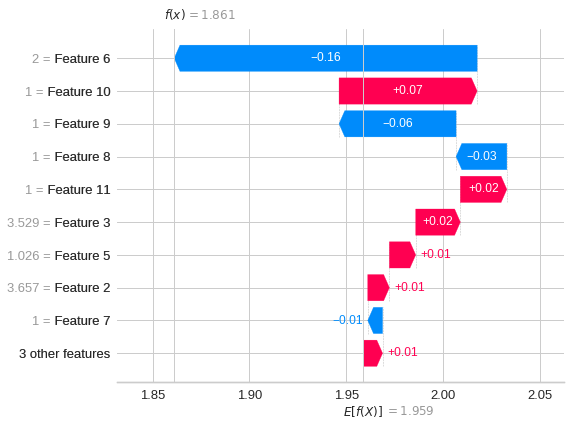

Calling lightgbm_regression
Fitting 5 folds for each of 34 candidates, totalling 170 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.7, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}


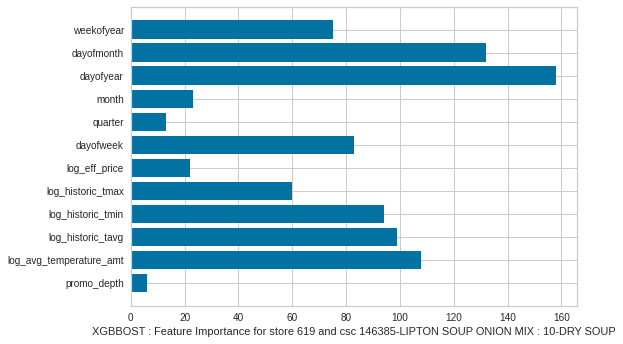

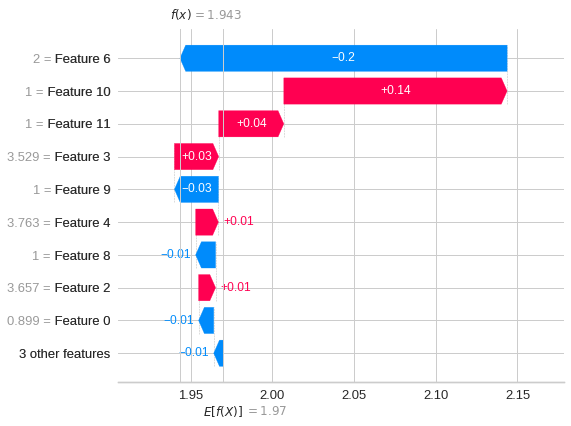

Processing store : 619 and csc : 146393
146393-S SEL BROTH CHICKN REDUCD SODIUM ASEPTIC 15-BOUILON BROTH
Length of train data :  797
Length of test data :  127


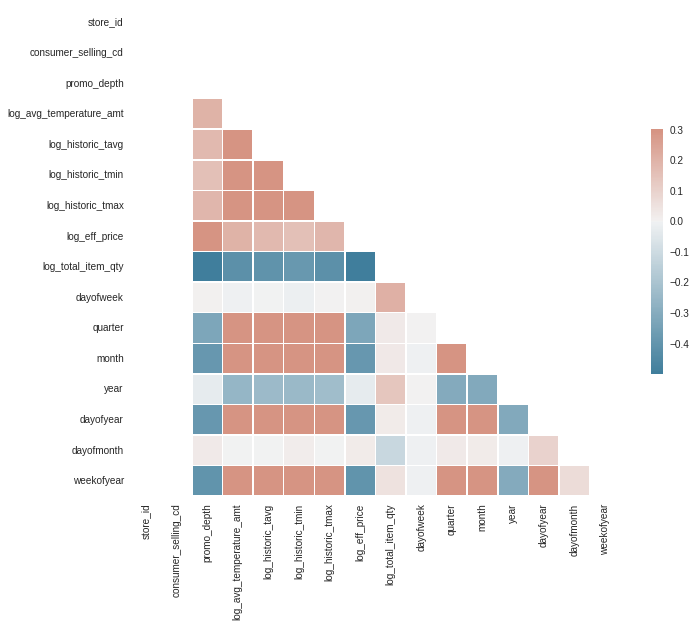

Calling xgboost_regression
Best parameters: {'subsample': 0.6, 'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.01, 'colsample_bytree': 0.8999999999999999, 'colsample_bylevel': 0.5}
Lowest RMSE:  0.6497510800890975


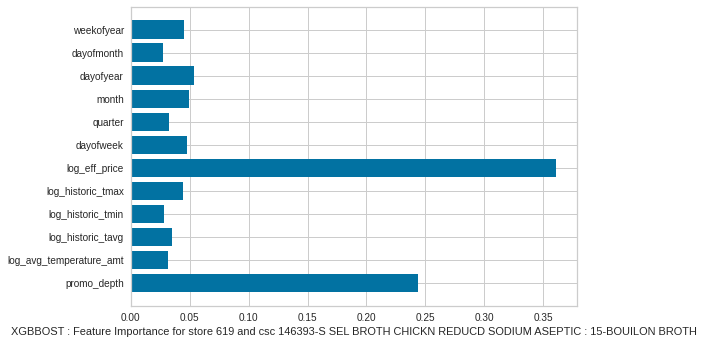

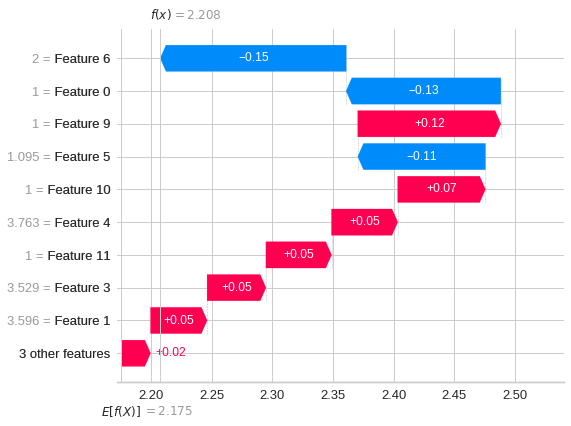

Calling lightgbm_regression
Fitting 5 folds for each of 81 candidates, totalling 405 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.7, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 8, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}


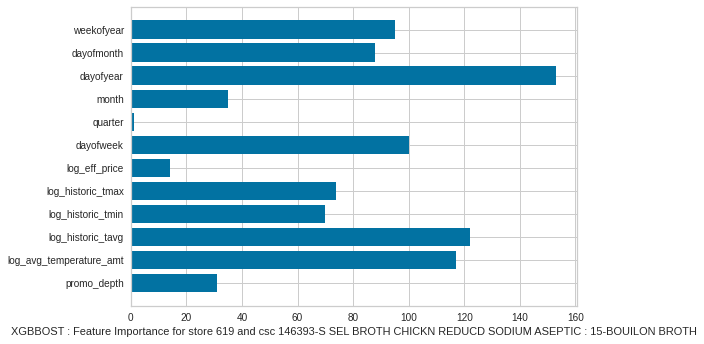

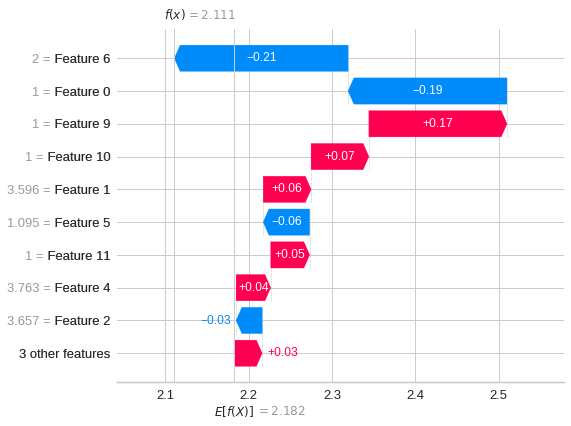

Processing store : 619 and csc : 146399
146399-S SEL BROTH CHICKEN ASEPTIC 15-BOUILON BROTH
Length of train data :  815
Length of test data :  174


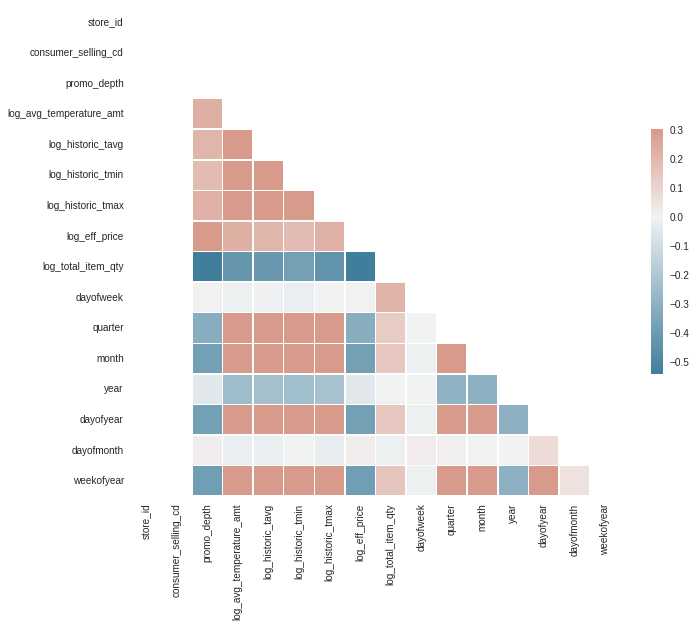

Calling xgboost_regression
Best parameters: {'subsample': 0.5, 'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5}
Lowest RMSE:  0.5749407333593549


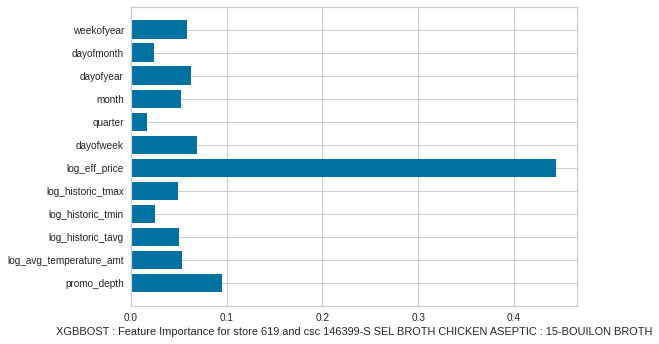

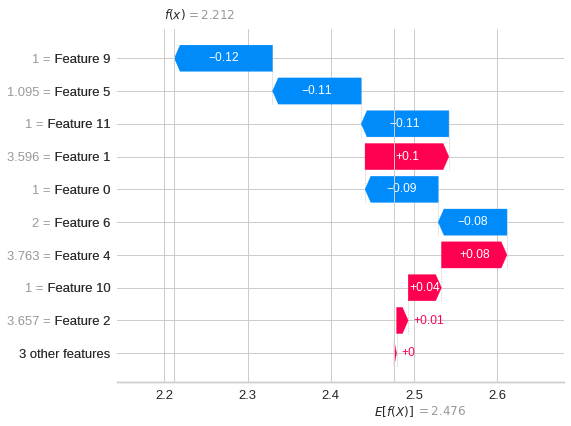

Calling lightgbm_regression
Fitting 5 folds for each of 73 candidates, totalling 365 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.7, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 6, 'learning_rate': 0.05, 'colsample_bytree': 0.7, 'boosting_type': 'gbdt'}


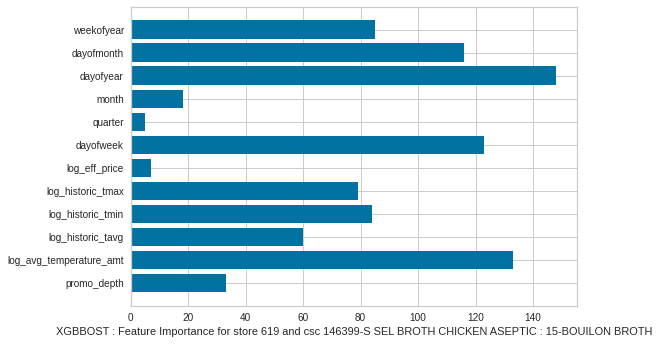

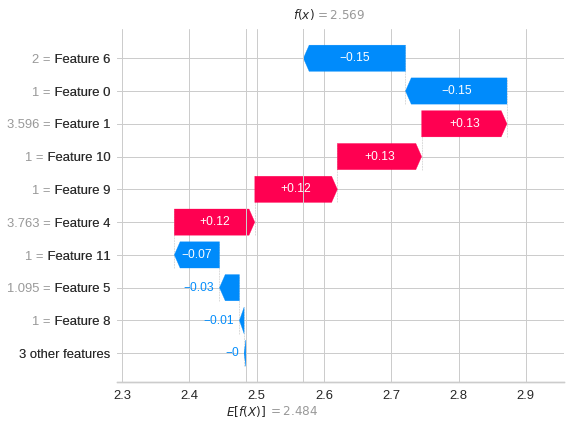

Processing store : 619 and csc : 146408
146408-PROGRESSO RTS SOUP CHICKEN NOODLE TRAD 20-READY TO SERVE SOUP
Length of train data :  733
Length of test data :  140


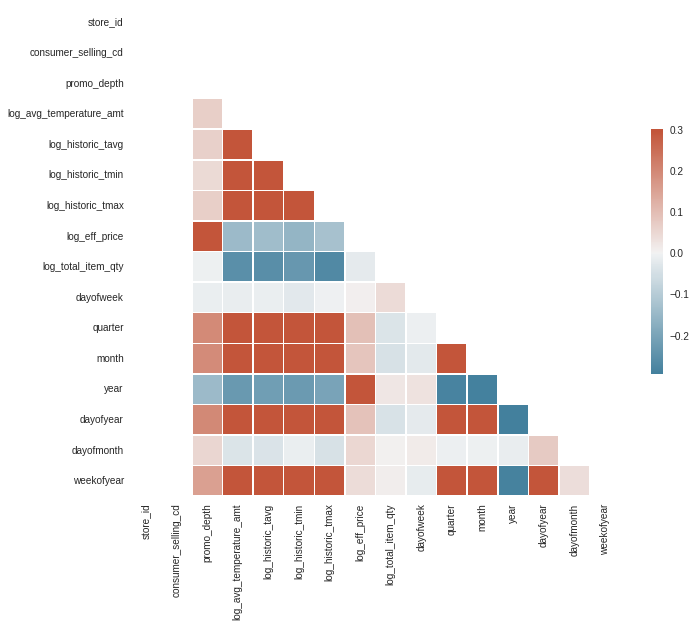

Calling xgboost_regression
Best parameters: {'subsample': 0.7999999999999999, 'n_estimators': 10, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.7999999999999999, 'colsample_bylevel': 0.8999999999999999}
Lowest RMSE:  0.8602615260622554


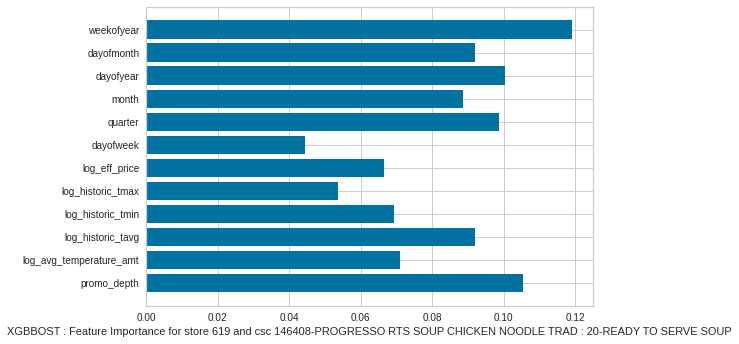

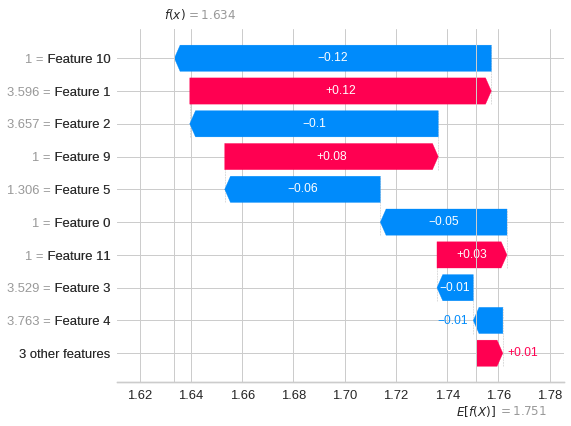

Calling lightgbm_regression
Fitting 5 folds for each of 86 candidates, totalling 430 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.5, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.7, 'boosting_type': 'gbdt'}


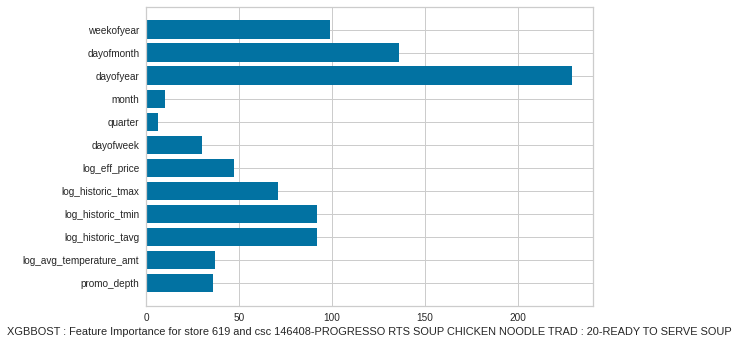

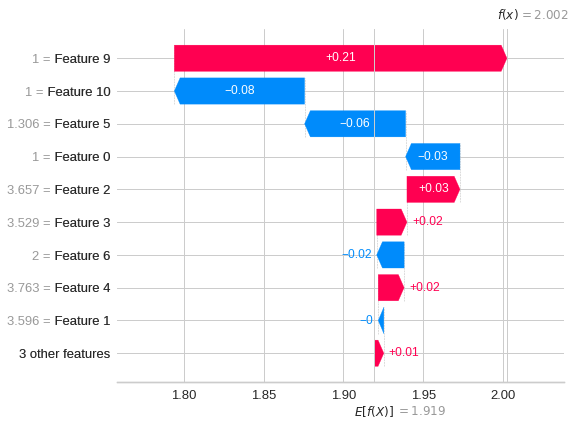

Processing store : 619 and csc : 146453
146453-PROGRESSO RCH & HRTY SOUP CHKN & NOODLE 20-READY TO SERVE SOUP
Length of train data :  684
Length of test data :  110


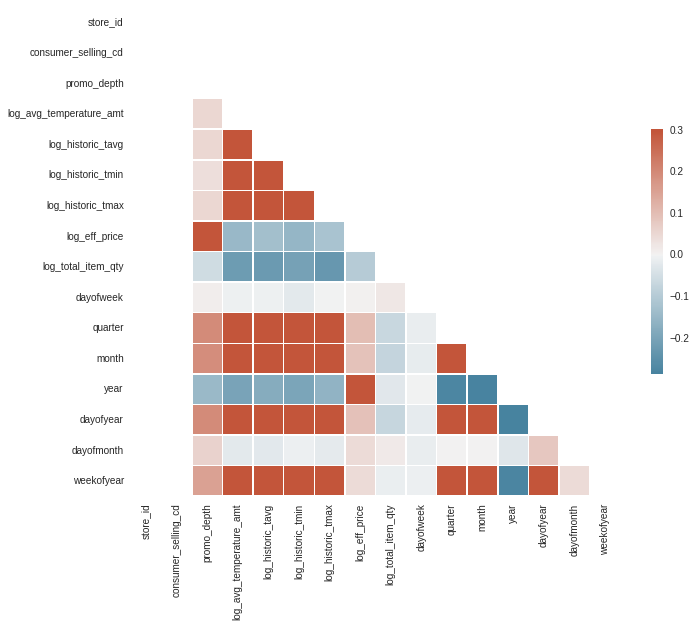

Calling xgboost_regression
Best parameters: {'subsample': 0.7999999999999999, 'n_estimators': 1000, 'max_depth': 5, 'learning_rate': 0.01, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.4}
Lowest RMSE:  0.9134558373720914


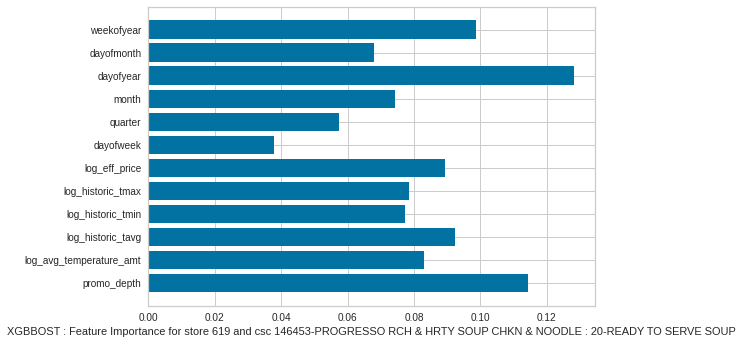

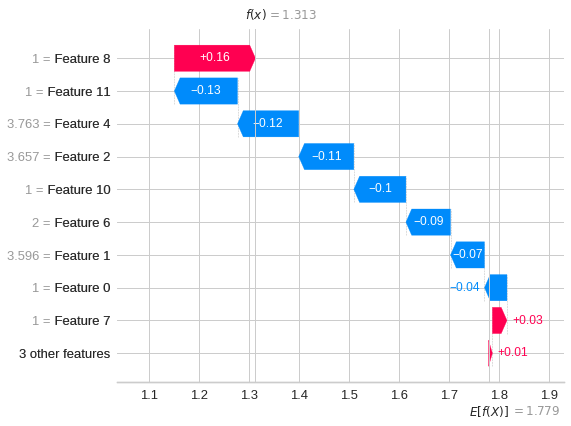

Calling lightgbm_regression
Fitting 5 folds for each of 24 candidates, totalling 120 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.7, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 6, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}


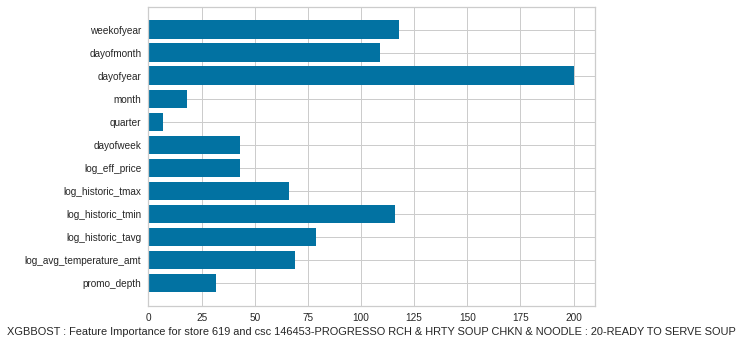

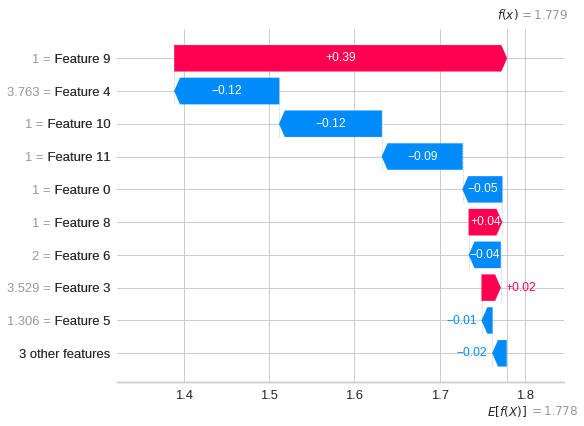

Processing store : 619 and csc : 146629
146629-CMPBL COND SOUP TOMATO 1-CONDENSED MULTI-SERVE EATING SOUP
Length of train data :  754
Length of test data :  157


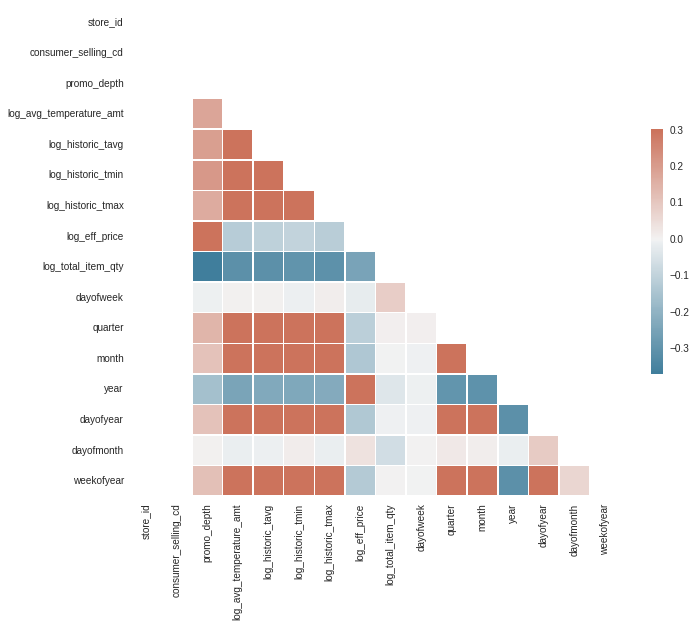

Calling xgboost_regression
Best parameters: {'subsample': 0.6, 'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.01, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.8999999999999999}
Lowest RMSE:  0.7964167531244462


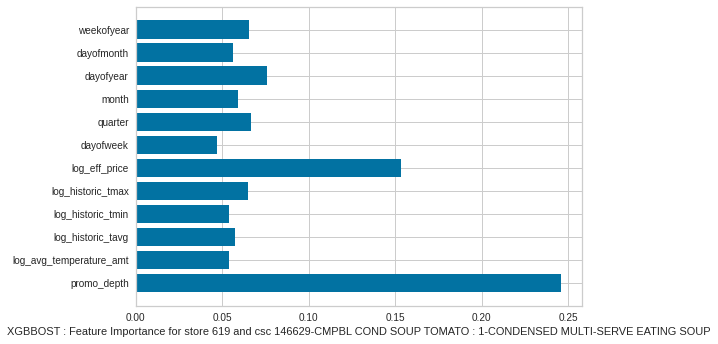

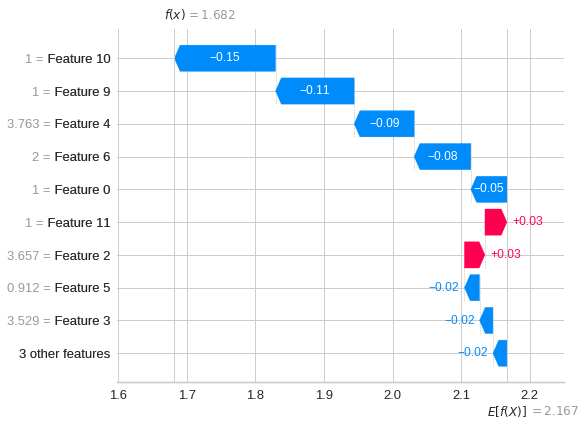

Calling lightgbm_regression
Fitting 5 folds for each of 15 candidates, totalling 75 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


{'subsample': 0.5, 'random_state': 501, 'objective': 'regression', 'num_leaves': 10, 'min_split_gain': 0.01, 'min_data_in_leaf': 10, 'metric': 'mse', 'max_depth': 7, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}


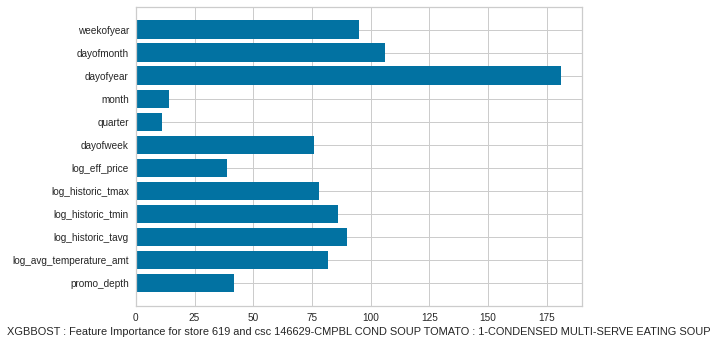

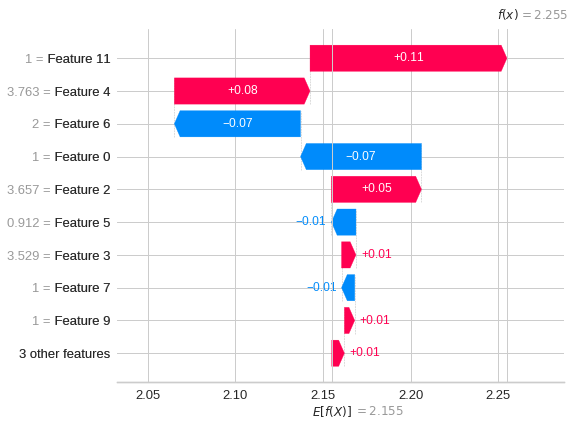

Processing store : 619 and csc : 146675
146675-CMPBL COND SOUP CHICKEN NOODLE 1-CONDENSED MULTI-SERVE EATING SOUP
Length of train data :  739
Length of test data :  144


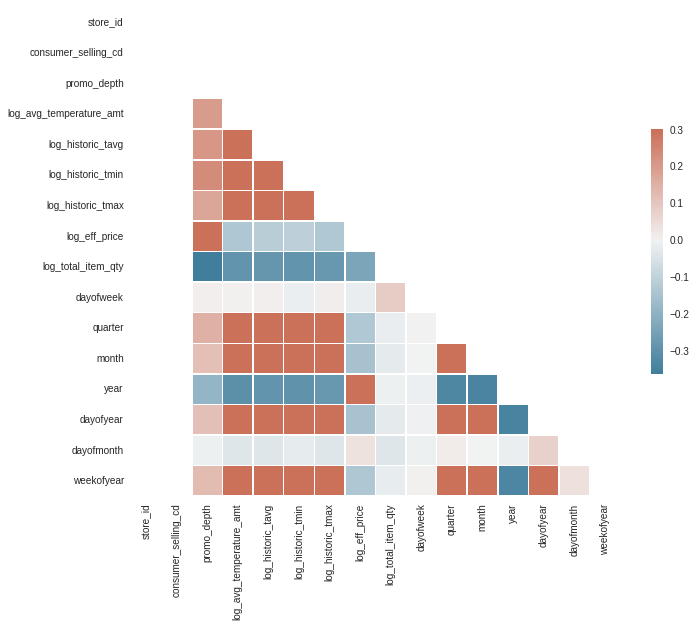

Calling xgboost_regression


In [ ]:

for e in unique_str_csc_list:

    store, csc = e[0], e[1]
    print(f"Processing store : {store} and csc : {csc}")

    csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    print(csc_info, smic_ctg_info)

    print("Length of train data : ", len(df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]))
    print("Length of test data : ", len(df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]))
    #print("Length of val data : ", len(df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]))
    
    df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
    df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]
    #df_val_modified = df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]

    train_indices = df_train_modified.index
    test_indices = df_test_modified.index
    #val_indices = df_val_modified.index

    X_train = df_train_modified[x_cols].values
    y_train = df_train_modified[y_col].values

    #X_val = df_val_modified[x_cols].values
    #y_val = df_val_modified[y_col].values

    X_test = df_test_modified[x_cols].values
    y_test = df_test_modified[y_col].values

    corr = df_train_modified.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.show(block = False)

    print("Calling xgboost_regression")
    y_test_combined_xgbmr = xgboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_ctg_info)
    df_test_actual_vs_predicted_xgbmr = df_test_actual_vs_predicted_xgbmr.append(y_test_combined_xgbmr)

    print("Calling lightgbm_regression")
    y_test_combined_lgbmr = lightgbm_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_ctg_info)
    df_test_actual_vs_predicted_lgbmr = df_test_actual_vs_predicted_lgbmr.append(y_test_combined_lgbmr)

    '''
    ### XGBoost ###
    #xgboost_reg_1 = xgboost.XGBRegressor(n_estimators=100, max_depth = 5)# for val
    xgboost_reg_2 = xgboost.XGBRegressor(objective ='reg:linear', seed=20, verbosity = 0)# for test
    params = { 'max_depth': [3, 5, 6, 10, 15, 20],
               'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
               'subsample': np.arange(0.5, 1.0, 0.1),
               'colsample_bytree': np.arange(0.4, 1.0, 0.1),
               'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
               'n_estimators': [10, 50, 100, 500, 1000]
             }
    clf = RandomizedSearchCV(estimator=xgboost_reg_2,
                             param_distributions=params,
                             scoring='neg_mean_squared_error',
                             #loss = 'huber',
                             n_iter=25,
                             verbose=0)
    clf.fit(X_train, y_train)
    print("Best parameters:", clf.best_params_)
    print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    # Making the Prediction Error Plot
    #print("\nPrediction Error Plot")
    #print(prediction_error(clf, X_train, y_train, X_test, y_test))

    # Making the Residuals Plot
    #print("\nResiduals Plot")
    #print(residuals_plot(clf, X_train, y_train, X_test, y_test))

    #test_wmape = weighted_mape(y_test_combined['y_test_actual'], y_test_combined['y_test_predicted']).numpy()
    #print("Test wmape : ", test_wmape)
    
    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_xgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    df_test_actual_vs_predicted_xgbmr = df_test_actual_vs_predicted_xgbmr.append(y_test_combined)

    # Shap
    model = clf.best_estimator_
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    shap.plots.bar(shap_values)
    plt.show(block = False)

    #LighGBM
    gridParams = {
    'learning_rate': [0.05],
    'num_leaves': [90,200],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['auc']
    }
    lgbmr = lgb.LGBMRegressor()
    grid = RandomizedSearchCV(lgbmr,gridParams,verbose=1,n_jobs = -1,n_iter=10)
    grid.fit(X_train,y_train)
    print(grid.best_params_)
    y_pred_lgbmr = grid.predict(X_test)
    '''
    

In [116]:
df_test_actual_vs_predicted_xgbmr.index

Index(['2022-05-01', '2022-05-02', '2022-05-03', '2022-05-04', '2022-05-05',
       '2022-05-06', '2022-05-07', '2022-05-08', '2022-05-09', '2022-05-10',
       ...
       '2022-07-18', '2022-07-23', '2022-07-30', '2022-08-03', '2022-08-07',
       '2022-08-11', '2022-08-14', '2022-08-17', '2022-08-19', '2022-08-20'],
      dtype='object', name='day_dt', length=4858)

In [115]:
df_test_actual_vs_predicted_lgbmr.index

Index(['2022-05-01', '2022-05-02', '2022-05-03', '2022-05-04', '2022-05-05',
       '2022-05-06', '2022-05-07', '2022-05-08', '2022-05-09', '2022-05-10',
       ...
       '2022-07-18', '2022-07-23', '2022-07-30', '2022-08-03', '2022-08-07',
       '2022-08-11', '2022-08-14', '2022-08-17', '2022-08-19', '2022-08-20'],
      dtype='object', name='day_dt', length=4858)

In [117]:
df_feature_importance_xgbmr = pd.DataFrame(feature_importance_xgbmr_list)
df_feature_importance_xgbmr.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]
df_feature_importance_xgbmr

,store_id,csc,csc_info,smic_ctg_info,promo_depth_feature_importance,log_avg_temperature_amt_feature_importance,log_historic_tavg_feature_importance,log_historic_tmin_feature_importance,log_historic_tmax_feature_importance,log_eff_price_feature_importance,dayofweek_feature_importance,quarter_feature_importance,month_feature_importance,dayofyear_feature_importance,dayofmonth_feature_importance,weekofyear_feature_importance
0,619,146385,146385-LIPTON SOUP ONION MIX,10-DRY SOUP,7.00000000,121.00000000,106.00000000,94.00000000,60.00000000,22.00000000,83.00000000,15.00000000,21.00000000,172.00000000,126.00000000,65.00000000
1,619,146385,146385-LIPTON SOUP ONION MIX,10-DRY SOUP,8.00000000,115.00000000,109.00000000,92.00000000,70.00000000,21.00000000,84.00000000,15.00000000,17.00000000,169.00000000,130.00000000,70.00000000
2,619,146385,146385-LIPTON SOUP ONION MIX,10-DRY SOUP,0.04552786,0.05870169,0.07573882,0.07502088,0.06227031,0.07649845,0.19011708,0.06255729,0.11038273,0.07573966,0.06923290,0.09821226
3,619,146385,146385-LIPTON SOUP ONION MIX,10-DRY SOUP,4.00000000,123.00000000,98.00000000,97.00000000,73.00000000,24.00000000,81.00000000,15.00000000,21.00000000,158.00000000,133.00000000,73.00000000
4,619,146393,146393-S SEL BROTH CHICKN REDUCD SODIUM ASEPTIC,15-BOUILON BROTH,0.08877721,0.05278214,0.00032311,0.04190778,0.04235085,0.55837369,0.07127216,0.03211102,0.01004042,0.06667052,0.01348928,0.02190185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,326,146835,146835-COLLEGE INN CHICKEN BROTH,15-BOUILON BROTH,34.00000000,146.00000000,150.00000000,125.00000000,97.00000000,17.00000000,37.00000000,4.00000000,13.00000000,87.00000000,116.00000000,38.00000000
78,326,322325,322325-QUAKER OATMEAL HOT CEREAL OLD FASHIONED,5-HOT CEREAL,0.05696968,0.04629017,0.09217769,0.08583906,0.03218389,0.29231554,0.07678521,0.03924619,0.07047708,0.05123590,0.08117907,0.07530057
79,326,322325,322325-QUAKER OATMEAL HOT CEREAL OLD FASHIONED,5-HOT CEREAL,26.00000000,110.00000000,138.00000000,105.00000000,83.00000000,52.00000000,41.00000000,0.00000000,6.00000000,109.00000000,105.00000000,39.00000000
80,326,461103,461103-PACIFIC BROTH CKN LS ORGNC,15-BOUILON BROTH,0.07876457,0.10023680,0.11205581,0.12523025,0.10774114,0.05906626,0.04356813,0.03553209,0.08609612,0.10244152,0.08222592,0.06704142


In [ ]:
df_feature_importance_lgbmr = pd.DataFrame(feature_importance_lgbmr_list)
df_feature_importance_lgbmr.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]
df_feature_importance_lgbmr

In [ ]:
df_test_actual_vs_predicted_xgbmr['y_test_actual_transformed'] = df_test_actual_vs_predicted_xgbmr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_xgbmr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_xgbmr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_xgbmr

,y_test_actual,y_test_predicted,store_id,csc,y_test_actual_transformed,y_test_predicted_transformed
day_dt,,,,,,
2022-05-01,2.63905733,1.90049362,619,146385,13.0,6.0
2022-05-02,1.60943791,1.79661036,619,146385,4.0,5.0
2022-05-03,2.19722458,1.64676905,619,146385,8.0,4.0
2022-05-04,2.30258509,1.72013664,619,146385,9.0,5.0
2022-05-05,1.60943791,1.77141321,619,146385,4.0,5.0
...,...,...,...,...,...,...
2022-08-11,1.09861229,1.06659389,326,461103,2.0,2.0
2022-08-14,0.69314718,0.93841136,326,461103,1.0,2.0
2022-08-17,1.38629436,0.86920762,326,461103,3.0,1.0


In [ ]:
df_test_actual_vs_predicted_lgbmr['y_test_actual_transformed'] = df_test_actual_vs_predicted_lgbmr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_lgbmr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_lgbmr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_lgbmr

In [ ]:
wmape_list_xgbmr = df_test_actual_vs_predicted_xgbmr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))
wmape_list_xgbmr = np.asarray(wmape_list_xgbmr)
wmape_list_xgbmr = [e.numpy() for e in wmape_list_xgbmr]
wmape_list_xgbmr

[36.71875,
 50.0,
 42.435424354243544,
 41.81818181818181,
 43.103448275862064,
 43.40659340659341,
 51.80412371134021,
 48.75,
 47.8494623655914,
 50.495049504950494,
 22.400000000000002,
 50.857142857142854,
 38.23529411764706,
 44.339622641509436,
 51.52263374485597,
 45.26315789473684,
 51.515151515151516,
 48.07692307692308,
 46.96969696969697,
 45.0,
 44.47761194029851,
 51.47849462365591,
 49.168474331164134,
 64.39522998296422,
 61.297539149888145,
 49.2639842983317,
 51.5370705244123,
 45.48611111111111,
 56.529209621993125,
 63.485838779956424,
 53.01067073170732,
 58.625792811839325,
 56.01926163723917,
 41.596638655462186,
 37.32590529247911,
 46.92579505300353,
 46.94313809320222,
 90.5940594059406,
 56.12403100775194,
 57.1917808219178]

In [ ]:
df_kpi_xgbmr = df_test_actual_vs_predicted_xgbmr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_xgbmr['wmape'] = wmape_list_xgbmr
df_kpi_xgbmr['accuracy'] = 100 - df_kpi_xgbmr['wmape']
df_kpi_xgbmr.sort_values(by=['accuracy'], ascending = False)

,store_id,csc,wmape,accuracy
10,619,322059,22.40000000,77.60000000
0,619,146385,36.71875000,63.28125000
34,326,146399,37.32590529,62.67409471
12,619,322087,38.23529412,61.76470588
33,326,322455,41.59663866,58.40336134
3,619,146408,41.81818182,58.18181818
2,619,146399,42.43542435,57.56457565
4,619,146453,43.10344828,56.89655172
5,619,146629,43.40659341,56.59340659
13,619,322554,44.33962264,55.66037736


In [ ]:
wmape_list_lgbmr = df_test_actual_vs_predicted_lgbmr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))
wmape_list_lgbmr = np.asarray(wmape_list_lgbmr)
wmape_list_lgbmr = [e.numpy() for e in wmape_list_lgbmr]
wmape_list_lgbmr

In [ ]:
df_kpi_lgbmr = df_test_actual_vs_predicted_lgbmr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_lgbmr['wmape'] = wmape_list_lgbmr
df_kpi_lgbmr['accuracy'] = 100 - df_kpi_lgbmr['wmape']
df_kpi_lgbmr.sort_values(by=['accuracy'], ascending = False)

In [ ]:
np.exp(1.92986488)-1, np.exp(2.63905733)-1, np.log(5.88857942 + 1)

(5.88857939384694, 13.00000000538638, 1.9298648837965826)

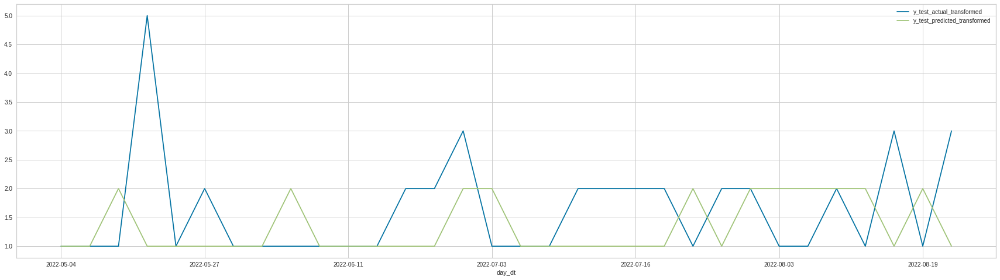

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 326) & (df_test_actual_vs_predicted_xgbmr.csc.isin([461103]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

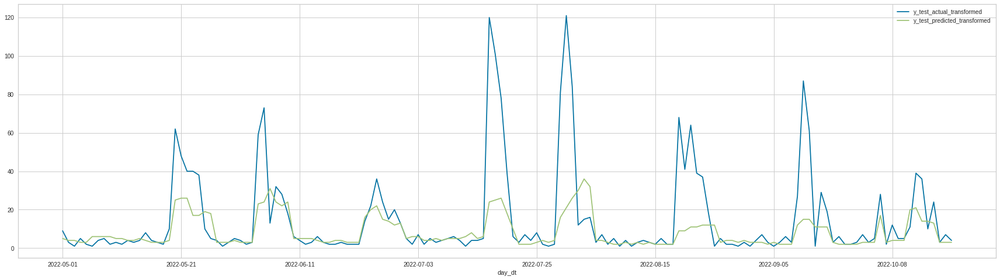

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc.isin([322045]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

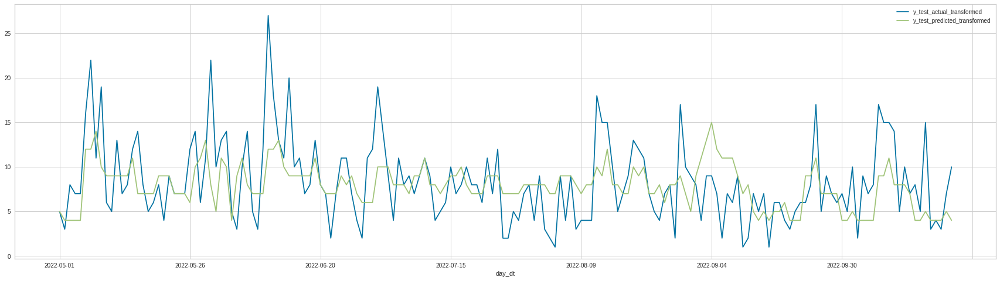

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc.isin([322087]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

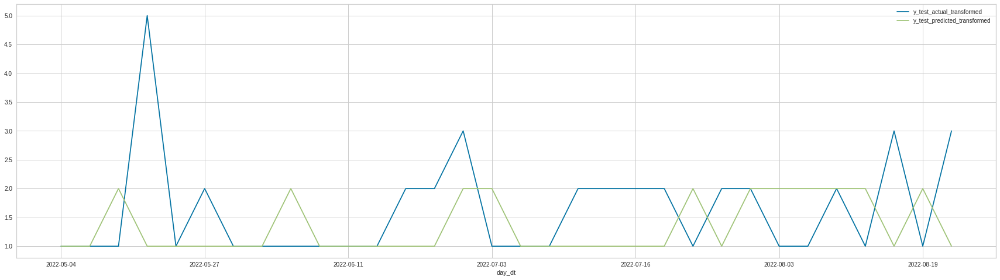

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 326) & (df_test_actual_vs_predicted_xgbmr.csc == 461103)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

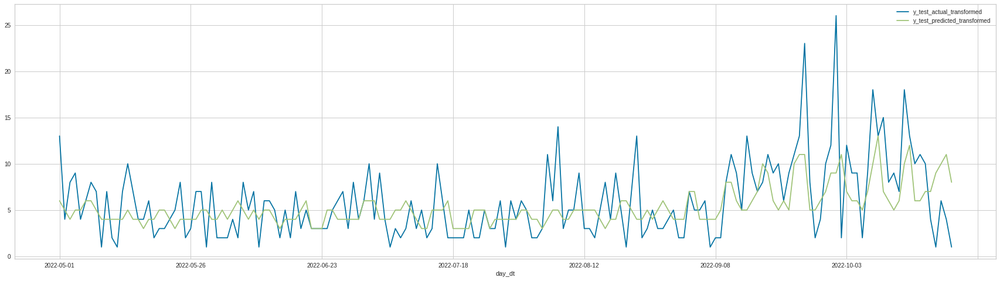

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc == 146385)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

# ***Aggregate Forecast to Week Level***

In [ ]:
df_train.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [ ]:
df_test_actual_vs_predicted_xgbmr.head()

,y_test_actual,y_test_predicted,store_id,csc,y_test_actual_transformed,y_test_predicted_transformed
day_dt,,,,,,
2022-05-01,2.63905733,1.90049362,619,146385,13.0,6.0
2022-05-02,1.60943791,1.79661036,619,146385,4.0,5.0
2022-05-03,2.19722458,1.64676905,619,146385,8.0,4.0
2022-05-04,2.30258509,1.72013664,619,146385,9.0,5.0
2022-05-05,1.60943791,1.77141321,619,146385,4.0,5.0


In [ ]:
df_txn_weekly = pd.merge(df_txn[df_txn.txn_dte <= '2022-04-30'], df_day_week, how = 'inner', left_on = 'txn_dte', right_on = 'date_val').groupby(['week_start_date', 'week_end_date', 'store_id', 'consumer_selling_cd']).agg({'total_item_qty' : np.sum}).reset_index()
#df_txn_weekly['week_end_date'] = pd.to_datetime(df_txn_weekly['week_end_date'])
df_txn_weekly.set_index('week_end_date', inplace = True)
df_txn_weekly.iloc[0]

week_start_date        2019-12-29
store_id                      326
consumer_selling_cd        146399
total_item_qty                  5
Name: 2020-01-04, dtype: object

In [ ]:
df_fcst_actual_week = pd.merge(df_test_actual_vs_predicted_xgbmr.reset_index(), df_day_week, how = 'inner', left_on = 'day_dt', right_on = 'date_val')

In [ ]:
df_fcst_actual_week.columns

Index(['day_dt', 'y_test_actual', 'y_test_predicted', 'store_id', 'csc',
       'y_test_actual_transformed', 'y_test_predicted_transformed', 'date_val',
       'year', 'week_start_date', 'week_end_date', 'week_nbr'],
      dtype='object')

In [ ]:
df_fcst_actual_week.iloc[0]

day_dt                          2022-05-01
y_test_actual                   2.63905733
y_test_predicted                1.90049362
store_id                               619
csc                                 146385
y_test_actual_transformed             13.0
y_test_predicted_transformed           6.0
date_val                        2022-05-01
year                                  2022
week_start_date                 2022-05-01
week_end_date                   2022-05-07
week_nbr                                19
Name: 0, dtype: object

In [ ]:
df_fcst_actual_week_refined = df_fcst_actual_week[['store_id', 'csc', 'day_dt', 'y_test_actual_transformed', 'y_test_predicted_transformed', 'week_start_date', 'week_end_date']]

In [ ]:
df_fcst_actual_week_refined.iloc[0]

store_id                               619
csc                                 146385
day_dt                          2022-05-01
y_test_actual_transformed             13.0
y_test_predicted_transformed           6.0
week_start_date                 2022-05-01
week_end_date                   2022-05-07
Name: 0, dtype: object

In [ ]:
df_test_act_vs_pred_wkly = df_fcst_actual_week_refined.groupby(['store_id', 'csc', 'week_start_date', 'week_end_date']).agg({'y_test_actual_transformed' : np.sum, 'y_test_predicted_transformed' : np.sum}).reset_index()

In [ ]:
df_fcst_actual_week_refined

,store_id,csc,day_dt,y_test_actual_transformed,y_test_predicted_transformed,week_start_date,week_end_date
0,619,146385,2022-05-01,13.0,6.0,2022-05-01,2022-05-07
1,619,146393,2022-05-01,6.0,6.0,2022-05-01,2022-05-07
2,619,146399,2022-05-01,7.0,13.0,2022-05-01,2022-05-07
3,619,146408,2022-05-01,6.0,4.0,2022-05-01,2022-05-07
4,619,146453,2022-05-01,4.0,4.0,2022-05-01,2022-05-07
...,...,...,...,...,...,...,...
4853,326,322389,2022-06-21,1.0,2.0,2022-06-19,2022-06-25
4854,326,146408,2022-06-21,2.0,2.0,2022-06-19,2022-06-25
4855,326,146835,2022-06-21,1.0,2.0,2022-06-19,2022-06-25
4856,326,322325,2022-06-21,1.0,1.0,2022-06-19,2022-06-25


In [ ]:
df_test_act_vs_pred_wkly

,store_id,csc,week_start_date,week_end_date,y_test_actual_transformed,y_test_predicted_transformed
0,326,146399,2022-05-01,2022-05-07,4.0,6.0
1,326,146399,2022-05-08,2022-05-14,5.0,7.0
2,326,146399,2022-05-15,2022-05-21,5.0,6.0
3,326,146399,2022-05-22,2022-05-28,3.0,4.0
4,326,146399,2022-05-29,2022-06-04,6.0,3.0
...,...,...,...,...,...,...
985,619,460913,2022-09-25,2022-10-01,15.0,20.0
986,619,460913,2022-10-02,2022-10-08,23.0,19.0
987,619,460913,2022-10-09,2022-10-15,25.0,29.0
988,619,460913,2022-10-16,2022-10-22,38.0,29.0


In [ ]:
df_kpi_wkly = df_test_act_vs_pred_wkly[['store_id', 'csc']].drop_duplicates()
wkly_wmape_list = df_test_act_vs_pred_wkly.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))

wkly_wmape_list = np.asarray(wkly_wmape_list)
wkly_wmape_list = [e.numpy() for e in wkly_wmape_list]
wkly_wmape_list

df_kpi_wkly['wmape_wkly'] = wkly_wmape_list
df_kpi_wkly['accuracy_wkly'] = 100 - df_kpi_wkly['wmape_wkly']
df_kpi_wkly.sort_values(by=['accuracy_wkly'], ascending = False, inplace = True)
df_kpi_wkly

,store_id,csc,wmape_wkly,accuracy_wkly
47,326,146629,18.08118081,81.91881919
834,619,322087,19.63788301,80.36211699
366,326,460651,20.00000000,80.00000000
240,326,322325,20.80000000,79.20000000
808,619,322082,22.26890756,77.73109244
471,619,146385,22.58706468,77.41293532
600,619,146629,24.33758587,75.66241413
340,326,410691,25.18518519,74.81481481
548,619,146408,27.25724020,72.74275980
433,326,466564,27.27272727,72.72727273


In [ ]:
df_test_act_vs_pred_wkly.columns

Index(['store_id', 'csc', 'week_start_date', 'week_end_date',
       'y_test_actual_transformed', 'y_test_predicted_transformed'],
      dtype='object')

In [ ]:
df_test_act_vs_pred_wkly.index

RangeIndex(start=0, stop=990, step=1)

In [ ]:
orig_df_test_act_vs_pred_wkly = df_test_act_vs_pred_wkly.copy()

In [ ]:
df_test_act_vs_pred_wkly = pd.merge(df_test_act_vs_pred_wkly, df_str_zip, how='inner', on = ['store_id'])
df_test_act_vs_pred_wkly

,store_id,csc,week_start_date,week_end_date,y_test_actual_transformed,y_test_predicted_transformed,zip5
0,326,146399,2022-05-01,2022-05-07,4.0,6.0,05673
1,326,146399,2022-05-08,2022-05-14,5.0,7.0,05673
2,326,146399,2022-05-15,2022-05-21,5.0,6.0,05673
3,326,146399,2022-05-22,2022-05-28,3.0,4.0,05673
4,326,146399,2022-05-29,2022-06-04,6.0,3.0,05673
...,...,...,...,...,...,...,...
985,619,460913,2022-09-25,2022-10-01,15.0,20.0,02747
986,619,460913,2022-10-02,2022-10-08,23.0,19.0,02747
987,619,460913,2022-10-09,2022-10-15,25.0,29.0,02747
988,619,460913,2022-10-16,2022-10-22,38.0,29.0,02747


In [ ]:
df_wkly = pd.merge(df_test_act_vs_pred_wkly, df_wkly_weather_stats, how = 'inner', on = ['zip5', 'store_id', 'week_start_date', 'week_end_date'])
df_wkly = pd.merge(df_wkly, df_upc_2[['consumer_selling_cd', 'item_dsc', 'smic_group_cd', 'smic_group_dsc', 'smic_category_cd', 'smic_category_dsc']], how = 'inner', left_on = 'csc', right_on = 'consumer_selling_cd')
df_wkly.drop(columns = ['consumer_selling_cd'], inplace = True)
df_wkly.set_index(['week_end_date'], inplace = True)
df_wkly.iloc[0]

store_id                                                 326
csc                                                   146399
week_start_date                                   2022-05-01
y_test_actual_transformed                                4.0
y_test_predicted_transformed                             6.0
zip5                                                   05673
wkly_avg_high_temperature_amt                    59.88571429
wkly_avg_low_temperature_amt                     39.41428571
wkly_avg_temperature_amt                               49.65
item_dsc                         S SEL BROTH CHICKEN ASEPTIC
smic_group_cd                                             25
smic_group_dsc                                         SOUPS
smic_category_cd                                          15
smic_category_dsc                              BOUILON BROTH
Name: 2022-05-07, dtype: object

In [ ]:
df_wkly.index

Index(['2022-05-07', '2022-05-14', '2022-05-21', '2022-05-28', '2022-06-04',
       '2022-06-11', '2022-06-18', '2022-06-25', '2022-07-02', '2022-07-09',
       ...
       '2022-08-27', '2022-09-03', '2022-09-10', '2022-09-17', '2022-09-24',
       '2022-10-01', '2022-10-08', '2022-10-15', '2022-10-22', '2022-10-29'],
      dtype='object', name='week_end_date', length=990)

In [ ]:
df_wkly_weather_stats.columns

Index(['zip5', 'week_start_date', 'wkly_avg_high_temperature_amt',
       'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt', 'store_id'],
      dtype='object')

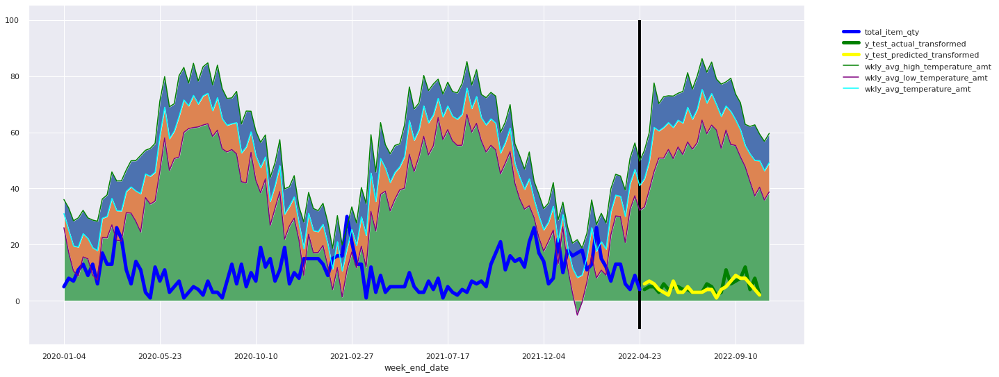

In [ ]:
fig, ax = fig, ax = plt.subplots(figsize=(20, 9))
temp = pd.concat([
           df_txn_weekly[(df_txn_weekly.store_id == 326) & (df_txn_weekly.consumer_selling_cd == 146399)][['total_item_qty']],
           df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146399)][['y_test_actual_transformed','y_test_predicted_transformed']]
                 ])

temp[['total_item_qty']].plot(color='blue', ax = ax, linewidth = 5)
temp[['y_test_actual_transformed']].plot(color='green', ax = ax, linewidth = 5)
temp[['y_test_predicted_transformed']].plot(color='yellow', ax = ax, linewidth = 5)

df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326][['wkly_avg_high_temperature_amt']].plot(color='green', ax = ax, style = '-')
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326][['wkly_avg_low_temperature_amt']].plot(color='purple', ax = ax)
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326][['wkly_avg_temperature_amt']].plot(color='cyan', ax = ax)

ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_low_temperature_amt)

ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)
plt.legend(bbox_to_anchor=(1.25, 0.95))

In [ ]:
df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)]

,week_start_date,store_id,consumer_selling_cd,total_item_qty
week_end_date,,,,
2020-07-18,2020-07-12,619,413364,14
2020-07-25,2020-07-19,619,413364,7
2020-08-01,2020-07-26,619,413364,15
2020-08-08,2020-08-02,619,413364,18
2020-08-15,2020-08-09,619,413364,14
...,...,...,...,...
2022-04-02,2022-03-27,619,413364,19
2022-04-09,2022-04-03,619,413364,54
2022-04-16,2022-04-10,619,413364,61


In [ ]:
df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)]

,store_id,csc,week_start_date,y_test_actual_transformed,y_test_predicted_transformed,zip5,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,item_dsc,smic_group_cd,smic_group_dsc,smic_category_cd,smic_category_dsc
week_end_date,,,,,,,,,,,,,,
2022-05-07,619,413364,2022-05-01,58.0,34.0,02747,59.42857143,42.22857143,50.82857143,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-14,619,413364,2022-05-08,31.0,22.0,02747,63.85714286,46.92857143,55.39285714,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-21,619,413364,2022-05-15,22.0,15.0,02747,71.14285714,53.32857143,62.23571429,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-28,619,413364,2022-05-22,11.0,8.0,02747,70.72857143,51.51428571,61.12142857,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-06-04,619,413364,2022-05-29,18.0,15.0,02747,72.72857143,53.27142857,63.00000000,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-06-11,619,413364,2022-06-05,59.0,23.0,02747,77.34285714,54.70000000,66.02142857,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-06-18,619,413364,2022-06-12,58.0,30.0,02747,77.72857143,57.67142857,67.70000000,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-06-25,619,413364,2022-06-19,42.0,15.0,02747,75.18571429,53.38571429,64.28571429,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-07-02,619,413364,2022-06-26,22.0,12.0,02747,81.74285714,60.81428571,71.27857143,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH


In [ ]:
df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)][['total_item_qty']]

,total_item_qty
week_end_date,
2020-07-18,14
2020-07-25,7
2020-08-01,15
2020-08-08,18
2020-08-15,14
...,...
2022-04-02,19
2022-04-09,54
2022-04-16,61


In [ ]:
df_wkly

,store_id,csc,week_start_date,y_test_actual_transformed,y_test_predicted_transformed,zip5,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,item_dsc,smic_group_cd,smic_group_dsc,smic_category_cd,smic_category_dsc
week_end_date,,,,,,,,,,,,,,
2022-05-07,326,146399,2022-05-01,4.0,6.0,05673,59.88571429,39.41428571,49.65000000,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-14,326,146399,2022-05-08,5.0,7.0,05673,77.55714286,45.95714286,61.75714286,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-21,326,146399,2022-05-15,5.0,6.0,05673,70.21428571,50.80000000,60.50714286,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-05-28,326,146399,2022-05-22,3.0,4.0,05673,72.68571429,50.77142857,61.72857143,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-06-04,326,146399,2022-05-29,6.0,3.0,05673,73.00000000,53.87142857,63.43571429,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-01,619,413364,2022-09-25,17.0,22.0,02747,68.60000000,49.11428571,58.85714286,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-10-08,619,413364,2022-10-02,33.0,60.0,02747,62.42857143,48.77142857,55.60000000,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH
2022-10-15,619,413364,2022-10-09,40.0,37.0,02747,67.17142857,46.38571429,56.77857143,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH


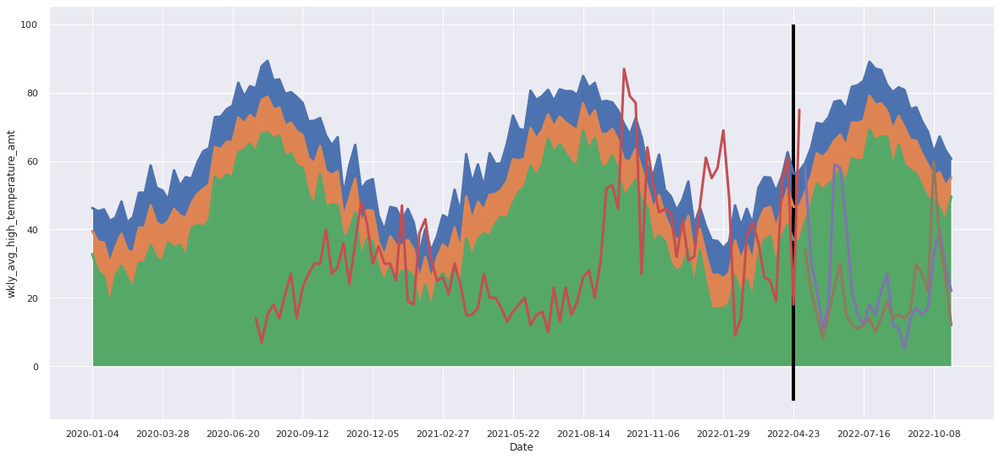

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].reset_index(), x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].reset_index(), x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].reset_index(), x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)].reset_index(), x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)].reset_index(), x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

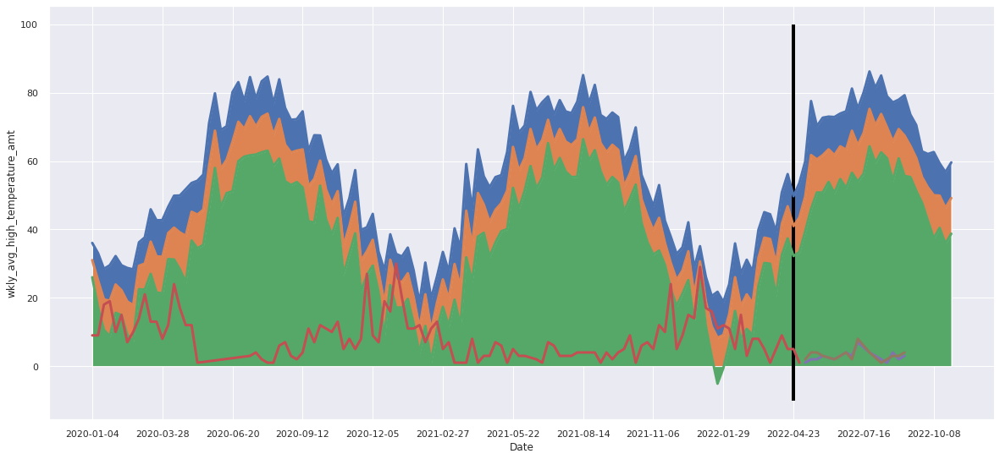

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 326) & (df_txn_weekly.consumer_selling_cd == 778229)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 778229)].reset_index(), x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 778229)].reset_index(), x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

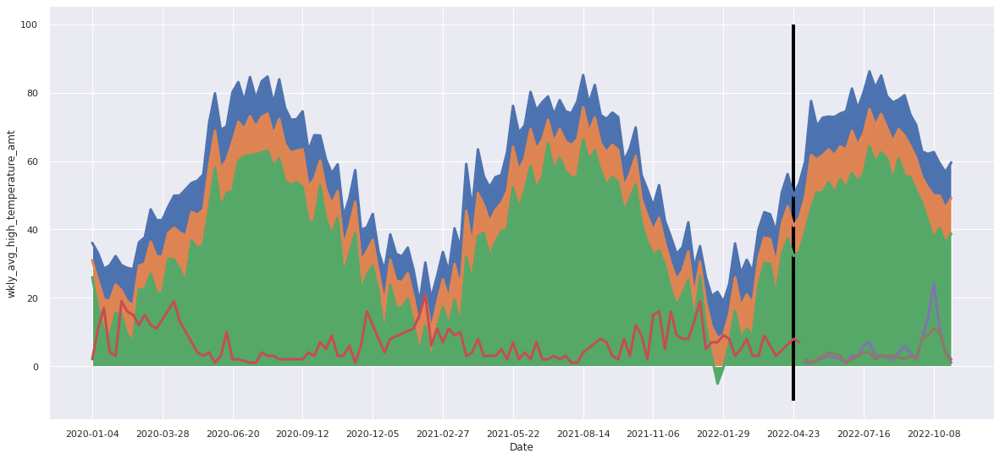

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].reset_index(), x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 326) & (df_txn_weekly.consumer_selling_cd == 146761)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146761)].reset_index(), x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146761)].reset_index(), x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
#plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

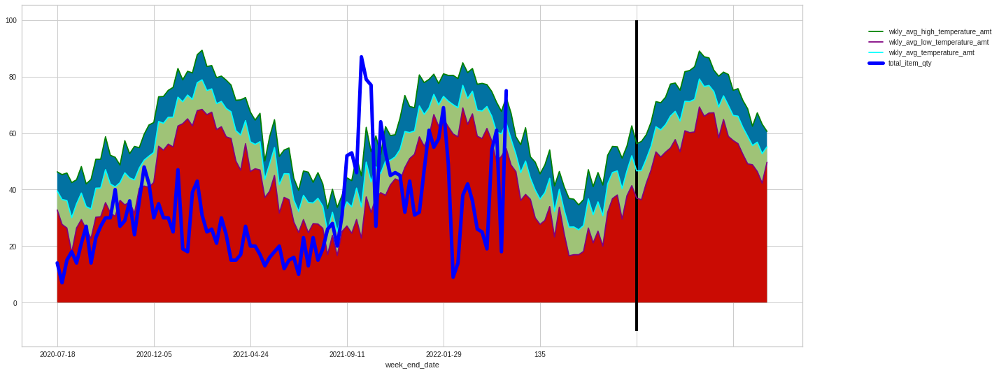

In [ ]:
fig, ax = fig, ax = plt.subplots(figsize=(20, 9))
temp = pd.concat([
           df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)][['total_item_qty']],
           df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)][['y_test_actual_transformed','y_test_predicted_transformed']]
                 ])

df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_high_temperature_amt']].plot(color='green', ax = ax, style = '-')
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_low_temperature_amt']].plot(color='purple', ax = ax)
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_temperature_amt']].plot(color='cyan', ax = ax)

ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_low_temperature_amt)

temp[['total_item_qty']].plot(color='blue', ax = ax, linewidth = 5)
#temp[['y_test_actual_transformed']].plot(color='green', ax = ax, linewidth = 5)
#temp[['y_test_predicted_transformed']].plot(color='yellow', ax = ax, linewidth = 5)


ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)
plt.legend(bbox_to_anchor=(1.25, 0.95))

In [ ]:
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619]

,zip5,week_start_date,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,store_id
week_end_date,,,,,,
2020-01-04,02747,2019-12-29,46.28571429,32.78571429,39.53571429,619
2020-01-11,02747,2020-01-05,45.30000000,27.65714286,36.47857143,619
2020-01-18,02747,2020-01-12,45.87142857,26.38571429,36.12857143,619
2020-01-25,02747,2020-01-19,42.47142857,17.61428571,30.04285714,619
2020-02-01,02747,2020-01-26,43.47142857,26.38571429,34.92857143,619
...,...,...,...,...,...,...
2022-10-01,02747,2022-09-25,68.60000000,49.11428571,58.85714286,619
2022-10-08,02747,2022-10-02,62.42857143,48.77142857,55.60000000,619
2022-10-15,02747,2022-10-09,67.17142857,46.38571429,56.77857143,619


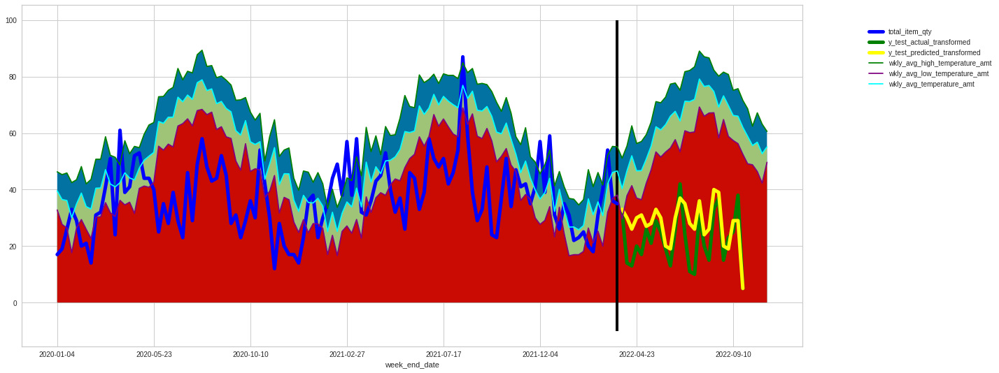

In [ ]:
fig, ax = fig, ax = plt.subplots(figsize=(20, 9))
temp = pd.concat([
           df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 460913)][['total_item_qty']],
           df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 460913)][['y_test_actual_transformed','y_test_predicted_transformed']]
                 ])

temp[['total_item_qty']].plot(color='blue', ax = ax, linewidth = 5)
temp[['y_test_actual_transformed']].plot(color='green', ax = ax, linewidth = 5)
temp[['y_test_predicted_transformed']].plot(color='yellow', ax = ax, linewidth = 5)

df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_high_temperature_amt']].plot(color='green', ax = ax, style = '-')
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_low_temperature_amt']].plot(color='purple', ax = ax)
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619][['wkly_avg_temperature_amt']].plot(color='cyan', ax = ax)

ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_low_temperature_amt)

ax.vlines(x=len(df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 322625)]), ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)
plt.legend(bbox_to_anchor=(1.25, 0.95))

In [ ]:
df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 460913)].head(2)

,store_id,csc,week_start_date,y_test_actual_transformed,y_test_predicted_transformed,zip5,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,item_dsc,smic_group_cd,smic_group_dsc,smic_category_cd,smic_category_dsc
week_end_date,,,,,,,,,,,,,,
2022-05-07,619,460913,2022-05-01,32.0,33.0,02747,59.42857143,42.22857143,50.82857143,GM CHEERIOS HONEY NUT,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL
2022-05-14,619,460913,2022-05-08,14.0,30.0,02747,63.85714286,46.92857143,55.39285714,GM CHEERIOS HONEY NUT,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL


In [ ]:
df_wkly.sort_index(inplace=True)
df_wkly = pd.merge(df_wkly, df_upc[['consumer_selling_cd', 'smic_category_id']], how = 'inner', left_on = 'csc', right_on = 'consumer_selling_cd')
df_wkly.drop(columns = ['consumer_selling_cd'], axis = 1, inplace = True)
df_wkly.sort_values(by=['week_start_date', 'store_id', 'smic_category_id', 'csc'], inplace = True)

In [ ]:
df_wkly

,store_id,csc,week_start_date,y_test_actual_transformed,y_test_predicted_transformed,zip5,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,item_dsc,smic_group_cd,smic_group_dsc,smic_category_cd,smic_category_dsc,smic_category_id
586,326,322059,2022-05-01,5.0,7.0,05673,59.88571429,39.41428571,49.650,GM CHEERIOS HONEY NUT,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL,1101
688,326,322060,2022-05-01,3.0,2.0,05673,59.88571429,39.41428571,49.650,GM CHEERIOS,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL,1101
689,326,322060,2022-05-01,3.0,2.0,05673,59.88571429,39.41428571,49.650,GM CHEERIOS,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL,1101
962,326,322082,2022-05-01,2.0,4.0,05673,59.88571429,39.41428571,49.650,GM CHEERIOS,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL,1101
963,326,322082,2022-05-01,2.0,4.0,05673,59.88571429,39.41428571,49.650,GM CHEERIOS,11,CEREAL AND BREAKFAST,1,READY TO EAT CEREAL,1101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
880,619,146761,2022-10-23,12.0,8.0,02747,60.60000000,49.65000000,55.125,SWNSN BROTH ASEPTIC CHICKEN,25,SOUPS,15,BOUILON BROTH,2515
834,619,146835,2022-10-23,15.0,27.0,02747,60.60000000,49.65000000,55.125,COLLEGE INN CHICKEN BROTH,25,SOUPS,15,BOUILON BROTH,2515
154,619,413364,2022-10-23,22.0,12.0,02747,60.60000000,49.65000000,55.125,O ORGNC BROTH CHICKEN LOW SODIUM ASEPTIC,25,SOUPS,15,BOUILON BROTH,2515
426,619,146408,2022-10-23,2.0,6.0,02747,60.60000000,49.65000000,55.125,PROGRESSO RTS SOUP CHICKEN NOODLE TRAD,25,SOUPS,20,READY TO SERVE SOUP,2520


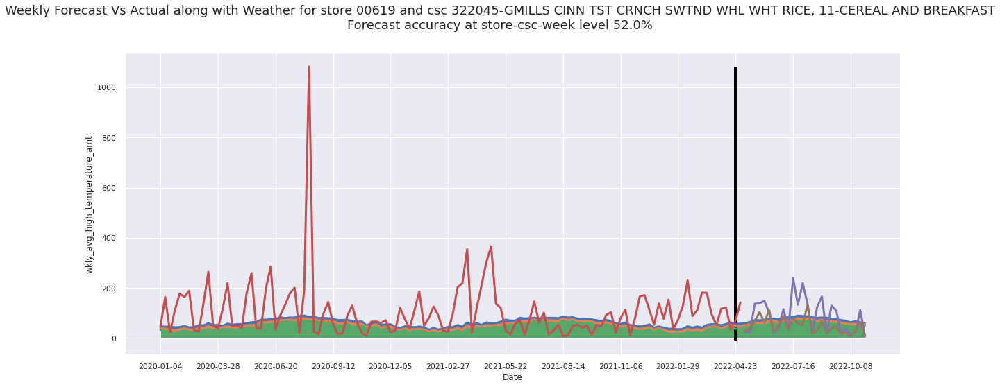

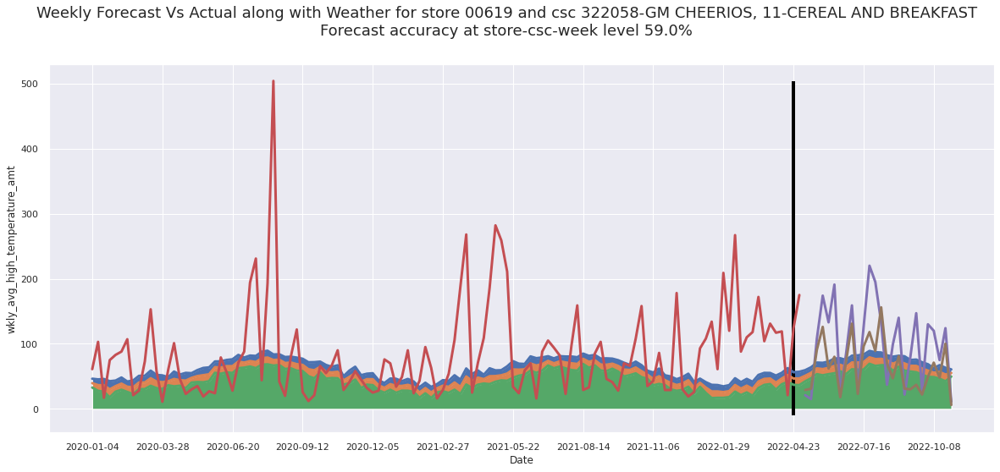

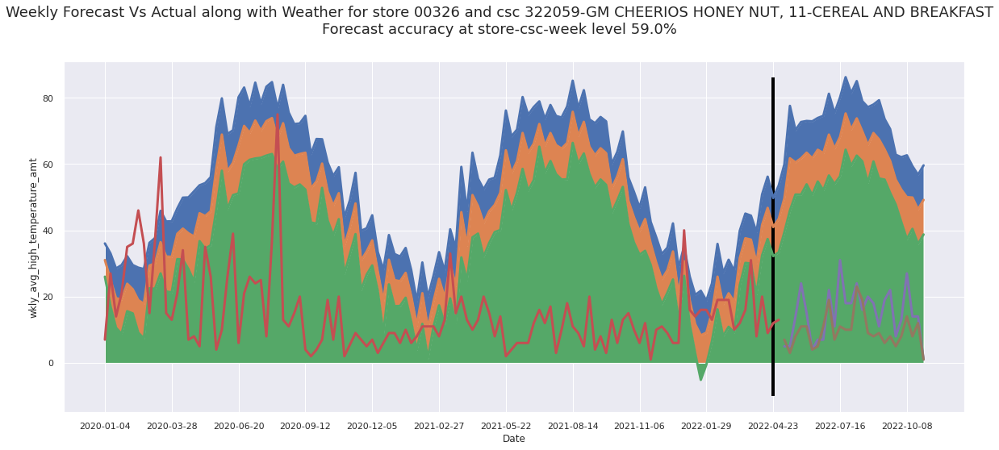

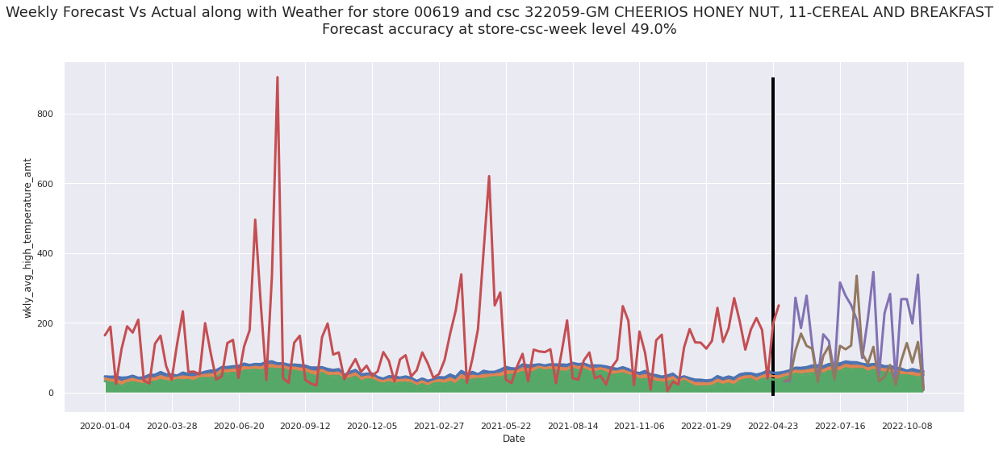

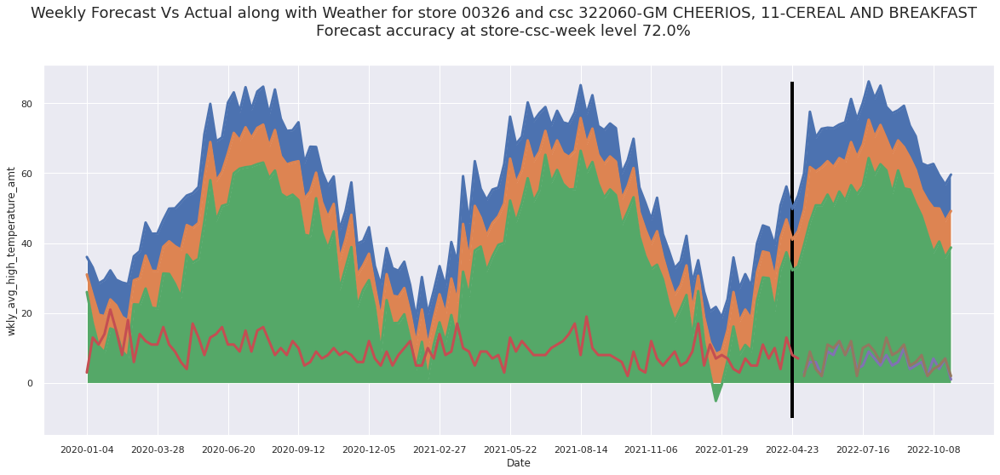

...

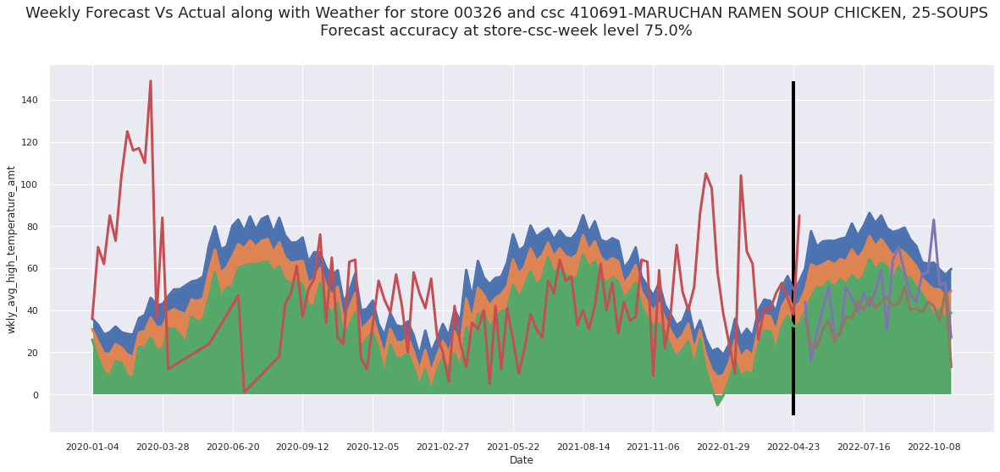

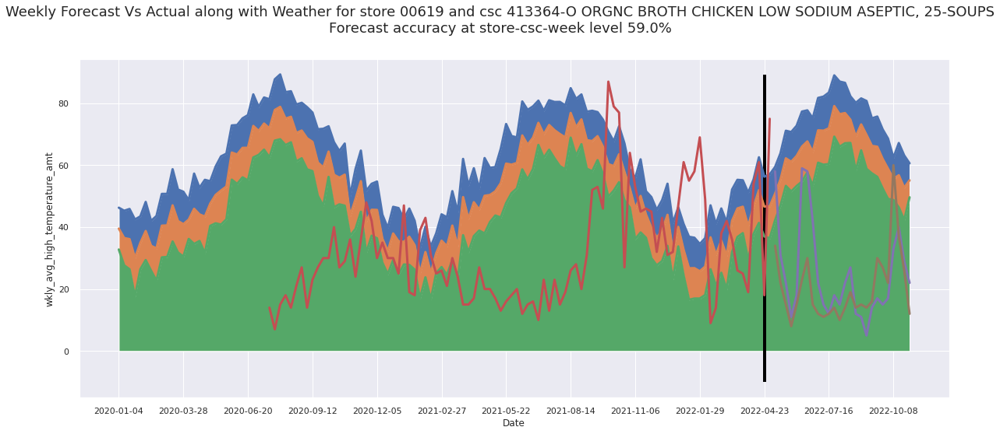

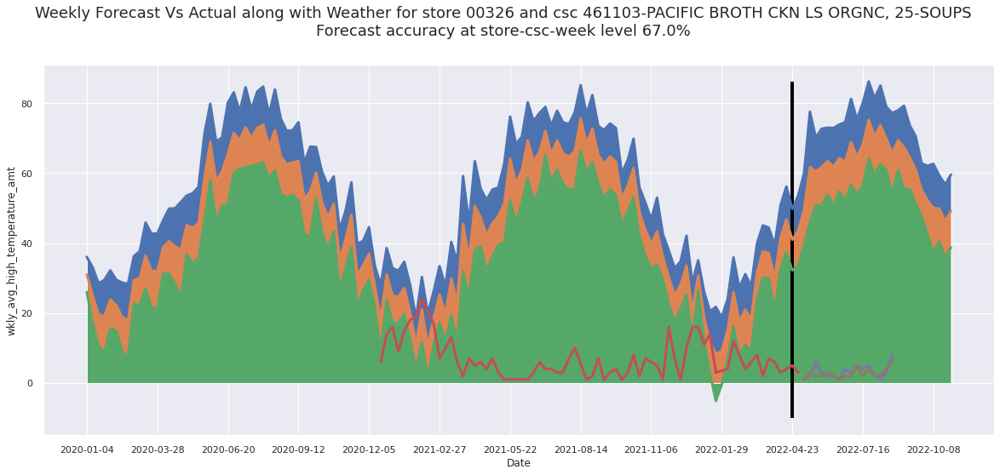

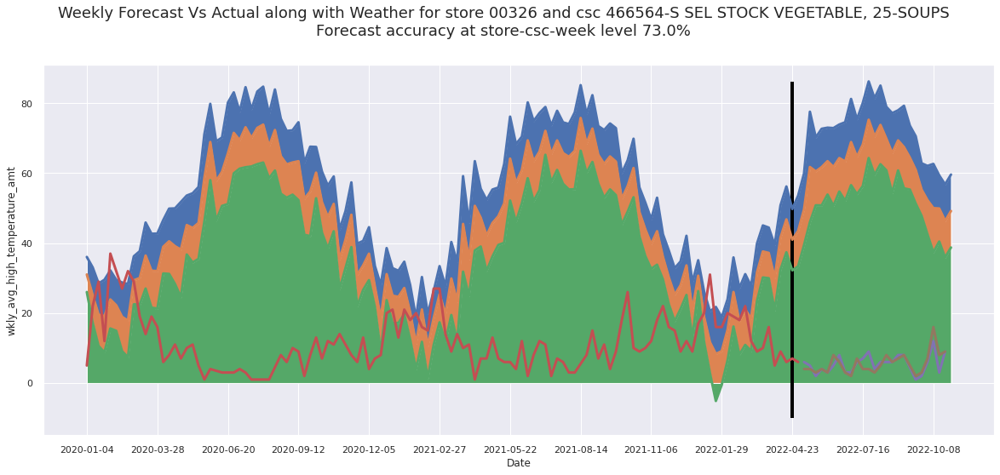

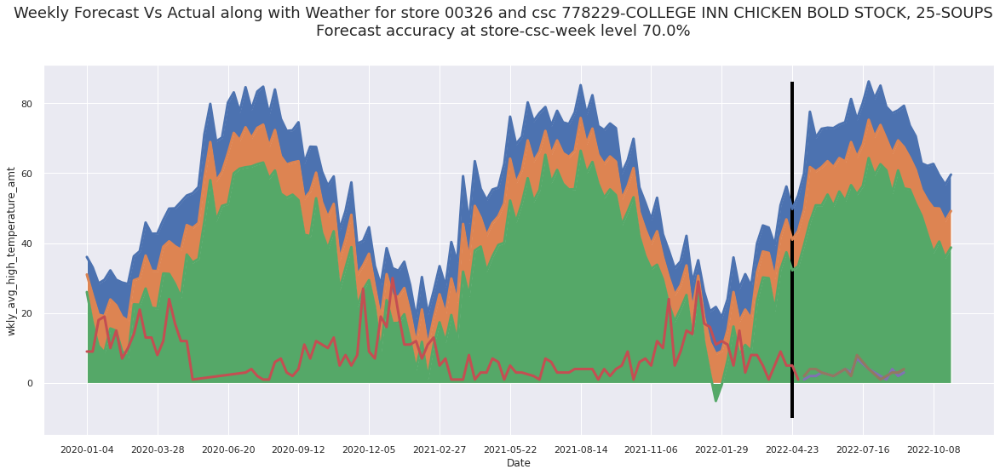

In [ ]:
for e in df_wkly[['store_id', 'csc']].drop_duplicates().values:
    store_id = e[0]
    csc = e[1]
    csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    accuracy = df_kpi_wkly[(df_kpi_wkly.store_id == store_id) & (df_kpi_wkly.csc == csc)]['accuracy_wkly'].values[0]
    #print(store_id, csc_info, smic_ctg_info)

    #fig, ax = plt.subplots(figsize=(20, 9))
    #sns.set_style('darkgrid')
    sns.set(rc={'figure.figsize':(20,8)})

    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].reset_index(), 
                      x ='week_end_date', 
                      y = 'wkly_avg_high_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].reset_index(), 
                      x ='week_end_date', 
                      y = 'wkly_avg_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].reset_index(), 
                      x ='week_end_date', 
                      y = 'wkly_avg_low_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].index, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_high_temperature_amt)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].index, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_temperature_amt)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].index, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_low_temperature_amt)

    ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == store_id) & (df_txn_weekly.consumer_selling_cd == csc)].reset_index(), 
                      x ='week_end_date', 
                      y = 'total_item_qty',
                      palette='magma',
                      lw=3)
    ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)].reset_index(), 
                      x ='week_end_date', 
                      y = 'y_test_actual_transformed',
                      palette='magma',
                      lw=3)
    ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)].reset_index(), 
                      x ='week_end_date', 
                      y = 'y_test_predicted_transformed',
                      palette='magma',
                      lw=3)
    ax.vlines(x=120, 
              ymin=-10, 
              ymax=max(df_txn_weekly[(df_txn_weekly.store_id == store_id) & (df_txn_weekly.consumer_selling_cd == csc)]['total_item_qty'].max(),
                       df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)]['y_test_actual_transformed'].max(),
                       df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)]['y_test_predicted_transformed'].max(),
                       df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id]['wkly_avg_high_temperature_amt'].max()
                      ), 
              color='black', 
              ls='solid', 
              linewidth = 4)

    ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
    #plt.legend(bbox_to_anchor=(1, 1))
    plt.xlabel('Date')
    
    #plt.figure(figsize=(200, 100))
    #df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot(figsize=(10, 8))
    #plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    title_string = f"Weekly Forecast Vs Actual along with Weather for store {store_id.astype(str).zfill(5)} and csc {csc_info}, {smic_grp_info}\nForecast accuracy at store-csc-week level {np.round(accuracy)}%"
    #subtitle_string = f"Forecast accuracy at store-csc-week level {np.round(accuracy)}%"
    plt.suptitle(title_string, y=1.00, fontsize=18)
    #plt.title(subtitle_string, y=1.00, fontsize=17)
    plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.png')
    plt.show(block = False)
    #plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.png')
    #plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.pdf', dpi=300)


In [ ]:
df_wkly.reset_index(inplace=True)
df_wkly.head()

,week_end_date,store_id,csc,week_start_date,y_test_actual_transformed,y_test_predicted_transformed,zip5,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt,item_dsc,smic_group_cd,smic_group_dsc,smic_category_cd,smic_category_dsc
0,2022-05-07,326,146399,2022-05-01,4.0,6.0,05673,59.88571429,39.41428571,49.65000000,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
1,2022-05-14,326,146399,2022-05-08,5.0,7.0,05673,77.55714286,45.95714286,61.75714286,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
2,2022-05-21,326,146399,2022-05-15,5.0,6.0,05673,70.21428571,50.80000000,60.50714286,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
3,2022-05-28,326,146399,2022-05-22,3.0,4.0,05673,72.68571429,50.77142857,61.72857143,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH
4,2022-06-04,326,146399,2022-05-29,6.0,3.0,05673,73.00000000,53.87142857,63.43571429,S SEL BROTH CHICKEN ASEPTIC,25,SOUPS,15,BOUILON BROTH


In [ ]:
df_wkly.sort_values(by=['week_end_date', 'smic_group_cd', 'csc'], inplace = True)
df_wkly.to_csv('weekly_forecast.csv')

In [ ]:
df_kpi_wkly_extended = pd.merge(df_kpi_wkly, df_upc_2[['consumer_selling_cd','item_dsc','smic_group_dsc','smic_group_cd','smic_category_dsc','smic_category_cd']], how='inner', left_on='csc', right_on='consumer_selling_cd')
df_kpi_wkly_extended.drop(columns = ['consumer_selling_cd'], axis = 1, inplace = True)
df_kpi_wkly_extended

,store_id,csc,wmape_wkly,accuracy_wkly,item_dsc,smic_group_dsc,smic_group_cd,smic_category_dsc,smic_category_cd
0,326,146629,18.08118081,81.91881919,CMPBL COND SOUP TOMATO,SOUPS,25,CONDENSED MULTI-SERVE EATING SOUP,1
1,619,146629,24.33758587,75.66241413,CMPBL COND SOUP TOMATO,SOUPS,25,CONDENSED MULTI-SERVE EATING SOUP,1
2,619,322087,19.63788301,80.36211699,GEN MILLS SHPR LG CEREAL,CEREAL AND BREAKFAST,11,READY TO EAT CEREAL,1
3,326,322087,40.59405941,59.40594059,GEN MILLS SHPR LG CEREAL,CEREAL AND BREAKFAST,11,READY TO EAT CEREAL,1
4,326,460651,20.00000000,80.00000000,QUAKER CEREAL LIFE,CEREAL AND BREAKFAST,11,READY TO EAT CEREAL,1
5,326,322325,20.80000000,79.20000000,QUAKER OATMEAL HOT CEREAL OLD FASHIONED,CEREAL AND BREAKFAST,11,HOT CEREAL,5
6,619,322082,22.26890756,77.73109244,GM CHEERIOS,CEREAL AND BREAKFAST,11,READY TO EAT CEREAL,1
7,326,322082,30.64516129,69.35483871,GM CHEERIOS,CEREAL AND BREAKFAST,11,READY TO EAT CEREAL,1
8,619,146385,22.58706468,77.41293532,LIPTON SOUP ONION MIX,SOUPS,25,DRY SOUP,10
9,326,410691,25.18518519,74.81481481,MARUCHAN RAMEN SOUP CHICKEN,SOUPS,25,DRY SOUP,10


In [ ]:
df_kpi_wkly_extended.groupby(['store_id', 'smic_group_cd']).agg({'accuracy_wkly' : [np.max,np.mean,np.median,np.min]})

accuracy_wkly                                       
                                amax         mean       median         amin
store_id smic_group_cd                                                     
326      11              80.00000000  68.90026705  68.50094877  59.02061856
         25              81.91881919  69.62976853  68.87448489  60.71428571
619      11              80.36211699  63.03254990  68.21430245  31.98019802
         25              77.41293532  66.91196186  66.96083233  58.38926174

In [ ]:
df_kpi_wkly_extended.groupby(['store_id', 'smic_group_cd', 'smic_category_cd']).agg({'accuracy_wkly' : [np.max,np.mean,np.median,np.min]})

accuracy_wkly               \
                                                 amax         mean   
store_id smic_group_cd smic_category_cd                              
326      11            1                  80.00000000  67.75585228   
                       5                  79.20000000  79.20000000   
         25            1                  81.91881919  81.91881919   
                       10                 74.81481481  74.81481481   
                       15                 72.72727273  68.40710936   
                       20                 60.71428571  60.71428571   
619      11            1                  80.36211699  63.03254990   
         25            1                  75.66241413  71.28509495   
                       10                 77.41293532  77.41293532   
                       15                 68.32971800  63.60089437   
                       20                 72.74275980  65.56601077   

                                                                   
                                              median         amin  
store_id smic_group_cd smic_category_cd                            
326      11            1                 67.64705882  59.02061856  
                       5                 79.20000000  79.20000000  
         25            1                 81.91881919  81.91881919  
                       10                74.81481481  74.81481481  
                       15                67.96875000  63.79310345  
                       20                60.71428571  60.71428571  
619      11            1                 68.21430245  31.98019802  
         25            1                 71.28509495  66.90777577  
                       10                77.41293532  77.41293532  
                       15                64.08934708  58.75968992  
                       20                65.56601077  58.38926174

In [ ]:
from PIL import Image
import glob
imagelist = []

for idx, image_file_name in enumerate(glob.glob('*.png')):
    #print(image_file_name)
    image = Image.open(image_file_name)
    converted_image = image.convert('RGB')
    imagelist.append(converted_image)
converted_image.save(r'merged_images.pdf',save_all=True, append_images=imagelist[:-1])

# ***End of my experimentation***